<a href="https://colab.research.google.com/github/areegtarek/RFM-Analysis-Customer-segmentation/blob/main/RFM_Analysis_For_Clustring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Merchant Category Prediction**

where we will be exploring various techniques for customer segmentation and analysis, with a focus on the Brazilian payment brand, Elo. Specifically, we will be using Elo's transactional and promotional data to identify the most relevant opportunities for customers, by analyzing their loyalty behavior.

We will start with RFM analysis, a powerful technique for segmenting customers based on their recency, frequency, and monetary value of transactions. We will then explore a simple rule-based approach known as the "Business Analyst Way," which can help us identify key customer segments and their characteristics.

Next, we will use clustering algorithms to segment customers based on a range of features beyond just RFM, such as demographic information or purchase behavior. We will also explore principal component analysis (PCA) as a way to reduce the dimensionality of our data and identify the most relevant features for segmentation.

Finally, we will use frequent pattern mining to identify common patterns of purchasing behavior and uncover potential opportunities for targeted promotions or discounts.

# **Dataset Description**

The **historical_transactions.csv** and **new_merchant_transactions.csv** files contain information about each card's transactions. **historical_transactions.csv** contains up to 3 months' worth of transactions for every card at any of the provided merchant_ids. **new_merchant_transactions.csv** contains the transactions at new merchants (merchant_ids that this particular card_id has not yet visited) over a period of two months.

**merchants.csv** contains aggregate information for each merchant_id represented in the data set.

## **What should I expect the data format to be?**
**The data is formatted as follows:**

**user_score.csv** contain card_ids and information about the card itself - the first month the card was active, etc.

**historical_transactions.csv** and **new_merchant_transactions.csv** are designed to be joined with **user_score.csv** , and **merchants.csv** . They contain information about transactions for each card, as described above.

merchants can be joined with the transaction sets to provide additional merchant-level information.



## **File descriptions**
**userscore.csv:**
- card_id: A unique identifier for each card
- first_active_month: The month in which the card was first used
- feature_1: An anonymized categorical feature related to the card
- feature_2: An anonymized categorical feature related to the card
- feature_3: An anonymized categorical feature related to the card
- score: The loyalty score for each card, which is the target variable for prediction.

**merchants.csv:**

- merchant_id: A unique identifier for each merchant
- merchant_group_id: An anonymized categorical feature indicating the merchant group to which the merchant belongs
- merchant_category_id: An anonymized categorical feature indicating the type of merchant (e.g., department store, restaurant, etc.)
- subsector_id: An anonymized categorical feature indicating the subsector to which the merchant belongs
- numerical_1: A numerical feature related to the merchant
- numerical_2: A numerical feature related to the merchant
- category_1: An anonymized categorical feature related to the merchant
- most_recent_sales_range: An anonymized categorical feature indicating the sales volume of the merchant in the most recent period
- most_recent_purchases_range: An anonymized categorical feature indicating the number of purchases made at the merchant in the most recent period
- avg_sales_lag3: A numerical feature indicating the average sales volume of the merchant over the previous3 months
- avg_purchases_lag3: A numerical feature indicating the average number of purchases made at the merchant over the previous 3 months
- active_months_lag3: A numerical feature indicating the number of months in the previous 3 months during which the merchant had sales
- avg_sales_lag6: A numerical feature indicating the average sales volume of the merchant over the previous 6 months
- avg_purchases_lag6: A numerical feature indicating the average number of purchases made at the merchant over the previous 6 months
- active_months_lag6: A numerical feature indicating the number of months in the previous 6 months during which the merchant had sales
- avg_sales_lag12: A numerical feature indicating the average sales volume of the merchant over the previous 12 months
- avg_purchases_lag12: A numerical feature indicating the average number of purchases made at the merchant over the previous 12 months
- active_months_lag12: A numerical feature indicating the number of months in the previous 12 months during which the merchant had sales.

**historical transactions.csv and new merchant transactions.csv:**
- card_id: A unique identifier for each card
- merchant_id: A unique identifier for each merchant
- month_lag: A numerical feature indicating the number of months between the transaction and the reference date (i.e., the last month in the dataset)
- purchase_amount: A numerical feature indicating the amount of the transaction in USD- authorized_flag: A binary feature indicating whether the transaction was authorized or not (Y/N)
- category_1: A binary feature indicating whether the transaction was made in a category 1 merchant or not (Y/N)
- category_2: An anonymized categorical feature indicating the type of category 2 merchant in which the transaction was made
- category_3: An anonymized categorical feature indicating the type of category 3 merchant in which the transaction was made.

In [ ]:
!pip install missingno

In [ ]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import time
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from collections import Counter
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, LabelEncoder, RobustScaler, StandardScaler

# Set Pandas display options
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', lambda x: f'{x:.5f}')

# Set Seaborn style
sns.set_style('darkgrid')

# Set NumPy print options
np.set_printoptions(suppress=True)

# Import tqdm and set up progress bar
import tqdm
from tqdm import tqdm
tqdm.pandas()

In [ ]:
# Read in the dataframes
usersc_df = pd.read_csv("userscore.csv")
merch_df = pd.read_csv('merchants.csv')
hist_trans_df = pd.read_csv('historical_transactions.csv')
new_trans_df = pd.read_csv('new_merchant_transactions.csv')

## **Loyalty Score Data Analysis:**

In [ ]:
usersc_df.head()

,card_id,first_active_month,feature_1,feature_2,feature_3,score
0,C_ID_92a2005557,Jun-17,5,2,1,-0.82028
1,C_ID_3d0044924f,Jan-17,4,1,0,0.39291
2,C_ID_d639edf6cd,Aug-16,2,2,0,0.68806
3,C_ID_186d6a6901,Sep-17,4,3,0,0.14250
4,C_ID_cdbd2c0db2,Nov-17,1,3,0,-0.15975


In [ ]:
# Convert the date column to datetime format
usersc_df['first_active_month'] = pd.to_datetime(usersc_df['first_active_month'], format='%b-%y')

In [ ]:
usersc_df.head()

,card_id,first_active_month,feature_1,feature_2,feature_3,score
0,C_ID_92a2005557,2017-06-01,5,2,1,-0.82028
1,C_ID_3d0044924f,2017-01-01,4,1,0,0.39291
2,C_ID_d639edf6cd,2016-08-01,2,2,0,0.68806
3,C_ID_186d6a6901,2017-09-01,4,3,0,0.14250
4,C_ID_cdbd2c0db2,2017-11-01,1,3,0,-0.15975


### **Check Missing Values**

In [ ]:
usersc_df.isna().sum()

card_id               0
first_active_month    0
feature_1             0
feature_2             0
feature_3             0
score                 0
dtype: int64

**Observations** There is no nulls values

In [ ]:
usersc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201917 entries, 0 to 201916
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   card_id             201917 non-null  object        
 1   first_active_month  201917 non-null  datetime64[ns]
 2   feature_1           201917 non-null  int64         
 3   feature_2           201917 non-null  int64         
 4   feature_3           201917 non-null  int64         
 5   score               201917 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 9.2+ MB


In [ ]:
usersc_df.describe()

,first_active_month,feature_1,feature_2,feature_3,score
count,201917,201917.00000,201917.00000,201917.00000,201917.00000
mean,2017-01-15 00:30:16.001624320,3.10531,1.74541,0.56557,-0.39364
min,2011-11-01 00:00:00,1.00000,1.00000,0.00000,-33.21928
25%,2016-10-01 00:00:00,2.00000,1.00000,0.00000,-0.88311
50%,2017-04-01 00:00:00,3.00000,2.00000,1.00000,-0.02344
75%,2017-09-01 00:00:00,4.00000,2.00000,1.00000,0.76545
max,2018-02-01 00:00:00,5.00000,3.00000,1.00000,17.96507
std,NaN,1.18616,0.75136,0.49568,3.85050


For the "first_active_month" column, NaN is shown because the standard deviation of date values does not make sense and is not calculated.

It is worth noting that calculating the mean of date values does not always make sense, as dates do not have a natural zero point. In some cases, it may be more appropriate to use other metrics, such as the median or mode, to summarize the central tendency of date values.

In [ ]:
usersc_df.duplicated().sum()

0

**Observations** There is no duplicated values

### **Check Normality and Outliers**

### **loyalty score**

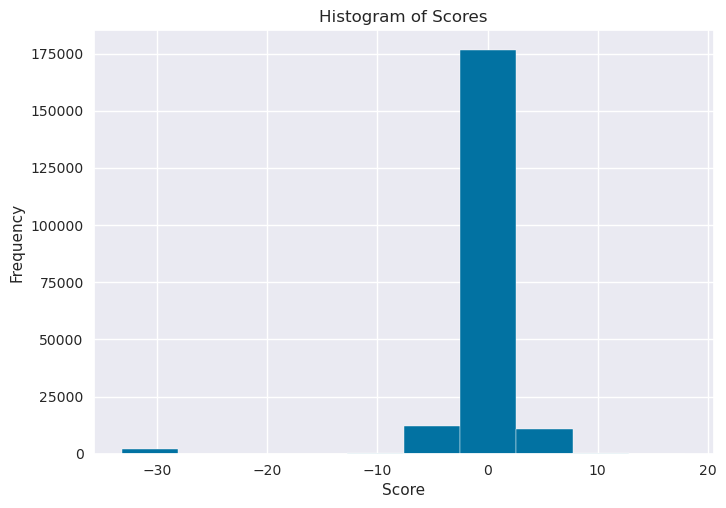

In [ ]:
# Draw a histogram of the "score" column
usersc_df['score'].hist()

# Set the title and axis labels
plt.title('Histogram of Scores')
plt.xlabel('Score')
plt.ylabel('Frequency')

# Show the plot
plt.show()

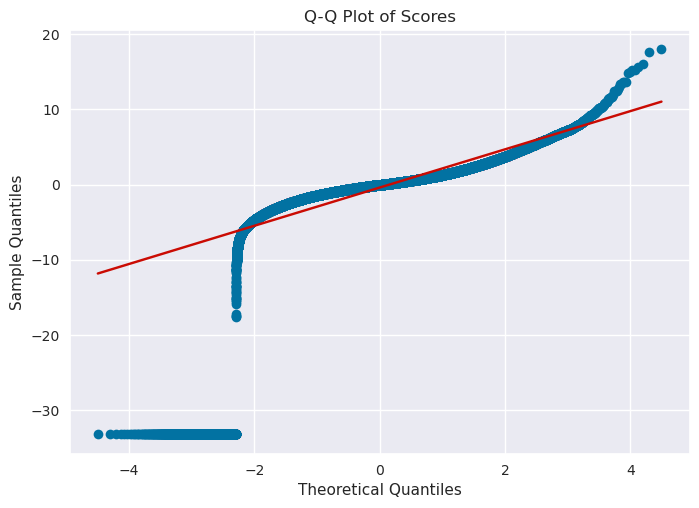

In [ ]:
# Generate a Q-Q plot for the "score" column
stats.probplot(usersc_df['score'], plot=plt)

# Set the title and axis labels
plt.title('Q-Q Plot of Scores')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

# Show the plot
plt.show()

In [ ]:
# Count the values of the "score" column
# Count the values of the "score" column
counts = usersc_df['score'].value_counts()

# Calculate the percentages of values in different ranges
total_count = len(usersc_df)
range_a_count = len(usersc_df.loc[(usersc_df['score'] >= -30) & (usersc_df['score'] < -10)])
range_b_count = len(usersc_df.loc[(usersc_df['score'] >= -10) & (usersc_df['score'] < 0)])
range_c_count = len(usersc_df.loc[(usersc_df['score'] >= 0) & (usersc_df['score'] <= 10)])
range_d_count = len(usersc_df.loc[(usersc_df['score'] > -1) & (usersc_df['score'] < 1)])
range_e_count = len(usersc_df.loc[(usersc_df['score'] >= -1) & (usersc_df['score'] < 0)])
range_f_count = len(usersc_df.loc[(usersc_df['score'] >= 0) & (usersc_df['score'] <= 1)])
range_a_percent = range_a_count / total_count * 100
range_b_percent = range_b_count / total_count * 100
range_c_percent = range_c_count / total_count * 100
range_d_percent = range_d_count / total_count * 100
range_e_percent = range_e_count / total_count * 100
range_f_percent = range_f_count / total_count * 100

# Print the results
print('Value Counts:')
print(counts)
print('Percentages:')
print('Values between -30 and -10:', round(range_a_percent, 2), '%')
print('Values between -10 and 0:', round(range_b_percent, 2), '%')
print('Values between 0 and 10:', round(range_c_percent, 2), '%')
print('Values between -1 and 1:', round(range_d_percent, 2), '%')
print('Values between -1 and 0:', round(range_e_percent, 2), '%')
print('Values between 0 and 1:', round(range_f_percent, 2), '%')

Value Counts:
score
-33.21928    2207
0.00000      1630
1.00000       117
-1.00000       81
-0.58496       35
             ... 
-1.19915        1
0.49168         1
0.99168         1
-2.00611        1
-1.85941        1
Name: count, Length: 197110, dtype: int64
Percentages:
Values between -30 and -10: 0.03 %
Values between -10 and 0: 49.73 %
Values between 0 and 10: 49.12 %
Values between -1 and 1: 57.03 %
Values between -1 and 0: 28.24 %
Values between 0 and 1: 28.89 %


In [ ]:
# Calculate the number of values below -30
num_below_30 = len(usersc_df.loc[usersc_df['score'] < -30])

# Calculate the percentage of values below -30
percentage_below_30 = (num_below_30 / len(usersc_df)) * 100

# Calculate the number of values over -30
num_over_30 = len(usersc_df.loc[usersc_df['score'] >= -30])

# Calculate the percentage of values over -30
percentage_over_30 = (num_over_30 / len(usersc_df)) * 100

# Print the results
print(f'Number of values below -30: {num_below_30}')
print(f'Percentage of values below -30: {percentage_below_30:.2f}%')
print(f'Number of values over or equal to -30: {num_over_30}')
print(f'Percentage of values over or equal to -30: {percentage_over_30:.2f}%')

Number of values below -30: 2207
Percentage of values below -30: 1.09%
Number of values over or equal to -30: 199710
Percentage of values over or equal to -30: 98.91%


**Observations**

From loyalty score distribution in a dataset:
it seems that the loyalty scores are not normally distributed, but are mostly centered around 0 and have a relatively normal distribution, except for a small number of outliers with very low scores that may require further investigation.

**The ranges and their corresponding percentages are:**

- Values between -30 and -10: 0.03%
- Values between -10 and 0: 49.73%
- Values between 0 and 10: 49.12%
- Values between -1 and 1: 57.03%
- Values between -1 and 0: 28.24%
- Values between 0 and 1: 28.89%

The number of values below -30 is 2207, accounting for 1.09% of the total values. It seems to be an outliers but we needed to investigate if we can remove these points or not

The number of values over or equal to -30 is 199710, accounting for 98.91% of the total values.

### ***Univariante Analysis***

In [ ]:
print(usersc_df['feature_1'].unique()); print(usersc_df['feature_2'].unique()); print(usersc_df['feature_3'].unique())

[5 4 2 1 3]
[2 1 3]
[1 0]


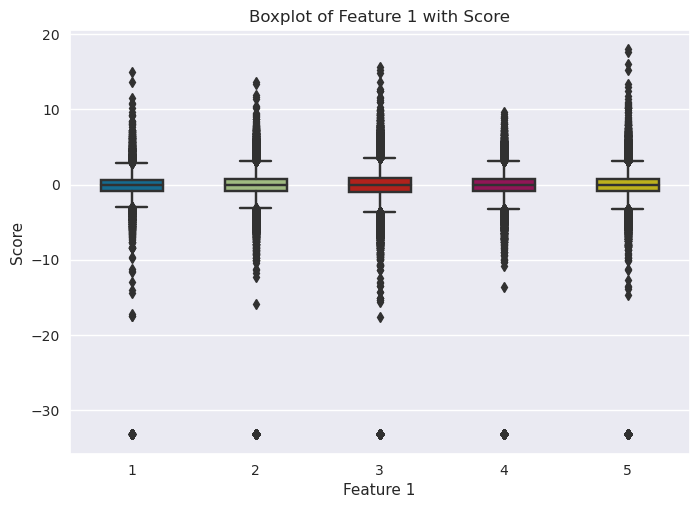

In [ ]:
# Create a boxplot of feature_1 with score
sns.boxplot(x='feature_1', y='score', data=usersc_df, width=0.5)

# Set the plot title and labels
plt.title('Boxplot of Feature 1 with Score')
plt.xlabel('Feature 1')
plt.ylabel('Score')

# Show the plot
plt.show()

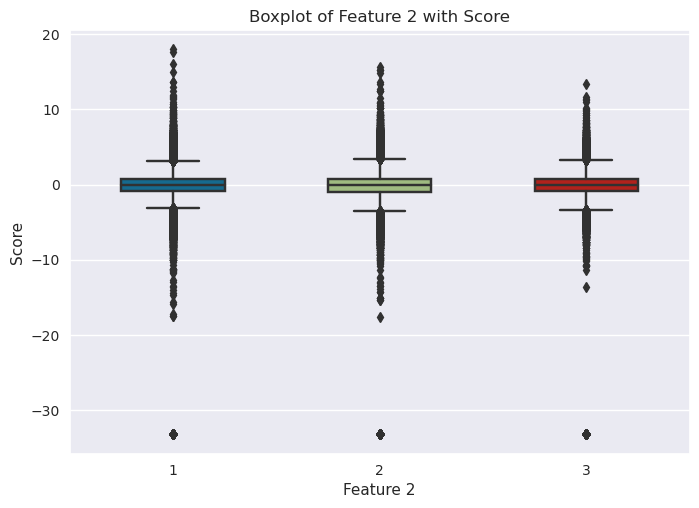

In [ ]:
# Create a boxplot of feature_1 with score
sns.boxplot(x='feature_2', y='score', data=usersc_df, width=0.5)

# Set the plot title and labels
plt.title('Boxplot of Feature 2 with Score')
plt.xlabel('Feature 2')
plt.ylabel('Score')

# Show the plot
plt.show()

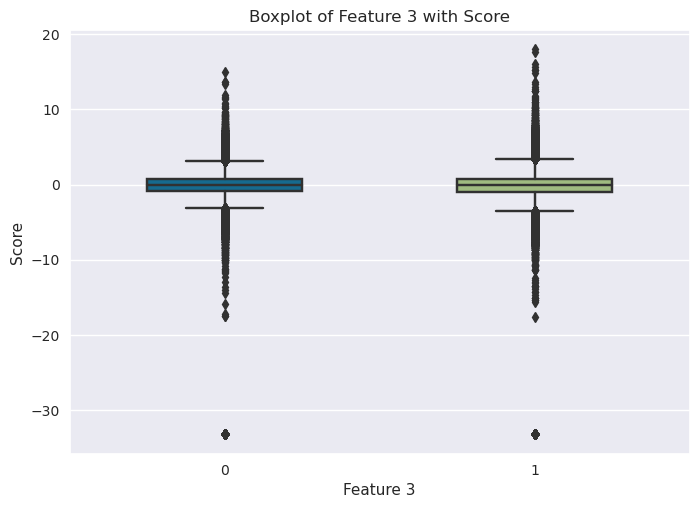

In [ ]:
# Create a boxplot of feature_1 with score
sns.boxplot(x='feature_3', y='score', data=usersc_df, width=0.5)

# Set the plot title and labels
plt.title('Boxplot of Feature 3 with Score')
plt.xlabel('Feature 3')
plt.ylabel('Score')

# Show the plot
plt.show()

**Observations**
Categorical features feature_1,feature_2 and feature_3 are almost equally important for loyalty score prediction as it has spread equally. Also one thing is common in all the features are few points are above -30 which may not be the outliers and having significant impact on evaluation.

In [ ]:
'''# Create data for the pie chart
# Set up the plot
fig, ax = plt.subplots()

# Create the pie chart
ax.pie(usersc_df['feature_1'], startangle=90, counterclock=False, labeldistance=1.1, autopct='%1.1f%%')
ax.pie(usersc_df['feature_2'], startangle=90, counterclock=False, labeldistance=0.8, autopct='%1.1f%%')
ax.pie(usersc_df['feature_3'], startangle=90, counterclock=False, labeldistance=0.5, autopct='%1.1f%%')

# Add a title and legend
ax.set_title('Pie chart of Three Features')
ax.legend(['Feature_1', 'Feature_2', 'Feature_3'], loc='upper right')
# Show the plot
plt.show()'''

"# Create data for the pie chart\n# Set up the plot\nfig, ax = plt.subplots()\n\n# Create the pie chart\nax.pie(usersc_df['feature_1'], startangle=90, counterclock=False, labeldistance=1.1, autopct='%1.1f%%')\nax.pie(usersc_df['feature_2'], startangle=90, counterclock=False, labeldistance=0.8, autopct='%1.1f%%')\nax.pie(usersc_df['feature_3'], startangle=90, counterclock=False, labeldistance=0.5, autopct='%1.1f%%')\n\n# Add a title and legend\nax.set_title('Pie chart of Three Features')\nax.legend(['Feature_1', 'Feature_2', 'Feature_3'], loc='upper right')\n# Show the plot\nplt.show()"

**Observations**

We have 5 categories for feature_1 column, 3 categories for feature_2 column and 2 categories for feature_3 column. As these columns are categorical column we need to one hot encoded it before model training. Above pie plots showing percentages of categories for each of the future respectively.

In [ ]:
# Find the low date and high date for "first_active_month"
low_date = usersc_df['first_active_month'].min()
high_date = usersc_df['first_active_month'].max()

# Print the low date and high date
print('Low date:', low_date)
print('High date:', high_date)

Low date: 2011-11-01 00:00:00
High date: 2018-02-01 00:00:00


**Observations** The cards are activated between ‘2011’ to ‘2018’ for period of 7
s.

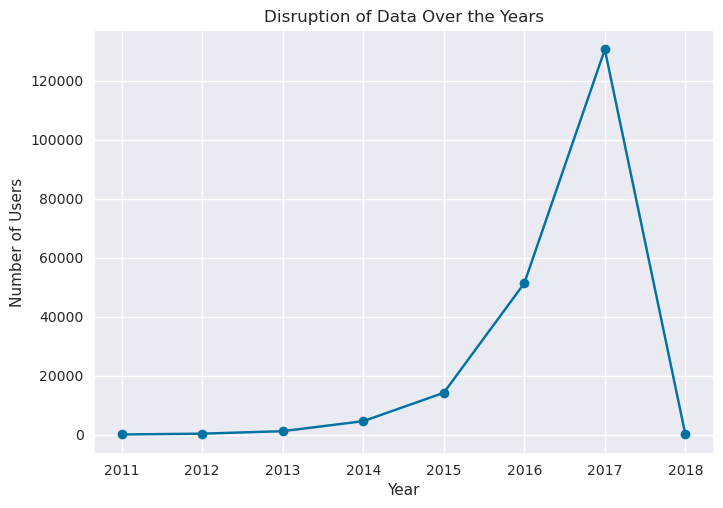

In [ ]:
# Extract the year from the 'first_active_month' column and create a new 'year' column
usersc_df['year'] = usersc_df['first_active_month'].dt.year
usersc_df['month'] = usersc_df['first_active_month'].dt.month

# Count the number of users in each year and sort the values by year
year_count = usersc_df['year'].value_counts().sort_index()

# Plot the data using a line chart
plt.plot(year_count.index, year_count.values, marker='o')

# Add a title and axis labels to the plot
plt.title('Disruption of Data Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Users')

# Show the plot
plt.show()

**Observations** Most of cards are activated in period of 2016 to 2018, as compared to previous years.

### **Correlation Analysis**

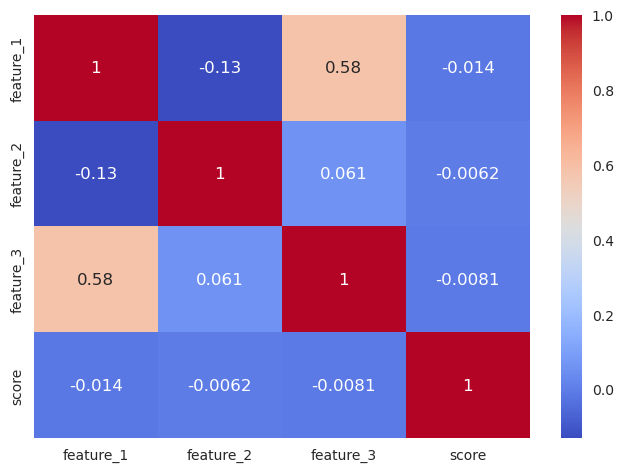

In [ ]:
# Subset the dataframe to include only the columns of interest
subset_df = usersc_df[['feature_1', 'feature_2', 'feature_3', 'score']]

# Calculate the correlation matrix
corr_matrix = subset_df.corr()

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

# Show the plot
plt.show()

## **Merchants Data Analysis:**

In [ ]:
merch_df.head()

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
0,M_ID_838061e48c,8353,792,9,-0.05747,-0.05747,N,E,E,-0.40000,9.66667,3,-2.25000,18.66667,6,-2.32000,13.91667,12,N,242,9,1.00000
1,M_ID_9339d880ad,3184,840,20,-0.05747,-0.05747,N,E,E,-0.72000,1.75000,3,-0.74000,1.29167,6,-0.57000,1.68750,12,N,22,16,1.00000
2,M_ID_e726bbae1e,447,690,1,-0.05747,-0.05747,N,E,E,-82.13000,260.00000,2,-82.13000,260.00000,2,-82.13000,260.00000,2,N,-1,5,5.00000
3,M_ID_a70e9c5f81,5026,792,9,-0.05747,-0.05747,Y,E,E,NaN,1.66667,3,NaN,4.66667,6,NaN,3.83333,12,Y,-1,-1,NaN
4,M_ID_64456c37ce,2228,222,21,-0.05747,-0.05747,Y,E,E,NaN,0.50000,3,NaN,0.36111,6,NaN,0.34722,12,Y,-1,-1,NaN


**Observations** There is an equally 13 null values in (avg_sales_lag3, avg_sales_lag6, avg_sales_lag12) and 11887 null valule in category_2

In [ ]:
merch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334696 entries, 0 to 334695
Data columns (total 22 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   merchant_id                  334696 non-null  object 
 1   merchant_group_id            334696 non-null  int64  
 2   merchant_category_id         334696 non-null  int64  
 3   subsector_id                 334696 non-null  int64  
 4   numerical_1                  334696 non-null  float64
 5   numerical_2                  334696 non-null  float64
 6   category_1                   334696 non-null  object 
 7   most_recent_sales_range      334696 non-null  object 
 8   most_recent_purchases_range  334696 non-null  object 
 9   avg_sales_lag3               334683 non-null  float64
 10  avg_purchases_lag3           334696 non-null  float64
 11  active_months_lag3           334696 non-null  int64  
 12  avg_sales_lag6               334683 non-null  float64
 13 

In [ ]:
merch_df.describe()

,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,city_id,state_id,category_2
count,334696.00000,334696.00000,334696.00000,334696.00000,334696.00000,334683.00000,334696.00000,334696.00000,334683.00000,334696.00000,334696.00000,334683.00000,334696.00000,334696.00000,334696.00000,334696.00000,322809.00000
mean,31028.73614,423.13166,25.11640,0.01148,0.00810,13.83299,inf,2.99411,21.65079,inf,5.94740,25.22771,inf,11.59933,102.91793,11.86094,2.38000
std,31623.04343,252.89805,9.80737,1.09815,1.07050,2395.49000,NaN,0.09525,3947.10810,NaN,0.39494,5251.84216,NaN,1.52014,107.09067,6.17689,1.56266
min,1.00000,-1.00000,-1.00000,-0.05747,-0.05747,-82.13000,0.33350,1.00000,-82.13000,0.16704,1.00000,-82.13000,0.09833,1.00000,-1.00000,-1.00000,1.00000
25%,3612.00000,222.00000,19.00000,-0.05747,-0.05747,0.88000,0.92365,3.00000,0.85000,0.90225,6.00000,0.85000,0.89833,12.00000,-1.00000,9.00000,1.00000
50%,19900.00000,373.00000,27.00000,-0.05747,-0.05747,1.00000,1.01667,3.00000,1.01000,1.02696,6.00000,1.02000,1.04336,12.00000,69.00000,9.00000,2.00000
75%,51707.25000,683.00000,33.00000,-0.04756,-0.04756,1.16000,1.14652,3.00000,1.23000,1.21558,6.00000,1.29000,1.26648,12.00000,182.00000,16.00000,4.00000
max,112586.00000,891.00000,41.00000,183.73511,182.07932,851844.64000,inf,3.00000,1513959.00000,inf,6.00000,2567408.00000,inf,12.00000,347.00000,24.00000,5.00000


**Observations** (std) is NaN for some columns. This occurs when a column contains only missing values (represented as nan) or infinite values (represented as inf).

In [ ]:
merch_df.duplicated().sum()

0

**Observations** There is no duplicated values

In [ ]:
merch_df.isna().sum()

merchant_id                        0
merchant_group_id                  0
merchant_category_id               0
subsector_id                       0
numerical_1                        0
numerical_2                        0
category_1                         0
most_recent_sales_range            0
most_recent_purchases_range        0
avg_sales_lag3                    13
avg_purchases_lag3                 0
active_months_lag3                 0
avg_sales_lag6                    13
avg_purchases_lag6                 0
active_months_lag6                 0
avg_sales_lag12                   13
avg_purchases_lag12                0
active_months_lag12                0
category_4                         0
city_id                            0
state_id                           0
category_2                     11887
dtype: int64

**Observations** There is an equally 13 null values in (avg_sales_lag3, avg_sales_lag6, avg_sales_lag12) and 11887 null valule in category_2

### **Check Missing Values**

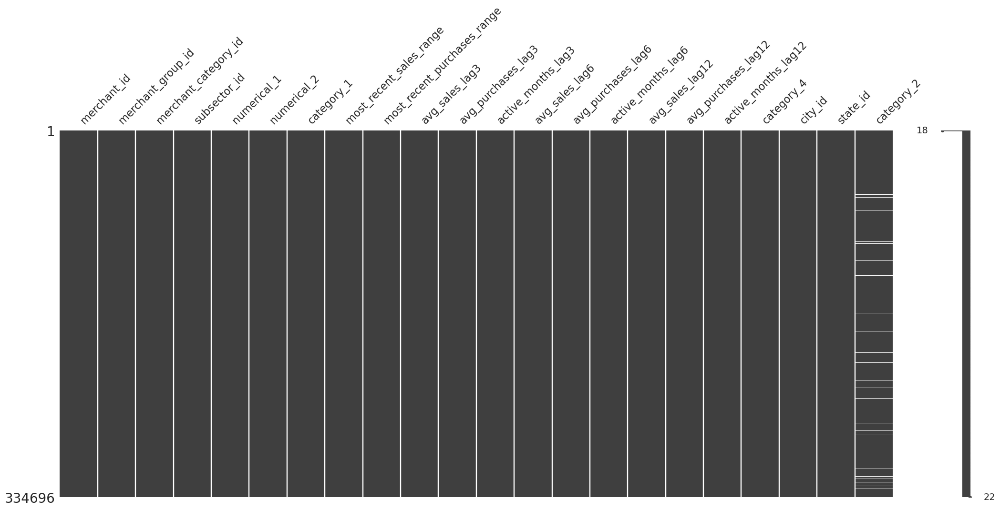

In [ ]:
# Create a visualization of the missing values
msno.matrix(merch_df)

# Show the plot
plt.show()

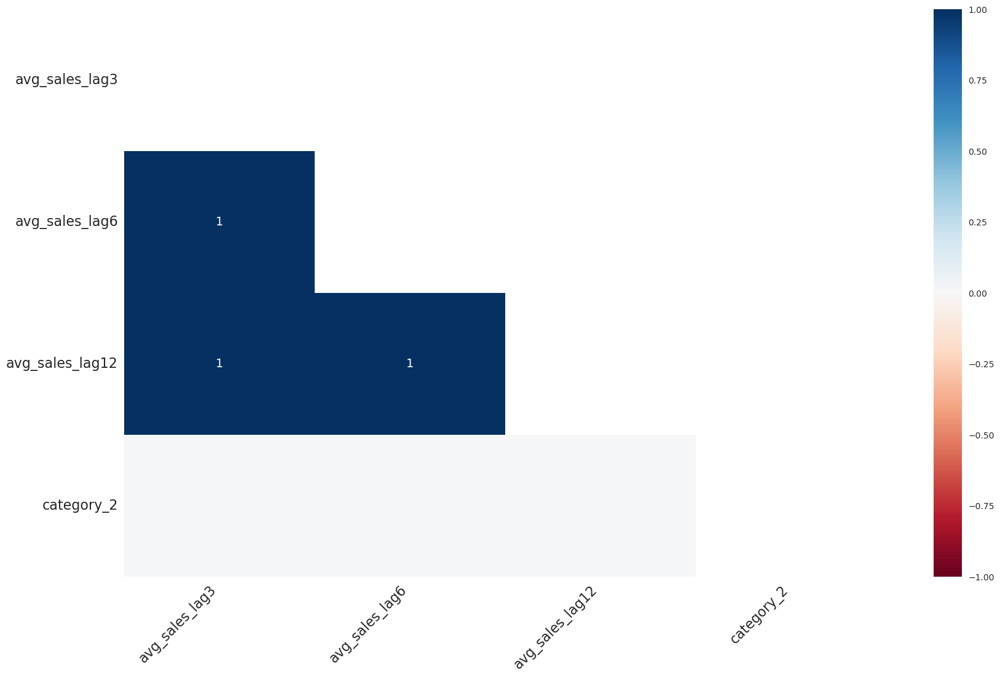

In [ ]:
# Create a heatmap of the correlation between missing values
msno.heatmap(merch_df)

# Show the plot
plt.show()

In [ ]:
# Create a boolean mask for the null values in avg_sales_lag3 column
mask1 = merch_df['avg_sales_lag3'].isnull()

# Create a boolean mask for the null values in avg_sales_lag6 column
mask2 = merch_df['avg_sales_lag6'].isnull()

# Create a boolean mask for the null values in avg_sales_lag12 column
mask3 = merch_df['avg_sales_lag12'].isnull()

# Combine the masks to check for the cases where all three columns have null values
combined_mask = mask1 & mask2 & mask3

# Count the number of rows where all three columns have null values
count = combined_mask.sum()

# Print the count
print(count)

13


In [ ]:
# Create a boolean mask for the null values in category_2 column
mask4 = merch_df['category_2'].isnull()

# Combine the masks to check for the cases where all Four columns have null values
combined_mask = mask1 & mask2 & mask3 & mask4

# Count the number of rows where all Four columns have null values
count = combined_mask.sum()

# Print the count
print(count)

6


**Observations**

There are 13 rows where all three columns have null values, and the null values in these columns (`avg_sales_lag3`, `avg_sales_lag6`, and `avg_sales_lag12`) have null values and occur together.

here are 6 rows in the dataset where all four columns (avg_sales_lag3, avg_sales_lag6, avg_sales_lag12, and category_2) have null values, and the null values in these columns occur together.

that there may be a systematic reason why these values are missing.

It's possible that the null values in these columns are related to a specific time period or to a specific group of observations. Understanding the reason why these values are missing can help to determine the appropriate method for handling them in your analysis.

We can handling missing values with replacing it with estimated values based on the available data.

**Type of missing:**
- avg_sales_lag3, avg_sales_lag6, and avg_sales_lag12 are at Random
- category_2 is Completley at Random

**Mechanism:** General


### **Correlation Analysis**

In [ ]:
# Select all numerical columns in the merchants DataFrame
numerical_features = merch_df.select_dtypes(include=['float64', 'int64'])

# Display the first 10 rows of the numerical features
print(numerical_features.head(10))

   merchant_group_id  merchant_category_id  subsector_id  numerical_1  numerical_2  avg_sales_lag3  avg_purchases_lag3  active_months_lag3  avg_sales_lag6  avg_purchases_lag6  active_months_lag6  avg_sales_lag12  avg_purchases_lag12  active_months_lag12  city_id  state_id  category_2
0               8353                   792             9     -0.05747     -0.05747        -0.40000             9.66667                   3        -2.25000            18.66667                   6         -2.32000             13.91667                   12      242         9     1.00000
1               3184                   840            20     -0.05747     -0.05747        -0.72000             1.75000                   3        -0.74000             1.29167                   6         -0.57000              1.68750                   12       22        16     1.00000
2                447                   690             1     -0.05747     -0.05747       -82.13000           260.00000                   2       

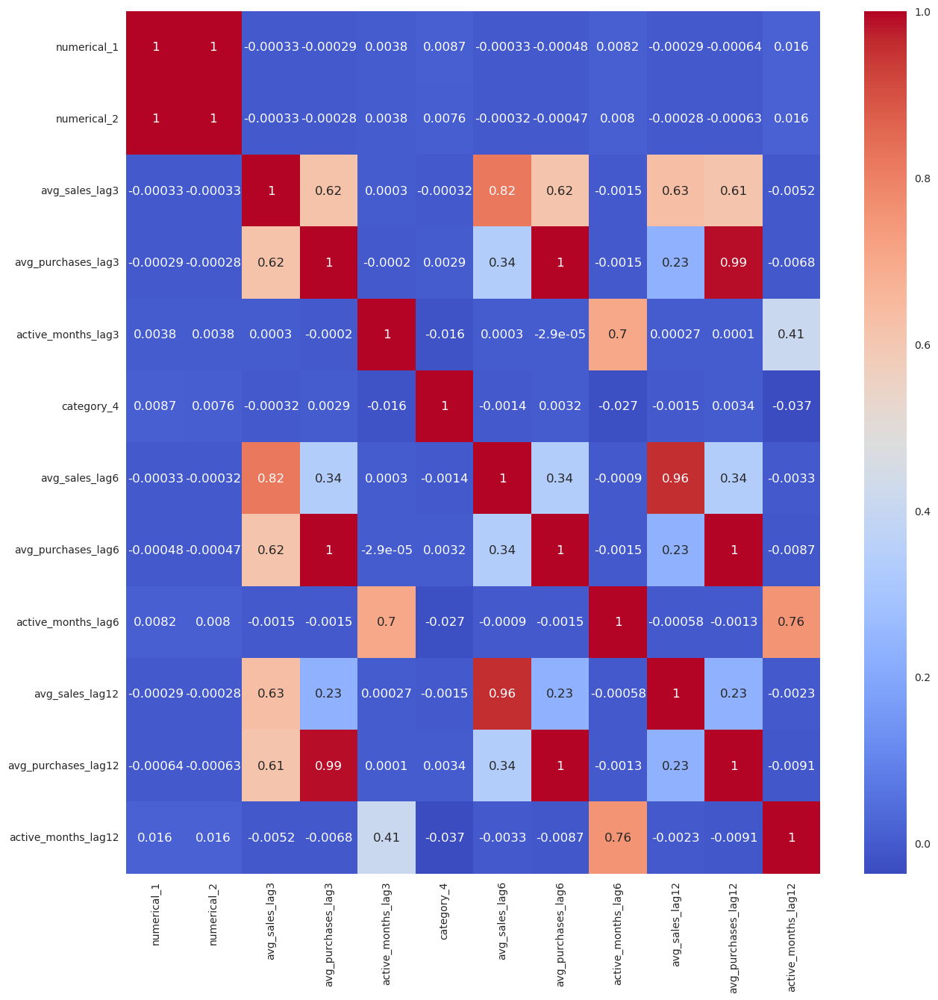

In [ ]:
# Convert the 'category_4' column to a binary format
merch_df['category_4'] = merch_df['category_4'].replace({'Y': 1, 'N': 0})

# Subset the dataframe to include only the columns of interest
subset_df = merch_df[['numerical_1', 'numerical_2', 'avg_sales_lag3', 'avg_purchases_lag3', 'active_months_lag3', 'category_4','avg_sales_lag6',
'avg_purchases_lag6',  'active_months_lag6',  'avg_sales_lag12','avg_purchases_lag12',  'active_months_lag12']]

# Calculate the correlation matrix
corr_matrix = subset_df.corr()

# Create a larger figure
plt.figure(figsize=(15, 15))

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

# Show the plot
plt.show()

In [ ]:
# Stack the correlation matrix into a multi-index series
stacked_corr = corr_matrix.stack()

# Select only the pairs of features that have a correlation greater than 0.9 and are not equal to 1.0
high_corr = stacked_corr[(stacked_corr > 0.9) & (stacked_corr != 1.0)]

# Get the names of the highly correlated features
high_corr_names = high_corr.reset_index()[['level_0', 'level_1']].apply(tuple, axis=1).tolist()

# Print the names of the highly correlated features
print(high_corr_names)

[('numerical_1', 'numerical_2'), ('numerical_2', 'numerical_1'), ('avg_purchases_lag3', 'avg_purchases_lag6'), ('avg_purchases_lag3', 'avg_purchases_lag12'), ('avg_sales_lag6', 'avg_sales_lag12'), ('avg_purchases_lag6', 'avg_purchases_lag3'), ('avg_purchases_lag6', 'avg_purchases_lag12'), ('avg_sales_lag12', 'avg_sales_lag6'), ('avg_purchases_lag12', 'avg_purchases_lag3'), ('avg_purchases_lag12', 'avg_purchases_lag6')]


**Observations**

There is multicollinearity between:
- numeri_1 and numerical_2
- avg_purchases_lag3, avg_purchases_lag6
- avg_purchases_lag3, avg_purchases_lag12
- avg_sales_lag6, avg_sales_lag12

### **Check Normality and Outliers**

In [ ]:
# Randomly sample 10% of the rows from the 'dataset' dataframe
# without replacement, using a random seed of 42
df = merch_df.sample(frac=0.1, replace=False, random_state=42)

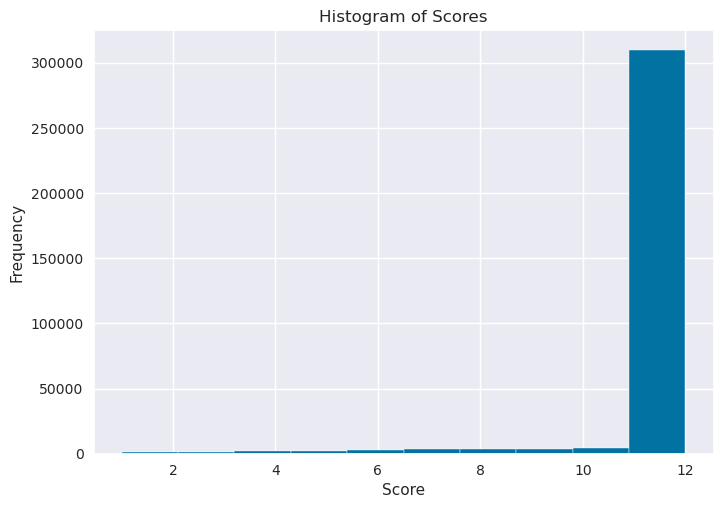

In [ ]:
# Draw a histogram of the "score" column
merch_df['active_months_lag12'].hist()

# Set the title and axis labels
plt.title('Histogram of Scores')
plt.xlabel('Score')
plt.ylabel('Frequency')

# Show the plot
plt.show()

<Axes: >

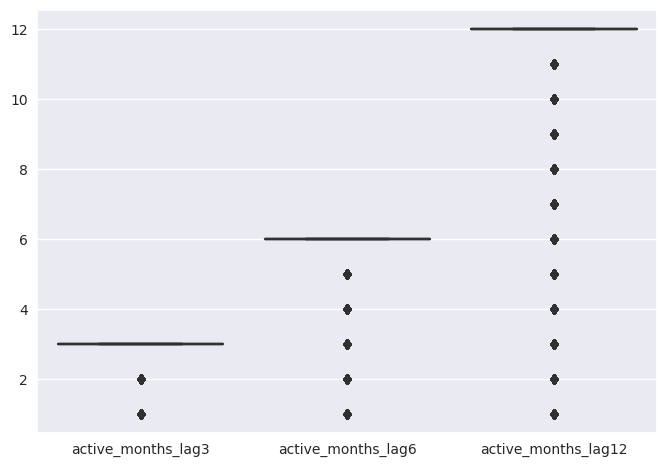

In [ ]:
# Plot a box plot of a numerical feature
sns.boxplot(merch_df[['active_months_lag3','active_months_lag6','active_months_lag12']])

**Observations** Active months lag 12 are very high in the respective features

## **History Merchant Transaction VS. New Transaction Data Analysis:**

### **History Merchant Transaction Data Analysis:**

In [ ]:
hist_trans_df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.70333,2017-06-25 15:33:07,1.00000,16,37
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.73313,2017-07-15 12:10:45,1.00000,16,16
2,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_979ed661fc,-6,-0.72039,2017-08-09 22:04:29,1.00000,16,37
3,Y,C_ID_4e6213e9bc,88,N,0,A,560,M_ID_e6d5ae8ea6,-5,-0.73535,2017-09-02 10:06:26,1.00000,16,34
4,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-11,-0.72287,2017-03-10 01:14:19,1.00000,16,37


In [ ]:
# Convert the date column to datetime format
hist_trans_df['purchase_date'] = pd.to_datetime(hist_trans_df['purchase_date'])

In [ ]:
hist_trans_df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.70333,2017-06-25 15:33:07,1.00000,16,37
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.73313,2017-07-15 12:10:45,1.00000,16,16
2,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_979ed661fc,-6,-0.72039,2017-08-09 22:04:29,1.00000,16,37
3,Y,C_ID_4e6213e9bc,88,N,0,A,560,M_ID_e6d5ae8ea6,-5,-0.73535,2017-09-02 10:06:26,1.00000,16,34
4,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-11,-0.72287,2017-03-10 01:14:19,1.00000,16,37


In [ ]:
hist_trans_df.describe()

,city_id,installments,merchant_category_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
count,29112361.00000,29112361.00000,29112361.00000,29112361.00000,29112361.00000,29112361,26459497.00000,29112361.00000,29112361.00000
mean,129.32562,0.64850,481.01303,-4.48729,0.03640,2017-09-06 17:56:46.261038080,2.19458,10.56679,26.84839
min,-1.00000,-1.00000,-1.00000,-13.00000,-0.74691,2017-01-01 00:00:08,1.00000,-1.00000,-1.00000
25%,53.00000,0.00000,307.00000,-7.00000,-0.72036,2017-06-09 12:22:42,1.00000,9.00000,19.00000
50%,90.00000,0.00000,454.00000,-4.00000,-0.68835,2017-09-24 15:05:43,1.00000,9.00000,29.00000
75%,212.00000,1.00000,705.00000,-2.00000,-0.60325,2017-12-14 12:50:55,3.00000,16.00000,34.00000
max,347.00000,999.00000,891.00000,0.00000,6010603.97175,2018-02-28 23:59:51,5.00000,24.00000,41.00000
std,104.25630,2.79558,249.37571,3.58880,1123.52165,NaN,1.53190,6.36693,9.69279


**Observations**

- The dataset seems to be quite large, containing almost 30 million observations.
- the mean value for purchase_amount is 0.036, indicating that the average purchase amount is relatively small.
-  the maximum value for purchase_amount is over 6 million, which is much larger than the mean and median values, suggesting the presence of extreme values or outliers in the data.

In [ ]:
hist_trans_df.duplicated().sum()

0

**Observations** There is no duplicated values

In [ ]:
hist_trans_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29112361 entries, 0 to 29112360
Data columns (total 14 columns):
 #   Column                Dtype         
---  ------                -----         
 0   authorized_flag       object        
 1   card_id               object        
 2   city_id               int64         
 3   category_1            object        
 4   installments          int64         
 5   category_3            object        
 6   merchant_category_id  int64         
 7   merchant_id           object        
 8   month_lag             int64         
 9   purchase_amount       float64       
 10  purchase_date         datetime64[ns]
 11  category_2            float64       
 12  state_id              int64         
 13  subsector_id          int64         
dtypes: datetime64[ns](1), float64(2), int64(6), object(5)
memory usage: 3.0+ GB


### **Check Missing Values**

In [ ]:
hist_trans_df.isna().sum()

authorized_flag               0
card_id                       0
city_id                       0
category_1                    0
installments                  0
category_3               178159
merchant_category_id          0
merchant_id              138481
month_lag                     0
purchase_amount               0
purchase_date                 0
category_2              2652864
state_id                      0
subsector_id                  0
dtype: int64

In [ ]:
# calculate the percentage of missing values for each variable
missing_percent = hist_trans_df.isnull().sum() / len(hist_trans_df) * 100

# print the percentage of missing values for each variable
print(missing_percent)

authorized_flag        0.00000
card_id                0.00000
city_id                0.00000
category_1             0.00000
installments           0.00000
category_3             0.61197
merchant_category_id   0.00000
merchant_id            0.47568
month_lag              0.00000
purchase_amount        0.00000
purchase_date          0.00000
category_2             9.11250
state_id               0.00000
subsector_id           0.00000
dtype: float64


In [ ]:
# print the most frequent values in category_2
print(hist_trans_df['category_2'].value_counts())

category_2
1.00000    15177199
3.00000     3911795
5.00000     3725915
4.00000     2618053
2.00000     1026535
Name: count, dtype: int64


In [ ]:
# print the most frequent values in category_2
print(hist_trans_df['category_3'].value_counts())

category_3
A    15411747
B    11677522
C     1844933
Name: count, dtype: int64


In [ ]:
# Randomly sample 10% of the rows from the 'hist_trans_df' dataframe
# without replacement, using a random seed of 42
df = hist_trans_df.sample(frac=0.1, replace=False, random_state=42)

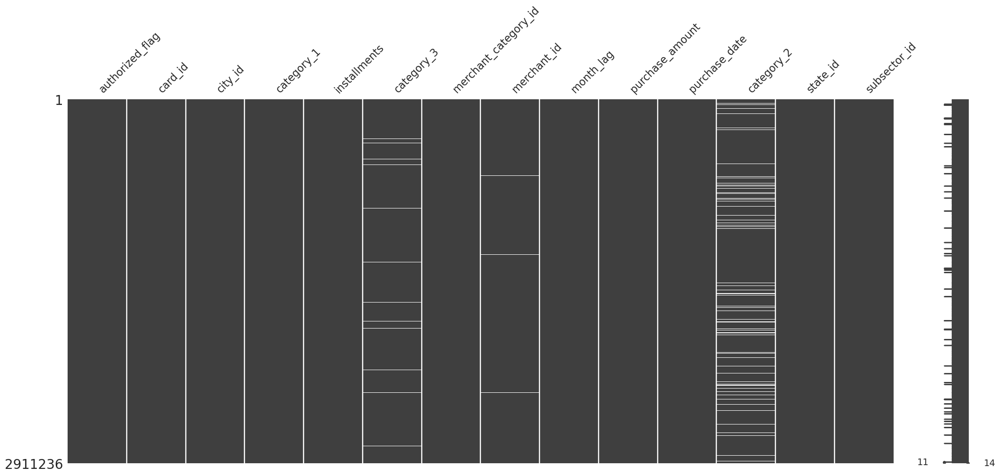

In [ ]:
# Create a visualization of the missing values
msno.matrix(df)

# Show the plot
plt.show()

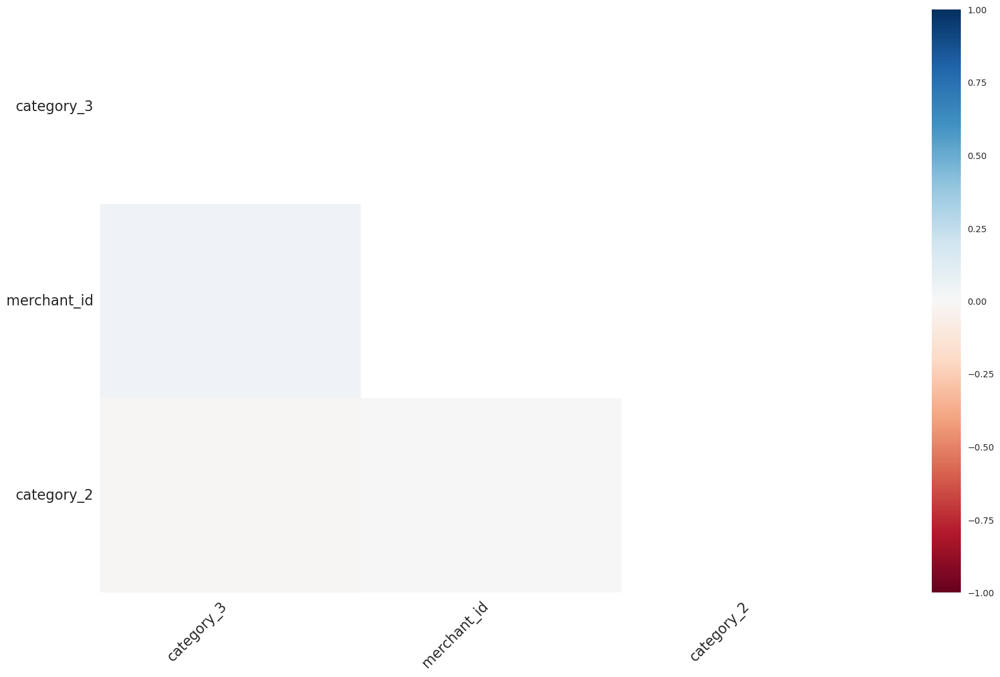

In [ ]:
# Create a heatmap of the correlation between missing values
msno.heatmap(df)

# Show the plot
plt.show()

In [ ]:
# Create a boolean mask for the null values in merchant_id column
mask1 = hist_trans_df['merchant_id'].isnull()

# Create a boolean mask for the null values in category_2 column
mask2 = hist_trans_df['category_2'].isnull()

# Create a boolean mask for the null values in category_3 column
mask3 = hist_trans_df['category_3'].isnull()

# Combine the masks to check for the cases where all three columns have null values
combined_mask = mask1 & mask2 & mask3

# Count the number of rows where all three columns have null values
count = combined_mask.sum()

# Print the count
print(count)

487


In [ ]:
# Create a boolean mask for the null values in merchant_id column
mask1 = hist_trans_df['merchant_id'].isnull()

# Create a boolean mask for the null values in category_2 column
#mask2 = hist_trans_df['category_2'].isnull()

# Create a boolean mask for the null values in category_3 column
mask3 = hist_trans_df['category_3'].isnull()

# Combine the masks to check for the cases where all three columns have null values
combined_mask = mask1 & mask3

# Count the number of rows where all three columns have null values
count = combined_mask.sum()

# Print the count
print(count)

7207


**Observations**
- The "category_2" variable has missing values for approximately 10% of the observations

**Type of missing:**
- merchant_id, category_2, and category_3 are Completely ar Random

**Mechanism:** General


### **New Transaction Data Analysis:**

In [ ]:
new_trans_df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_415bb3a509,107,N,1,B,307,M_ID_b0c793002c,1,-0.55757,2018-03-11 14:57:36,1.00000,9,19
1,Y,C_ID_415bb3a509,140,N,1,B,307,M_ID_88920c89e8,1,-0.56958,2018-03-19 18:53:37,1.00000,9,19
2,Y,C_ID_415bb3a509,330,N,1,B,507,M_ID_ad5237ef6b,2,-0.55104,2018-04-26 14:08:44,1.00000,9,14
3,Y,C_ID_415bb3a509,-1,Y,1,B,661,M_ID_9e84cda3b1,1,-0.67193,2018-03-07 09:43:21,NaN,-1,8
4,Y,C_ID_ef55cf8d4b,-1,Y,1,B,166,M_ID_3c86fa3831,1,-0.65990,2018-03-22 21:07:53,NaN,-1,29


In [ ]:
# Convert the date column to datetime format
new_trans_df['purchase_date'] = pd.to_datetime(new_trans_df['purchase_date'])

In [ ]:
new_trans_df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_415bb3a509,107,N,1,B,307,M_ID_b0c793002c,1,-0.55757,2018-03-11 14:57:36,1.00000,9,19
1,Y,C_ID_415bb3a509,140,N,1,B,307,M_ID_88920c89e8,1,-0.56958,2018-03-19 18:53:37,1.00000,9,19
2,Y,C_ID_415bb3a509,330,N,1,B,507,M_ID_ad5237ef6b,2,-0.55104,2018-04-26 14:08:44,1.00000,9,14
3,Y,C_ID_415bb3a509,-1,Y,1,B,661,M_ID_9e84cda3b1,1,-0.67193,2018-03-07 09:43:21,NaN,-1,8
4,Y,C_ID_ef55cf8d4b,-1,Y,1,B,166,M_ID_3c86fa3831,1,-0.65990,2018-03-22 21:07:53,NaN,-1,29


In [ ]:
new_trans_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1963031 entries, 0 to 1963030
Data columns (total 14 columns):
 #   Column                Dtype         
---  ------                -----         
 0   authorized_flag       object        
 1   card_id               object        
 2   city_id               int64         
 3   category_1            object        
 4   installments          int64         
 5   category_3            object        
 6   merchant_category_id  int64         
 7   merchant_id           object        
 8   month_lag             int64         
 9   purchase_amount       float64       
 10  purchase_date         datetime64[ns]
 11  category_2            float64       
 12  state_id              int64         
 13  subsector_id          int64         
dtypes: datetime64[ns](1), float64(2), int64(6), object(5)
memory usage: 209.7+ MB


In [ ]:
new_trans_df.describe()

,city_id,installments,merchant_category_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
count,1963031.00000,1963031.00000,1963031.00000,1963031.00000,1963031.00000,1963031,1851286.00000,1963031.00000,1963031.00000
mean,134.38668,0.68296,430.97013,1.47652,-0.55097,2018-02-23 01:03:02.528938752,2.19784,10.88067,25.97624
min,-1.00000,-1.00000,-1.00000,1.00000,-0.74689,2017-03-01 03:24:51,1.00000,-1.00000,-1.00000
25%,69.00000,0.00000,278.00000,1.00000,-0.71663,2018-02-26 18:26:25,1.00000,9.00000,19.00000
50%,110.00000,1.00000,367.00000,1.00000,-0.67484,2018-03-19 12:16:35,1.00000,9.00000,29.00000
75%,212.00000,1.00000,683.00000,2.00000,-0.58162,2018-04-08 19:32:43,3.00000,15.00000,34.00000
max,347.00000,999.00000,891.00000,2.00000,263.15750,2018-04-30 23:59:59,5.00000,24.00000,41.00000
std,101.51524,1.58407,246.33851,0.49945,0.69400,NaN,1.52813,6.03854,10.12908


For the "first_active_month" column, NaN is shown because the standard deviation of date values does not make sense and is not calculated.

It is worth noting that calculating the mean of date values does not always make sense, as dates do not have a natural zero point. In some cases, it may be more appropriate to use other metrics, such as the median or mode, to summarize the central tendency of date values.

In [ ]:
new_trans_df.duplicated().sum()

0

### **Check Missing Values**

In [ ]:
new_trans_df.isna().sum()

authorized_flag              0
card_id                      0
city_id                      0
category_1                   0
installments                 0
category_3               55922
merchant_category_id         0
merchant_id              26216
month_lag                    0
purchase_amount              0
purchase_date                0
category_2              111745
state_id                     0
subsector_id                 0
dtype: int64

In [ ]:
# calculate the percentage of missing values for each variable
missing_percent = new_trans_df.isnull().sum() / len(new_trans_df) * 100

# print the percentage of missing values for each variable
print(missing_percent)

authorized_flag        0.00000
card_id                0.00000
city_id                0.00000
category_1             0.00000
installments           0.00000
category_3             2.84876
merchant_category_id   0.00000
merchant_id            1.33549
month_lag              0.00000
purchase_amount        0.00000
purchase_date          0.00000
category_2             5.69247
state_id               0.00000
subsector_id           0.00000
dtype: float64


In [ ]:
# print the most frequent values in category_2
print(new_trans_df['category_2'].value_counts())

category_2
1.00000    1058242
3.00000     289525
5.00000     259266
4.00000     178590
2.00000      65663
Name: count, dtype: int64


In [ ]:
# print the most frequent values in category_3
print(new_trans_df['category_3'].value_counts())

category_3
A    922244
B    836178
C    148687
Name: count, dtype: int64


In [ ]:
# Randomly sample 20% of the rows from the 'hist_trans_df' dataframe
# without replacement, using a random seed of 42
df = new_trans_df.sample(frac=0.2, replace=False, random_state=42)

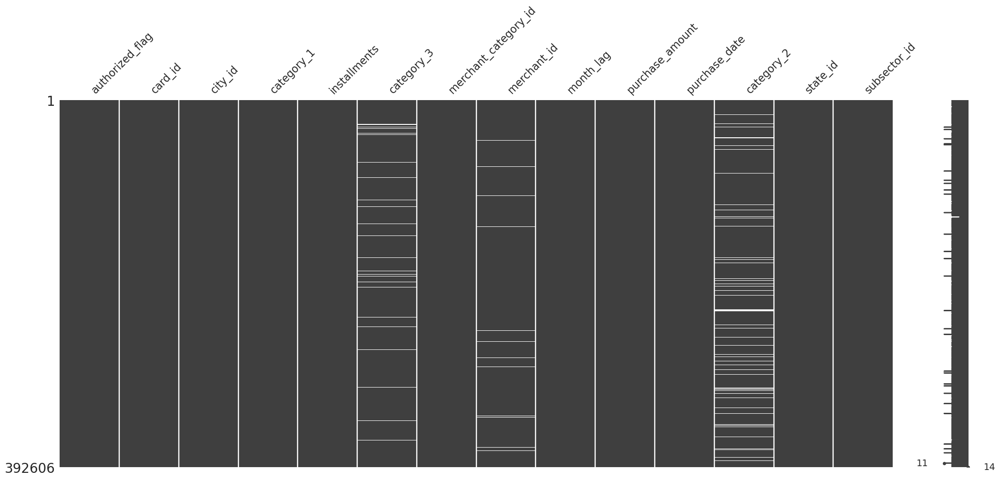

In [ ]:
# Create a visualization of the missing values
msno.matrix(df)

# Show the plot
plt.show()

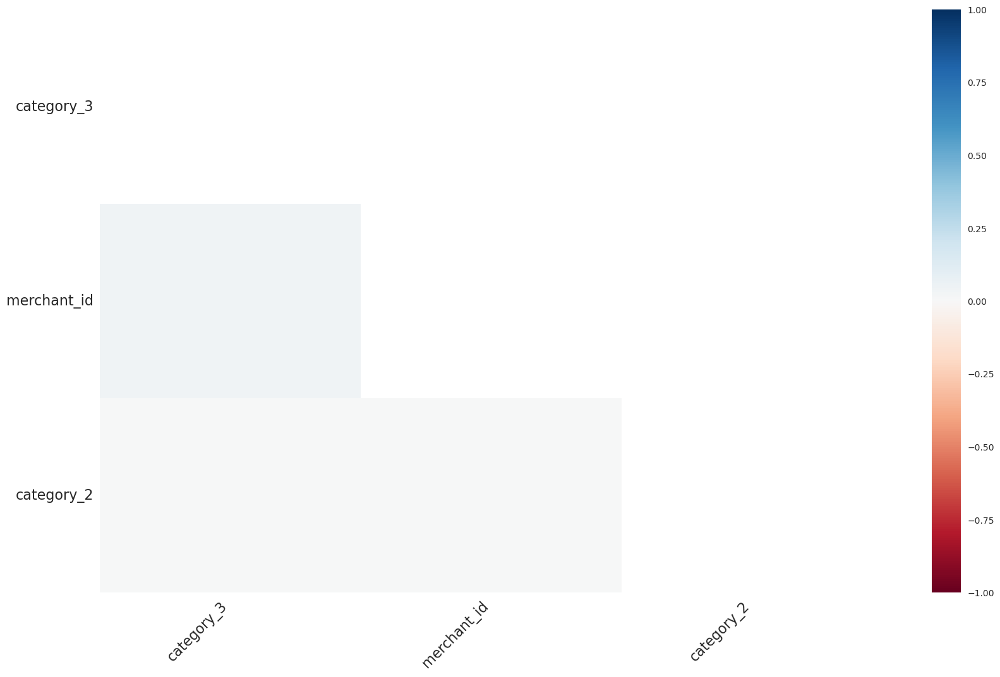

In [ ]:
# Create a heatmap of the correlation between missing values
msno.heatmap(df)

# Show the plot
plt.show()

In [ ]:
# Create a boolean mask for the null values in merchant_id column
mask1 = new_trans_df['merchant_id'].isnull()

# Create a boolean mask for the null values in category_2 column
mask2 = new_trans_df['category_2'].isnull()

# Create a boolean mask for the null values in category_3 column
mask3 = new_trans_df['category_3'].isnull()

# Combine the masks to check for the cases where all three columns have null values
combined_mask = mask1 & mask2 & mask3

# Count the number of rows where all three columns have null values
count = combined_mask.sum()

# Print the count
print(count)

131


In [ ]:
# Create a boolean mask for the null values in merchant_id column
mask1 = new_trans_df['merchant_id'].isnull()

# Create a boolean mask for the null values in category_2 column
#mask2 = new_trans_df['category_2'].isnull()

# Create a boolean mask for the null values in category_3 column
mask3 = new_trans_df['category_3'].isnull()

# Combine the masks to check for the cases where all three columns have null values
combined_mask = mask1 & mask3

# Count the number of rows where all three columns have null values
count = combined_mask.sum()

# Print the count
print(count)

2182


**Observations**
- The "category_2" variable has missing values for approximately 6% of the observations

**Type of missing:**
- merchant_id, category_2, and category_3 are Completely ar Random

**Mechanism:** General


### **History Merchant Transaction VS. New Transaction Data Analysis:**

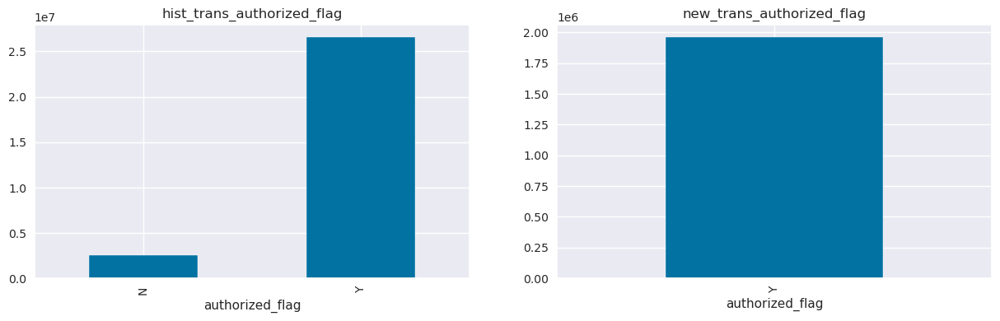

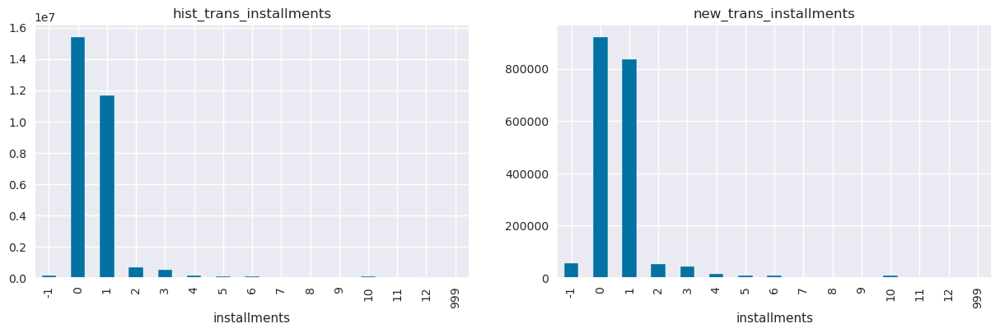

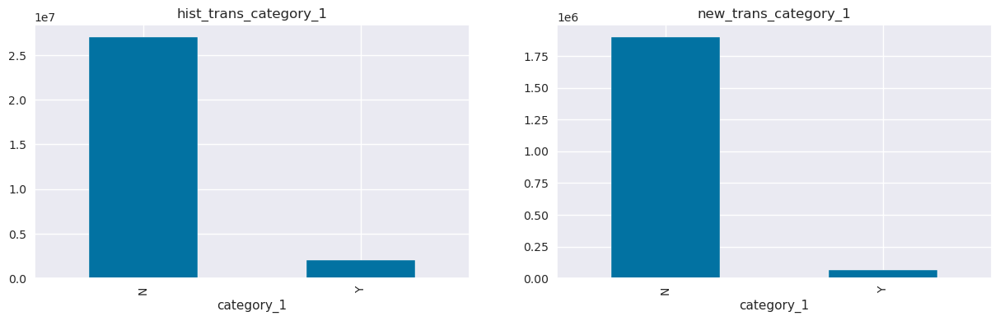

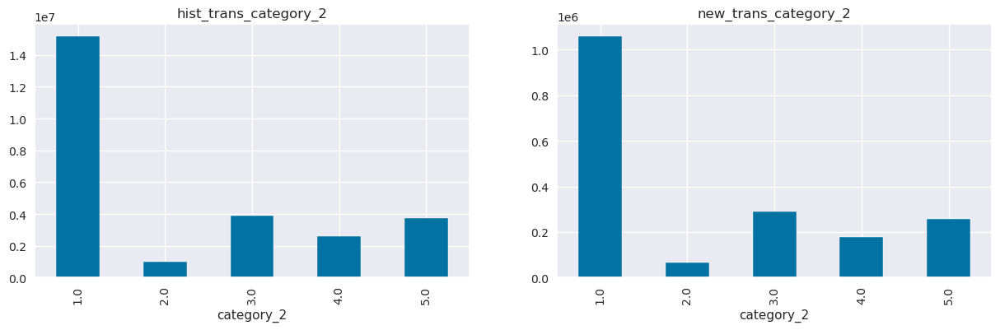

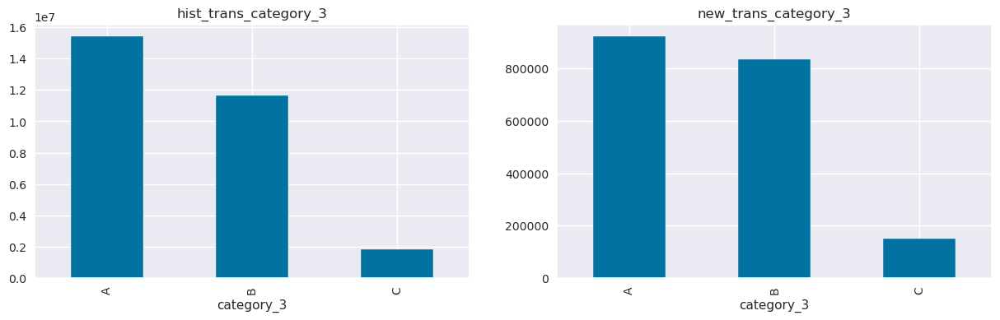

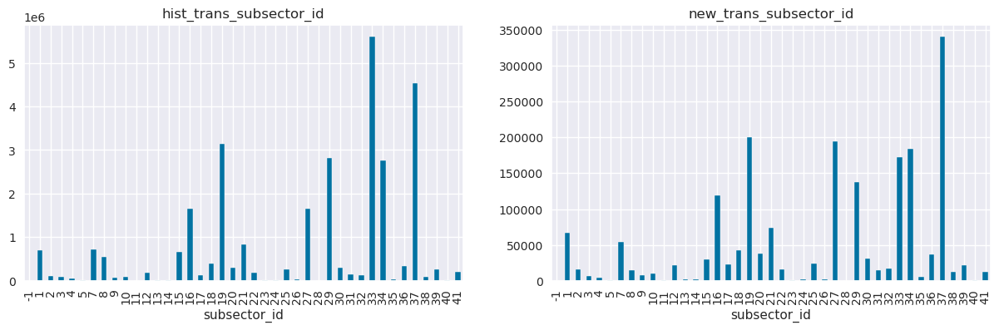

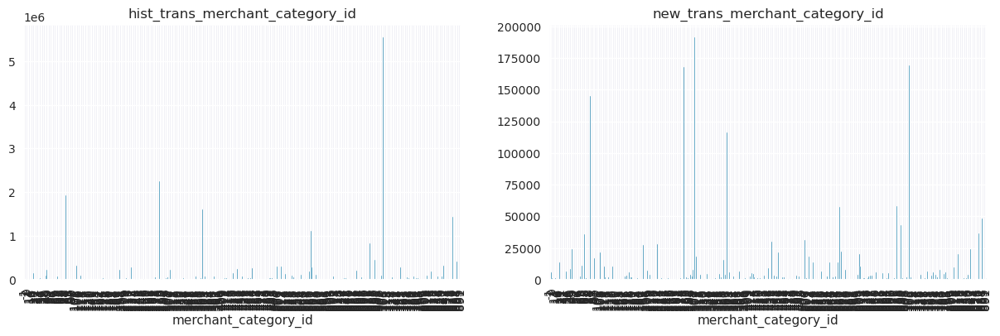

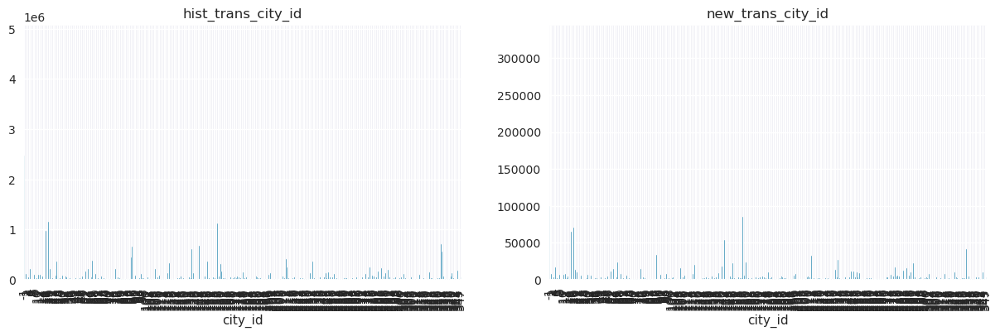

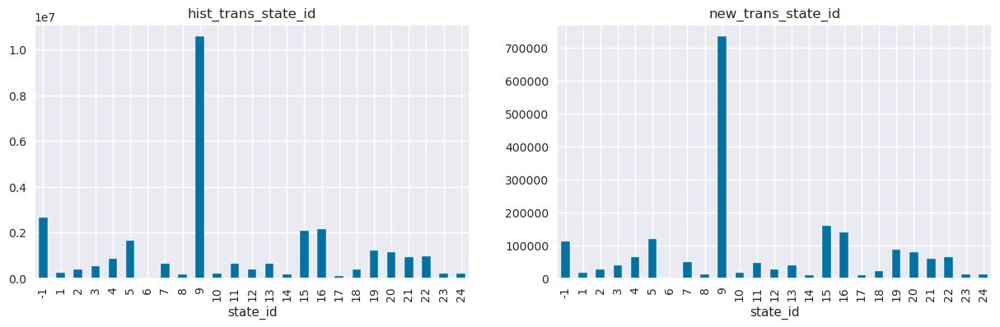

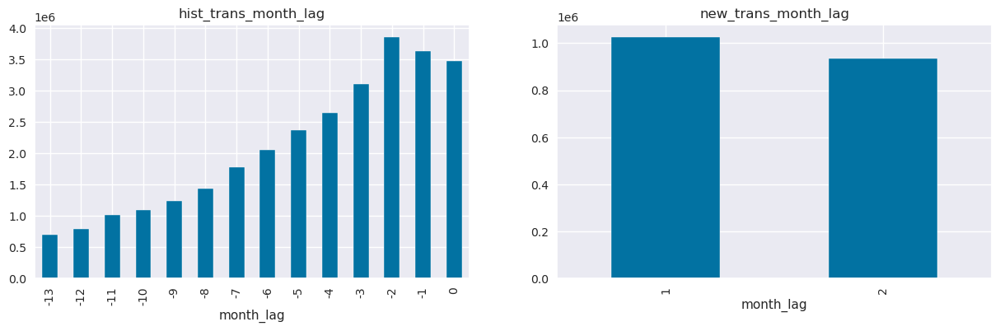

In [ ]:
# features distrubution in historical and new transactions
features = ['authorized_flag',
            'installments',
            'category_1',
            'category_2',
            'category_3',
            'subsector_id',
            'merchant_category_id',
            'city_id',
            'state_id',
            'month_lag']
for feature in features:
    fig, axes = plt.subplots(nrows=1, ncols=2)
    hist_trans_df.groupby(feature).count()['card_id'].plot(kind='bar',
                                                           title='hist_trans_{}'.format(feature),
                                                           figsize=(15, 4),
                                                           ax=axes[0])
    new_trans_df.groupby(feature).count()['card_id'].plot(kind='bar',
                                                          title='new_trans_{}'.format(feature),
                                                          figsize=(15, 4))
    plt.show()

**Observations** in authorized_flag and category_1 Most values are “Y”. we can remove this column as it is not having much significance on predicting loyalty score as all values are same.

In [ ]:
# number of unique card_id in historical transactions
hist_trans_card_id_list = hist_trans_df['card_id'].unique()
len(hist_trans_card_id_list)

325540

In [ ]:
# number of unique card_id in new transactions
new_trans_card_id_list = new_trans_df['card_id'].unique()
len(new_trans_card_id_list)

290001

In [ ]:
# number of unique card_id in userscore
usersc_card_id_list = usersc_df['card_id'].unique()
len(usersc_card_id_list)

201917

In [ ]:
# check if new card_id is subset of historical card_id
set(new_trans_card_id_list).issubset(set(hist_trans_card_id_list))

True

In [ ]:
# check if usersc_df card_id is subset of historical card_id
set(usersc_card_id_list).issubset(set(hist_trans_card_id_list))

True

In [ ]:
# check if usersc_df card_id is subset of new card_id
set(usersc_card_id_list).issubset(set(new_trans_card_id_list))

False

In [ ]:
# check the intersection of usersc_df and new card_id
len(set(usersc_card_id_list).intersection(set(new_trans_card_id_list)))

179986

In [ ]:
# number of unique merchant_id in historical transactions
hist_trans_merch_id_list = hist_trans_df['merchant_id'].unique()
len(hist_trans_merch_id_list)

326312

In [ ]:
# percent of missing merchant id in historical transactions
len(hist_trans_df[hist_trans_df['merchant_id'].notnull()]) / len(hist_trans_df)

0.995243223316721

In [ ]:
# number of unique merchant_id in new transactions
new_trans_merch_id_list = new_trans_df['merchant_id'].unique()
len(new_trans_merch_id_list)

226130

In [ ]:
# number of missing merchant id in new transactions
len(new_trans_df[new_trans_df['merchant_id'].notnull()]) / len(new_trans_df)

0.9866451421296963

In [ ]:
# check if new merchant_id is subset of historical card_id
set(new_trans_merch_id_list).issubset(set(hist_trans_merch_id_list))

False

In [ ]:
# check the intersection of historical and new merchant_id
len(set(new_trans_merch_id_list).intersection(set(hist_trans_merch_id_list)))

217808

In [ ]:
# number if unique of mechant_id, has duplicates, 334633 < 334696, with 33 duplicates
merchant_id_list = merch_df['merchant_id'].unique()
len(merchant_id_list)

334633

In [ ]:
# check missing values of features:
print('=================hist_trans_df====================')
print('authorized_flag missing #: ', len(hist_trans_df[hist_trans_df['authorized_flag'].isnull()]))
print('installments missing #: ', len(hist_trans_df[hist_trans_df['installments'].isnull()]))
print('category_1 missing #: ', len(hist_trans_df[hist_trans_df['category_1'].isnull()]))
print('category_2 missing #: ', len(hist_trans_df[hist_trans_df['category_2'].isnull()]))
print('category_3 missing #: ', len(hist_trans_df[hist_trans_df['category_3'].isnull()]))
print('subsector_id missing #: ', len(hist_trans_df[hist_trans_df['subsector_id'].isnull()]))
print('merchant_category_id missing #: ', len(hist_trans_df[hist_trans_df['merchant_category_id'].isnull()]))
print('city_id missing #: ', len(hist_trans_df[hist_trans_df['city_id'].isnull()]))
print('state_id missing #: ', len(hist_trans_df[hist_trans_df['state_id'].isnull()]))
print('month_lag missing #: ', len(hist_trans_df[hist_trans_df['month_lag'].isnull()]))
print('purchase_amount missing #: ', len(hist_trans_df[hist_trans_df['purchase_amount'].isnull()]))
print('purchase_date missing #: ', len(hist_trans_df[hist_trans_df['purchase_date'].isnull()]))
print('=================new_trans_df====================')
print('authorized_flag missing #: ', len(new_trans_df[new_trans_df['authorized_flag'].isnull()]))
print('installments missing #: ', len(new_trans_df[new_trans_df['installments'].isnull()]))
print('category_1 missing #: ', len(new_trans_df[new_trans_df['category_1'].isnull()]))
print('category_2 missing #: ', len(new_trans_df[new_trans_df['category_2'].isnull()]))
print('category_3 missing #: ', len(new_trans_df[new_trans_df['category_3'].isnull()]))
print('subsector_id missing #: ', len(new_trans_df[new_trans_df['subsector_id'].isnull()]))
print('merchant_category_id missing #: ', len(new_trans_df[new_trans_df['merchant_category_id'].isnull()]))
print('city_id missing #: ', len(new_trans_df[new_trans_df['city_id'].isnull()]))
print('state_id missing #: ', len(new_trans_df[new_trans_df['state_id'].isnull()]))
print('month_lag missing #: ', len(new_trans_df[new_trans_df['month_lag'].isnull()]))
print('purchase_amount missing #: ', len(new_trans_df[new_trans_df['purchase_amount'].isnull()]))
print('purchase_date missing #: ', len(new_trans_df[new_trans_df['purchase_date'].isnull()]))
print('=================merch_df====================')
print('category_4 missing #: ', len(merch_df[merch_df['category_4'].isnull()]))
print('merchant_group_id missing #: ', len(merch_df[merch_df['merchant_group_id'].isnull()]))

=================hist_trans_df====================
authorized_flag missing #:  0
installments missing #:  0
category_1 missing #:  0
category_2 missing #:  2652864
category_3 missing #:  178159
subsector_id missing #:  0
merchant_category_id missing #:  0
city_id missing #:  0
state_id missing #:  0
month_lag missing #:  0
purchase_amount missing #:  0
purchase_date missing #:  0
=================new_trans_df====================
authorized_flag missing #:  0
installments missing #:  0
category_1 missing #:  0
category_2 missing #:  111745
category_3 missing #:  55922
subsector_id missing #:  0
merchant_category_id missing #:  0
city_id missing #:  0
state_id missing #:  0
month_lag missing #:  0
purchase_amount missing #:  0
purchase_date missing #:  0
=================merch_df====================
category_4 missing #:  0
merchant_group_id missing #:  0


In [ ]:
# show dataframe types
hist_trans_df.dtypes

authorized_flag                 object
card_id                         object
city_id                          int64
category_1                      object
installments                     int64
category_3                      object
merchant_category_id             int64
merchant_id                     object
month_lag                        int64
purchase_amount                float64
purchase_date           datetime64[ns]
category_2                     float64
state_id                         int64
subsector_id                     int64
dtype: object

In [ ]:
# convert the columns into correct format
hist_trans_df['authorized_flag'] = hist_trans_df['authorized_flag'].astype('category')
hist_trans_df['city_id'] = hist_trans_df['city_id'].astype('category')
hist_trans_df['category_1'] = hist_trans_df['category_1'].astype('category')
hist_trans_df['category_3'] = hist_trans_df['category_3'].astype('category')
hist_trans_df['merchant_category_id'] = hist_trans_df['merchant_category_id'].astype('category')
hist_trans_df['purchase_date'] = pd.to_datetime(hist_trans_df['purchase_date'])
hist_trans_df['category_2'] = hist_trans_df['category_2'].astype('category')
hist_trans_df['state_id'] = hist_trans_df['state_id'].astype('category')
hist_trans_df['subsector_id'] = hist_trans_df['subsector_id'].astype('category')
hist_trans_df.dtypes

authorized_flag               category
card_id                         object
city_id                       category
category_1                    category
installments                     int64
category_3                    category
merchant_category_id          category
merchant_id                     object
month_lag                        int64
purchase_amount                float64
purchase_date           datetime64[ns]
category_2                    category
state_id                      category
subsector_id                  category
dtype: object

In [ ]:
# show dataframe types
new_trans_df.dtypes

authorized_flag                 object
card_id                         object
city_id                          int64
category_1                      object
installments                     int64
category_3                      object
merchant_category_id             int64
merchant_id                     object
month_lag                        int64
purchase_amount                float64
purchase_date           datetime64[ns]
category_2                     float64
state_id                         int64
subsector_id                     int64
dtype: object

In [ ]:
# convert the columns into correct format
new_trans_df['authorized_flag'] = new_trans_df['authorized_flag'].astype('category')
new_trans_df['city_id'] = new_trans_df['city_id'].astype('category')
new_trans_df['category_1'] = new_trans_df['category_1'].astype('category')
new_trans_df['category_3'] = new_trans_df['category_3'].astype('category')
new_trans_df['merchant_category_id'] = new_trans_df['merchant_category_id'].astype('category')
new_trans_df['purchase_date'] = pd.to_datetime(new_trans_df['purchase_date'])
new_trans_df['category_2'] = new_trans_df['category_2'].astype('category')
new_trans_df['state_id'] = new_trans_df['state_id'].astype('category')
new_trans_df['subsector_id'] = new_trans_df['subsector_id'].astype('category')

In [ ]:
# show dataframe types
new_trans_df.dtypes

authorized_flag               category
card_id                         object
city_id                       category
category_1                    category
installments                     int64
category_3                    category
merchant_category_id          category
merchant_id                     object
month_lag                        int64
purchase_amount                float64
purchase_date           datetime64[ns]
category_2                    category
state_id                      category
subsector_id                  category
dtype: object

In [ ]:
# fill in some missing values
hist_trans_df['category_2'] = hist_trans_df['category_2'].cat.add_categories(-999).fillna(-999)
hist_trans_df['category_3'] = hist_trans_df['category_3'].cat.add_categories('X').fillna('X')
new_trans_df['category_2'] = new_trans_df['category_2'].cat.add_categories(-999).fillna(-999)
new_trans_df['category_3'] = new_trans_df['category_3'].cat.add_categories('X').fillna('X')

In [ ]:
# minimum and maxmium values in historical and new transactions
print('Minimum purchase amount in historical transaction: ', min(hist_trans_df['purchase_amount']))
print('Maxmium purchase amount in historical transaction: ', max(hist_trans_df['purchase_amount']))
print('Minimum purchase amount in New transaction: ', min(new_trans_df['purchase_amount']))
print('Maximum purchase amount in New transaction: ', max(new_trans_df['purchase_amount']))

Minimum purchase amount in historical transaction:  -0.7469078
Maxmium purchase amount in historical transaction:  6010603.9717525
Minimum purchase amount in New transaction:  -0.74689277
Maximum purchase amount in New transaction:  263.15749789


In [ ]:
# most of the purchase amount are less than 1
print('Percent of purchase_amount < 1 in historical transactions: ',
      len(hist_trans_df[hist_trans_df['purchase_amount'] < 1]) / len(hist_trans_df))
print('Percent of purchase_amount < 1 in new transactions: ',
      len(new_trans_df[new_trans_df['purchase_amount'] < 1]) / len(new_trans_df))

Percent of purchase_amount < 1 in historical transactions:  0.9880562761639291
Percent of purchase_amount < 1 in new transactions:  0.985838736117769


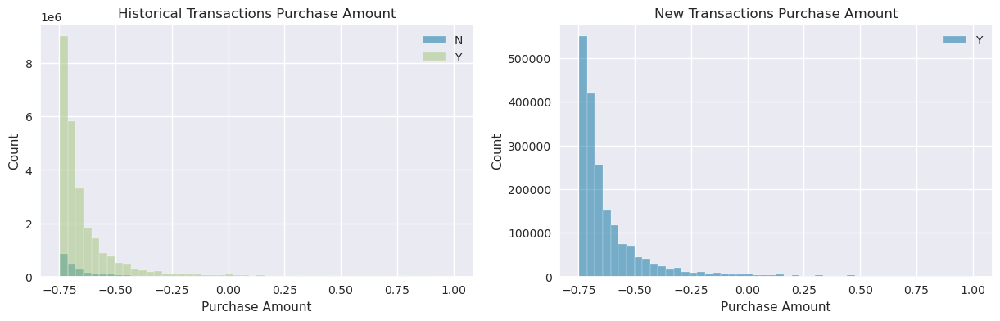

In [ ]:
# create a figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

# plot purchase amount distribution in historical transactions
hist_trans_df[hist_trans_df['purchase_amount'] < 1]\
    .groupby('authorized_flag')['purchase_amount']\
    .plot(kind='hist',
          bins=50,
          alpha=0.5,
          legend=True,
          title='Historical Transactions Purchase Amount',
          ax=axes[0])

# plot purchase amount distribution in new transactions
new_trans_df[new_trans_df['purchase_amount'] < 1]\
    .groupby('authorized_flag')['purchase_amount']\
    .plot(kind='hist',
          bins=50,
          alpha=0.5,
          legend=True,
          title='New Transactions Purchase Amount',
          ax=axes[1])

# set common x and y labels for the subplots
for ax in axes:
    ax.set_xlabel('Purchase Amount')
    ax.set_ylabel('Count')

# display the plot
plt.show()

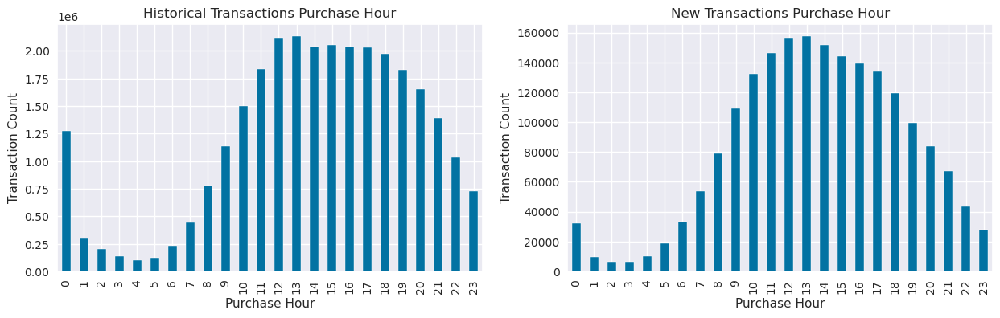

In [ ]:
# create a figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

# plot purchase hour distribution in historical transactions
hist_trans_df.groupby(hist_trans_df['purchase_date'].dt.hour)\
    .size()\
    .plot(kind='bar',
          title='Historical Transactions Purchase Hour',
          ax=axes[0])

# plot purchase hour distribution in new transactions
new_trans_df.groupby(new_trans_df['purchase_date'].dt.hour)\
    .size()\
    .plot(kind='bar',
          title='New Transactions Purchase Hour',
          ax=axes[1])

# set common x and y labels for the subplots
for ax in axes:
    ax.set_xlabel('Purchase Hour')
    ax.set_ylabel('Transaction Count')

# display the plot
plt.show()

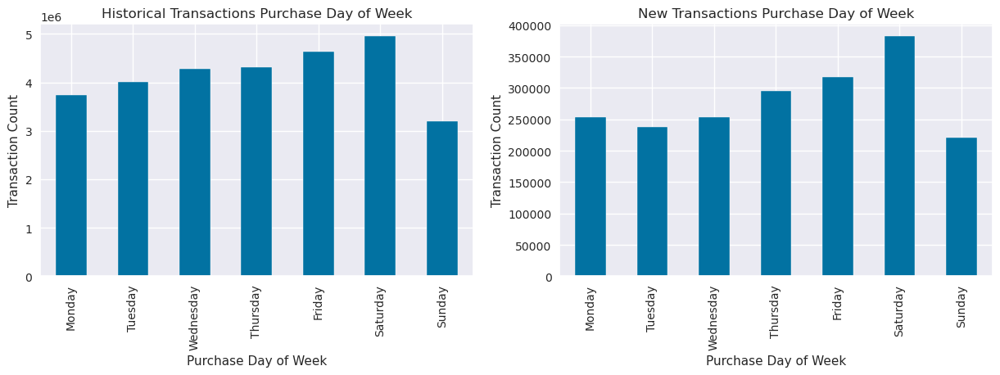

In [ ]:
# create a figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

# define a list of weekday names
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# plot purchase day of week distribution in historical transactions
hist_trans_df.groupby(hist_trans_df['purchase_date'].dt.dayofweek)\
    .size()\
    .rename(index=lambda x: weekday_names[x])\
    .plot(kind='bar',
          title='Historical Transactions Purchase Day of Week',
          ax=axes[0])

# plot purchase day of week distribution in new transactions
new_trans_df.groupby(new_trans_df['purchase_date'].dt.dayofweek)\
    .size()\
    .rename(index=lambda x: weekday_names[x])\
    .plot(kind='bar',
          title='New Transactions Purchase Day of Week',
          ax=axes[1])

# set common x and y labels for the subplots
for ax in axes:
    ax.set_xlabel('Purchase Day of Week')
    ax.set_ylabel('Transaction Count')

# display the plot
plt.show()

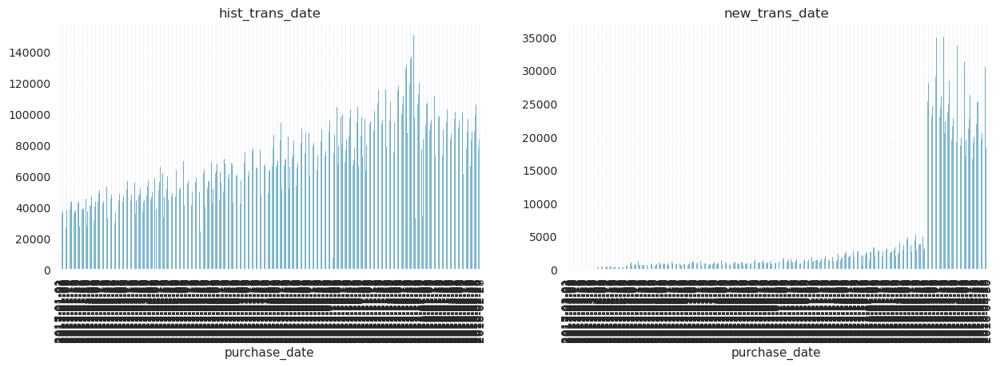

In [ ]:
# purchase date distribution in historical and new transactions
fig, axes = plt.subplots(nrows=1, ncols=2)
hist_trans_df.groupby(hist_trans_df['purchase_date'].dt.date)\
    .count()['card_id']\
    .plot(kind='bar',
          title='hist_trans_date',
          figsize=(15, 4),
          ax=axes[0])
new_trans_df.groupby(new_trans_df['purchase_date'].dt.date)\
    .count()['card_id']\
    .plot(kind='bar',
          title='new_trans_date',
          figsize=(15, 4))
plt.show()

**Observations**

- authorized_flag column in historical transactions can be removed.
- Most purchase amounts in historical transactions are between 0-50, with a few outliers.
- Values of -1 and 999 in the installments column of historical transactions maybe errors or wrong entries.
- The null values in category_2, category_3, and merchant_id columns of historical transactions need to be handled.
- Purchases in historical transactions are highest on Saturdays and lowest at the end of the month, with the highest number of purchases in March and April.
- The highest purchases in historical transactions were made in January, February, and December, while in new merchant transaction data, the highest purchases were made in March and April.

# **Merging Datasets**

In [ ]:
# Concatenate the datasets on the `merchant_id` column
df1= pd.concat([hist_trans_df, new_trans_df])
#merge df1 with merchant.csv
df =pd.merge(df1, merch_df, on='merchant_id')

In [ ]:
df.head()

,authorized_flag,card_id,city_id_x,category_1_x,installments,category_3,merchant_category_id_x,merchant_id,month_lag,purchase_amount,purchase_date,category_2_x,state_id_x,subsector_id_x,merchant_group_id,merchant_category_id_y,subsector_id_y,numerical_1,numerical_2,category_1_y,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id_y,state_id_y,category_2_y
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.70333,2017-06-25 15:33:07,1.00000,16,37,35,80,37,23.47060,23.01451,N,A,A,1.08000,1.08245,3,1.14000,1.11414,6,1.19000,1.15684,12,1,88,16,1.00000
1,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-11,-0.72287,2017-03-10 01:14:19,1.00000,16,37,35,80,37,23.47060,23.01451,N,A,A,1.08000,1.08245,3,1.14000,1.11414,6,1.19000,1.15684,12,1,88,16,1.00000
2,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.74165,2017-06-08 18:02:29,1.00000,16,37,35,80,37,23.47060,23.01451,N,A,A,1.08000,1.08245,3,1.14000,1.11414,6,1.19000,1.15684,12,1,88,16,1.00000
3,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-6,-0.74541,2017-08-11 17:53:00,1.00000,16,37,35,80,37,23.47060,23.01451,N,A,A,1.08000,1.08245,3,1.14000,1.11414,6,1.19000,1.15684,12,1,88,16,1.00000
4,Y,C_ID_4e6213e9bc,88,N,0,A,278,M_ID_e020e9b302,-9,-0.72700,2017-05-06 12:29:50,1.00000,16,37,35,80,37,23.47060,23.01451,N,A,A,1.08000,1.08245,3,1.14000,1.11414,6,1.19000,1.15684,12,1,88,16,1.00000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32163978 entries, 0 to 32163977
Data columns (total 35 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   authorized_flag              object        
 1   card_id                      object        
 2   city_id_x                    category      
 3   category_1_x                 category      
 4   installments                 int64         
 5   category_3                   category      
 6   merchant_category_id_x       int64         
 7   merchant_id                  object        
 8   month_lag                    int64         
 9   purchase_amount              float64       
 10  purchase_date                datetime64[ns]
 11  category_2_x                 category      
 12  state_id_x                   category      
 13  subsector_id_x               category      
 14  merchant_group_id            int64         
 15  merchant_category_id_y       int64         
 16

In [ ]:
# Standardize the data
df = df.astype({'authorized_flag': 'category',
                  'card_id': 'object',
                  'city_id_x': 'int64',
                  'category_1_x': 'category',
                  'installments': 'int64',
                  'category_3': 'category',
                  'merchant_category_id_x': 'int64',
                  'merchant_id': 'category',
                  'month_lag': 'int64',
                  'purchase_amount': 'float64',
                  'category_2_x': 'float64',
                  'state_id_x': 'int64',
                  'subsector_id_x': 'int64',
                  'merchant_group_id': 'int64',
                  'merchant_category_id_y': 'int64',
                  'subsector_id_y': 'int64',
                  'numerical_1': 'float64',
                  'numerical_2': 'float64',
                  'category_1_y': 'category',
                  'most_recent_sales_range': 'category',
                  'most_recent_purchases_range': 'category',
                  'avg_sales_lag3': 'float64',
                  'avg_purchases_lag3': 'float64',
                  'avg_sales_lag6': 'float64',
                  'avg_purchases_lag6': 'float64',
                  'avg_sales_lag12': 'float64',
                  'avg_purchases_lag12': 'float64',
                  'active_months_lag12': 'int64',
                  'city_id_y': 'int64',
                  'state_id_y': 'int64',
                  'category_2_y': 'float64'})

In [ ]:
#creates two new columns in the dataframe 'df' to convert the categorical variables'most_recent_sales_range' and 'most_recent_purchases_range' to numerical ranks.
df['most_recent_sales_rank'] = df['most_recent_sales_range'].replace({'A':5, 'B':4, 'C':3, 'D':2, 'E':1})
df['most_recent_purchases_rank'] = df['most_recent_purchases_range'].replace({'A':5, 'B':4, 'C':3, 'D':2, 'E':1})

In [ ]:
from sklearn.preprocessing import LabelEncoder

#Select the categorical columns
cat_cols = df.select_dtypes(include=['category']).columns.tolist()

#Apply label encoding to each categorical column
le = LabelEncoder()
for col in cat_cols:
    df[col] = le.fit_transform(df[col])

#Check the updated DataFrame
print(df.head())

   authorized_flag          card_id  city_id_x  category_1_x  installments  category_3  merchant_category_id_x  merchant_id  month_lag  purchase_amount       purchase_date  category_2_x  state_id_x  subsector_id_x  merchant_group_id  merchant_category_id_y  subsector_id_y  numerical_1  numerical_2  category_1_y  most_recent_sales_range  most_recent_purchases_range  avg_sales_lag3  avg_purchases_lag3  active_months_lag3  avg_sales_lag6  avg_purchases_lag6  active_months_lag6  avg_sales_lag12  avg_purchases_lag12  active_months_lag12  category_4  city_id_y  state_id_y  category_2_y  most_recent_sales_rank  most_recent_purchases_rank
0                1  C_ID_4e6213e9bc         88             0             0           0                      80       292909         -8         -0.70333 2017-06-25 15:33:07       1.00000          16              37                 35                      80              37     23.47060     23.01451             0                        0                        

In [ ]:
# drop the unnecessary variables
df = df.drop(['active_months_lag6', 'active_months_lag3'], axis=1)

In [ ]:
#Check the Duplication
df.duplicated().sum()

0

In [ ]:
#Check the Null values
df.isnull().sum()

authorized_flag                      0
card_id                              0
city_id_x                            0
category_1_x                         0
installments                         0
category_3                           0
merchant_category_id_x               0
merchant_id                          0
month_lag                            0
purchase_amount                      0
purchase_date                        0
category_2_x                         0
state_id_x                           0
subsector_id_x                       0
merchant_group_id                    0
merchant_category_id_y               0
subsector_id_y                       0
numerical_1                          0
numerical_2                          0
category_1_y                         0
most_recent_sales_range              0
most_recent_purchases_range          0
avg_sales_lag3                    9401
avg_purchases_lag3                   0
avg_sales_lag6                    9401
avg_purchases_lag6       

In [ ]:
#missing values percentage per-column
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
percent

category_2_y                  0.17937
avg_sales_lag12               0.00029
avg_sales_lag3                0.00029
avg_sales_lag6                0.00029
authorized_flag               0.00000
most_recent_sales_range       0.00000
most_recent_purchases_range   0.00000
avg_purchases_lag3            0.00000
avg_purchases_lag6            0.00000
avg_purchases_lag12           0.00000
numerical_2                   0.00000
active_months_lag12           0.00000
category_4                    0.00000
city_id_y                     0.00000
state_id_y                    0.00000
most_recent_sales_rank        0.00000
category_1_y                  0.00000
numerical_1                   0.00000
card_id                       0.00000
month_lag                     0.00000
city_id_x                     0.00000
category_1_x                  0.00000
installments                  0.00000
category_3                    0.00000
merchant_category_id_x        0.00000
merchant_id                   0.00000
purchase_amo

In [ ]:
# impute missing values with mean or median
df['category_2_y'].fillna(df['category_2_y'].median(), inplace=True)
df['avg_sales_lag3'].fillna(df['avg_sales_lag3'].mean(), inplace=True)
df['avg_sales_lag6'].fillna(df['avg_sales_lag6'].mean(), inplace=True)
df['avg_sales_lag12'].fillna(df['avg_sales_lag12'].mean(), inplace=True)

# drop rows with remaining missing values
df.dropna(inplace=True)

In [ ]:
#missing values percentage per-column
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
percent

authorized_flag               0.00000
avg_sales_lag12               0.00000
most_recent_sales_range       0.00000
most_recent_purchases_range   0.00000
avg_sales_lag3                0.00000
avg_purchases_lag3            0.00000
avg_sales_lag6                0.00000
avg_purchases_lag6            0.00000
avg_purchases_lag12           0.00000
numerical_2                   0.00000
active_months_lag12           0.00000
category_4                    0.00000
city_id_y                     0.00000
state_id_y                    0.00000
category_2_y                  0.00000
most_recent_sales_rank        0.00000
category_1_y                  0.00000
numerical_1                   0.00000
card_id                       0.00000
month_lag                     0.00000
city_id_x                     0.00000
category_1_x                  0.00000
installments                  0.00000
category_3                    0.00000
merchant_category_id_x        0.00000
merchant_id                   0.00000
purchase_amo

In [ ]:
df['installments'] = np.where(df['installments'] < 0, np.nan, df['installments'])
df['installments']=df['installments'].fillna(0)

In [ ]:
#summary of the descriptive statistics for all columns in the dataframe
df.describe(include="all")

,authorized_flag,card_id,city_id_x,category_1_x,installments,category_3,merchant_category_id_x,merchant_id,month_lag,purchase_amount,purchase_date,category_2_x,state_id_x,subsector_id_x,merchant_group_id,merchant_category_id_y,subsector_id_y,numerical_1,numerical_2,category_1_y,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,avg_sales_lag6,avg_purchases_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id_y,state_id_y,category_2_y,most_recent_sales_rank,most_recent_purchases_rank
count,32163978.00000,32163978,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000,32163978.00000
unique,NaN,325540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,C_ID_3d3dfdc692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,5582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.91881,NaN,127.03856,0.06940,0.66035,0.55162,490.62770,159298.43014,-4.10880,-0.02396,2017-09-17 13:32:27.886615296,-86.30359,10.51236,26.81152,21877.40651,463.18462,25.07846,5.38122,5.25516,0.16732,1.64499,1.57736,123.88738,inf,116.52950,inf,107.31976,inf,11.76919,0.52777,85.45668,9.71665,2.04093,2.35501,2.42264
min,0.00000,NaN,-1.00000,0.00000,0.00000,0.00000,-1.00000,0.00000,-13.00000,-0.74691,2017-01-01 00:00:08,-999.00000,-1.00000,-1.00000,1.00000,-1.00000,-1.00000,-0.05747,-0.05747,0.00000,0.00000,0.00000,-82.13000,0.33350,-82.13000,0.16704,-82.13000,0.09833,1.00000,0.00000,-1.00000,-1.00000,1.00000,0.00000,0.00000
25%,1.00000,NaN,57.00000,0.00000,0.00000,0.00000,307.00000,68406.00000,-7.00000,-0.72018,2017-06-17 13:06:21.249999872,1.00000,9.00000,19.00000,35.00000,307.00000,17.00000,-0.05747,-0.05747,0.00000,0.00000,0.00000,0.96000,0.97816,0.94000,0.96445,0.93000,0.96057,12.00000,0.00000,-1.00000,5.00000,1.00000,1.00000,1.00000
50%,1.00000,NaN,88.00000,0.00000,0.00000,0.00000,506.00000,160761.00000,-3.00000,-0.68830,2017-10-06 00:42:52.500000,1.00000,9.00000,29.00000,3290.00000,511.00000,29.00000,-0.03764,-0.05747,0.00000,2.00000,2.00000,1.02000,1.02729,1.03000,1.03977,1.04000,1.05582,12.00000,1.00000,69.00000,9.00000,1.00000,2.00000,2.00000
75%,1.00000,NaN,200.00000,0.00000,1.00000,1.00000,705.00000,249571.00000,-1.00000,-0.60238,2017-12-23 12:11:57,3.00000,15.00000,34.00000,35753.00000,705.00000,34.00000,0.28955,0.03176,0.00000,3.00000,3.00000,1.09000,1.09703,1.14000,1.14351,1.19000,1.17674,12.00000,1.00000,158.00000,15.00000,3.00000,4.00000,4.00000
max,1.00000,NaN,347.00000,1.00000,999.00000,3.00000,891.00000,334632.00000,2.00000,6010603.97175,2018-04-30 23:59:59,5.00000,24.00000,41.00000,112586.00000,891.00000,41.00000,183.73511,182.07932,1.00000,4.00000,4.00000,851844.64000,inf,1513959.00000,inf,2567408.00000,inf,12.00000,1.00000,347.00000,24.00000,5.00000,4.00000,4.00000


In [ ]:
#summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32163978 entries, 0 to 32163977
Data columns (total 35 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   authorized_flag              int64         
 1   card_id                      object        
 2   city_id_x                    int64         
 3   category_1_x                 int64         
 4   installments                 float64       
 5   category_3                   int64         
 6   merchant_category_id_x       int64         
 7   merchant_id                  int64         
 8   month_lag                    int64         
 9   purchase_amount              float64       
 10  purchase_date                datetime64[ns]
 11  category_2_x                 float64       
 12  state_id_x                   int64         
 13  subsector_id_x               int64         
 14  merchant_group_id            int64         
 15  merchant_category_id_y       int64         
 16

In [ ]:
df.head()

,authorized_flag,card_id,city_id_x,category_1_x,installments,category_3,merchant_category_id_x,merchant_id,month_lag,purchase_amount,purchase_date,category_2_x,state_id_x,subsector_id_x,merchant_group_id,merchant_category_id_y,subsector_id_y,numerical_1,numerical_2,category_1_y,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,avg_sales_lag6,avg_purchases_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id_y,state_id_y,category_2_y,most_recent_sales_rank,most_recent_purchases_rank
0,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-8,-0.70333,2017-06-25 15:33:07,1.00000,16,37,35,80,37,23.47060,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4
1,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-11,-0.72287,2017-03-10 01:14:19,1.00000,16,37,35,80,37,23.47060,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4
2,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-8,-0.74165,2017-06-08 18:02:29,1.00000,16,37,35,80,37,23.47060,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4
3,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-6,-0.74541,2017-08-11 17:53:00,1.00000,16,37,35,80,37,23.47060,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4
4,1,C_ID_4e6213e9bc,88,0,0.00000,0,278,292909,-9,-0.72700,2017-05-06 12:29:50,1.00000,16,37,35,80,37,23.47060,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4


In [ ]:
#numerical_1_scaled: A scaled version of the numerical_1 variable to make it more interpretable.
df['numerical_1_scaled'] = df['numerical_1'] / abs(df['numerical_1']).max()

In [ ]:
df = df.drop(['numerical_1'], axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32163978 entries, 0 to 32163977
Data columns (total 35 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   authorized_flag              int64         
 1   card_id                      object        
 2   city_id_x                    int64         
 3   category_1_x                 int64         
 4   installments                 float64       
 5   category_3                   int64         
 6   merchant_category_id_x       int64         
 7   merchant_id                  int64         
 8   month_lag                    int64         
 9   purchase_amount              float64       
 10  purchase_date                datetime64[ns]
 11  category_2_x                 float64       
 12  state_id_x                   int64         
 13  subsector_id_x               int64         
 14  merchant_group_id            int64         
 15  merchant_category_id_y       int64         
 16

In [ ]:
# save the updated dataframe to a CSV file
df.to_csv("df.csv", index=False)

# **RFM Analysis For Clustring**

RFM analysis is a customer segmentation technique used in marketing to identify and group customers based on their purchasing behavior. RFM stands for:

- Recency: How recently a customer made a purchase
- Frequency: How often a customer makes purchases
- Monetary: How much money a customer spends on purchases

## As the purchase_amount variable is normalized it is not possible to check if the transaction if a Purchase/Return/Rebate one

### Aggregation by card-id (At Customer Level).

In [ ]:
df =pd.read_csv("df.csv")

In [ ]:
df

,authorized_flag,card_id,city_id_x,category_1_x,installments,category_3,merchant_category_id_x,merchant_id,month_lag,purchase_amount,purchase_date,category_2_x,state_id_x,subsector_id_x,merchant_group_id,merchant_category_id_y,subsector_id_y,numerical_2,category_1_y,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,avg_sales_lag6,avg_purchases_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id_y,state_id_y,category_2_y,most_recent_sales_rank,most_recent_purchases_rank,numerical_1_scaled
0,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-8,-0.70333,2017-06-25 15:33:07,1.00000,16,37,35,80,37,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4,0.12774
1,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-11,-0.72287,2017-03-10 01:14:19,1.00000,16,37,35,80,37,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4,0.12774
2,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-8,-0.74165,2017-06-08 18:02:29,1.00000,16,37,35,80,37,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4,0.12774
3,1,C_ID_4e6213e9bc,88,0,0.00000,0,80,292909,-6,-0.74541,2017-08-11 17:53:00,1.00000,16,37,35,80,37,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4,0.12774
4,1,C_ID_4e6213e9bc,88,0,0.00000,0,278,292909,-9,-0.72700,2017-05-06 12:29:50,1.00000,16,37,35,80,37,23.01451,0,0,0,1.08000,1.08245,1.14000,1.11414,1.19000,1.15684,12,1,88,16,1.00000,4,4,0.12774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32163973,1,C_ID_09f3c45b34,296,0,0.00000,0,278,264656,2,-0.67193,2018-04-09 18:27:03,1.00000,15,37,6927,278,37,-0.05747,0,4,4,1.07000,0.90476,1.23000,1.00794,1.30000,1.07540,12,0,296,15,1.00000,0,0,-0.00031
32163974,1,C_ID_6a880cb81f,322,0,0.00000,0,683,90367,2,-0.73639,2018-04-01 10:42:55,4.00000,4,34,4148,683,34,-0.05747,0,4,4,0.89000,0.93333,1.07000,1.06667,0.86000,0.85185,9,0,-1,4,4.00000,0,0,-0.00031
32163975,1,C_ID_88f8c07c6d,233,0,1.00000,1,195,281193,2,-0.71888,2017-07-21 12:15:21,1.00000,9,34,41246,171,34,-0.05747,0,4,4,1.78000,1.66667,1.63000,2.16667,2.64000,2.20000,10,0,233,9,1.00000,0,0,-0.00031
32163976,1,C_ID_9131ba2c3e,19,0,0.00000,0,705,159176,1,-0.74315,2017-10-28 00:00:00,1.00000,9,33,3767,705,33,-0.05747,0,4,4,1.12000,1.16000,1.21000,1.23333,1.02000,1.00000,12,0,-1,9,1.00000,0,0,-0.00031


In [ ]:
len(df.card_id.unique())

325540

In [ ]:
# Calculate the mean of a group of values
def groupby_mean(x):
    return x.mean()

# Calculate the count of a group of values
def groupby_count(x):
    return x.count()

# Calculate the duration between the maximum and minimum values in a group of dates, in days
def purchase_duration(x):
    return (x.max() - x.min()).days

# Calculate the average frequency of purchases for a group of transactions, in days
def avg_frequency(x):
    return (x.max() - x.min()).days / x.count()

# Set custom names for the functions to be used as column names in a DataFrame
groupby_mean.__name__ = 'avg'
groupby_count.__name__ = 'count'
purchase_duration.__name__ = 'purchase_duration'
avg_frequency.__name__ = 'purchase_frequency'

# Get the maximum value between two columns in a DataFrame
def get_max(cols):
    return max(cols[0], cols[1])

In [ ]:
# Group the hist_trans_df DataFrame by card_id and calculate the sum of purchase_amount for each group
df_Agg_Monetary = df.groupby('card_id').agg({'purchase_amount':sum})

# Rename the column to 'Monetary'
df_Agg_Monetary.columns = ['Monetary']

# Print the shape of the new DataFrame
print(df_Agg_Monetary.shape)

# Print the first few rows of the new DataFrame
df_Agg_Monetary.head()

(325540, 1)


,Monetary
card_id,
C_ID_00007093c1,-78.83031
C_ID_0001238066,-87.27336
C_ID_0001506ef0,-36.76984
C_ID_0001793786,-39.63830
C_ID_000183fdda,-78.62380


In [ ]:
# Group the hist_trans_df DataFrame by card_id and calculate the count of card_id and purchase_date for each group
df_Agg_Frequency = df.groupby('card_id').agg({'card_id': groupby_count, 'purchase_date': groupby_count})

# Create a new column called 'Frequency' that contains the maximum count between the 'card_id' and 'purchase_date' columns
df_Agg_Frequency['Frequency'] = df_Agg_Frequency[['card_id', 'purchase_date']].apply(get_max, axis=1)

# Print the shape of the new DataFrame
print(df_Agg_Frequency.shape)

# Print the first few rows of the new DataFrame
df_Agg_Frequency.head()

(325540, 3)


,card_id,purchase_date,Frequency
card_id,,,
C_ID_00007093c1,152,152,152
C_ID_0001238066,149,149,149
C_ID_0001506ef0,69,69,69
C_ID_0001793786,253,253,253
C_ID_000183fdda,160,160,160


In [ ]:
# Find the maximum value of the 'purchase_date' column in the hist_trans_df DataFrame
table_max_date = max(df['purchase_date'])

# Print the maximum 'purchase_date' value
print(table_max_date)

# The following lines are commented out, but demonstrate how to calculate the number of days between a specific transaction date and the most recent transaction date in the DataFrame
# x = hist_trans_df['purchase_date'][0]
# days_since_last_transaction = (table_max_date - x).days

2018-04-30 23:59:59


In [ ]:
# convert the 'purchase_date' column to datetime type
df['purchase_date'] = pd.to_datetime(df['purchase_date'])

In [ ]:
# calculate the maximum purchase date
table_max_date = df['purchase_date'].max()

# group the dataframe by 'card_id' and calculate the recency
df_Agg_Recency = df.groupby(['card_id']).agg({'purchase_date':max})
df_Agg_Recency['Recency'] = (table_max_date - df_Agg_Recency['purchase_date']).dt.days

# print the shape and head of the resulting dataframe
print(df_Agg_Recency.shape)

(325540, 2)


In [ ]:
df_Agg_Recency.head(10)

,purchase_date,Recency
card_id,,
C_ID_00007093c1,2018-04-09 16:23:59,21
C_ID_0001238066,2018-04-30 19:57:30,0
C_ID_0001506ef0,2018-03-22 09:14:30,39
C_ID_0001793786,2017-12-31 17:35:56,120
C_ID_000183fdda,2018-04-30 14:59:53,0
C_ID_00024e244b,2018-02-06 09:46:49,83
C_ID_0002709b5a,2018-04-30 07:59:33,0
C_ID_00027503e2,2018-01-19 12:07:27,101
C_ID_000298032a,2018-03-29 16:16:37,32


In [ ]:
df_rfm = pd.merge(pd.merge(df_Agg_Recency, df_Agg_Frequency, left_index=True, right_index=True),
                           df_Agg_Monetary, left_index=True, right_index=True)
df_rfm.drop(columns=['purchase_date_x', 'card_id', 'purchase_date_y'], inplace=True)
df_rfm.head(5)

,Recency,Frequency,Monetary
card_id,,,
C_ID_00007093c1,21,152,-78.83031
C_ID_0001238066,0,149,-87.27336
C_ID_0001506ef0,39,69,-36.76984
C_ID_0001793786,120,253,-39.63830
C_ID_000183fdda,0,160,-78.62380


[0.06102169 0.07677705 0.08444738 0.09311298 0.12729618 0.14446151
 0.16320268 0.12196965 0.08068747 0.04702341]
[0.         0.61180972 1.22361944 1.83542916 2.44723888 3.0590486
 3.67085832 4.28266804 4.89447776 5.50628748 6.1180972 ]


Text(0.5, 1.0, 'Recency Cumulative Frequency Distribution')

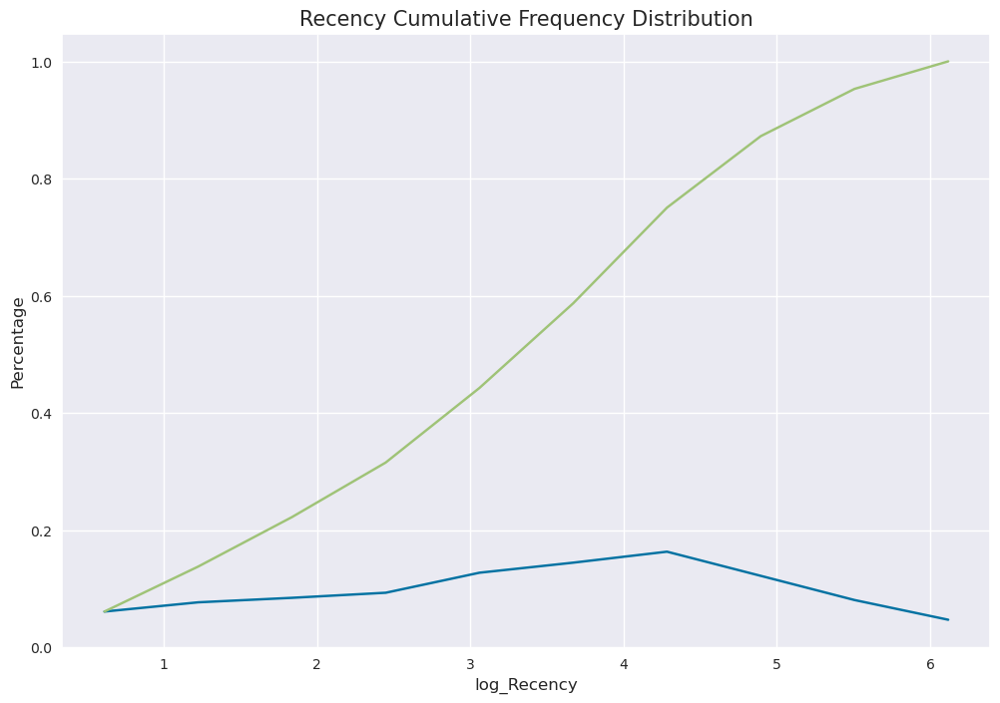

In [ ]:
# Create a new figure with a size of 12 inches by 8 inches
plt.figure(figsize=(12,8))

# Calculate the histogram of the log-transformed 'Recency' values in the 'df_rfm' DataFrame
counts, bin_edges = np.histogram(np.log1p(df_rfm['Recency']), bins=10, density=True)

# Calculate the probability density function (PDF) of the histogram
pdf = counts/(sum(counts))

# Print the PDF and bin edges to the console
print(pdf)
print(bin_edges)

# Calculate the cumulative distribution function (CDF) of the PDF
cdf = np.cumsum(pdf)

# Plot the PDF and CDF as line plots using the bin edges as the x-values
plt.plot(bin_edges[1:], pdf)
plt.plot(bin_edges[1:], cdf)

# Set the x-axis label, y-axis label, and plot title
plt.xlabel('log_Recency', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Recency Cumulative Frequency Distribution', fontsize=15)

[0.00324384 0.04257541 0.15942741 0.27529336 0.28469005 0.16840327
 0.05840757 0.00774713 0.00020581 0.00000614]
[1.09861229 1.85149921 2.60438614 3.35727307 4.11015999 4.86304692
 5.61593384 6.36882077 7.12170769 7.87459462 8.62748155]


Text(0.5, 1.0, 'Frequency Cumulative Frequency Distribution')

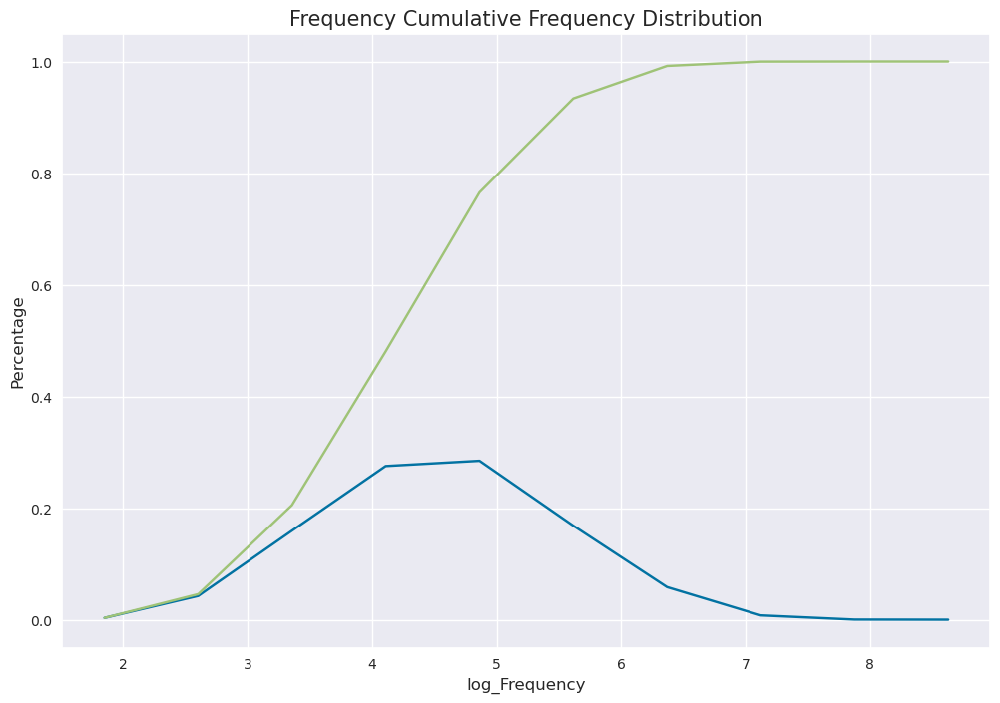

In [ ]:
# Create a new figure with a size of 12 inches by 8 inches
plt.figure(figsize=(12,8))

# Calculate the histogram of the log-transformed 'Frequency' values in the 'df_rfm' DataFrame
counts, bin_edges = np.histogram(np.log1p(df_rfm['Frequency']), bins=10, density=True)

# Calculate the probability density function (PDF) of the histogram
pdf = counts/(sum(counts))

# Print the PDF and bin edges to the console
print(pdf)
print(bin_edges)

# Calculate the cumulative distribution function (CDF) of the PDF
cdf = np.cumsum(pdf)

# Plot the PDF and CDF as line plots using the bin edges as the x-values
plt.plot(bin_edges[1:], pdf)
plt.plot(bin_edges[1:], cdf)

# Set the x-axis label, y-axis label, and plot title
plt.xlabel('log_Frequency', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Frequency Cumulative Frequency Distribution', fontsize=15)

[1. 0. 0. 0. 0. 0. 0. 0. 0.]
[  -3595.34717058  664647.61929786 1332890.5857663  2001133.55223473
 2669376.51870317 3337619.48517161 4005862.45164005 4674105.41810848
 5342348.38457692 6010591.35104536]


/opt/conda/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0.5, 1.0, 'Monetary Cumulative Frequency Distribution')

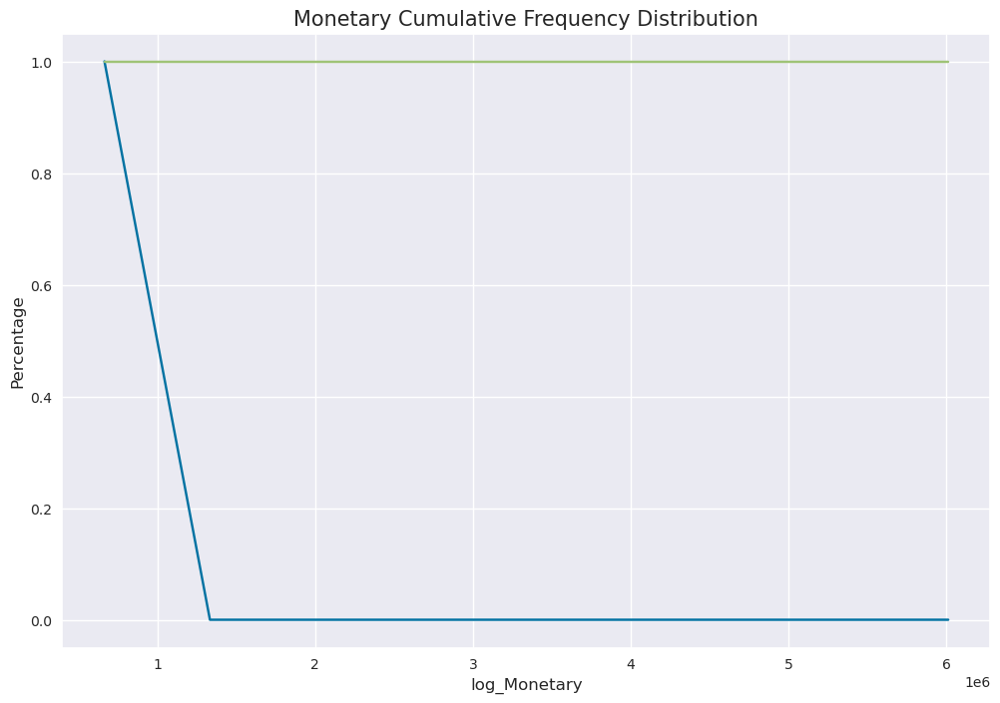

In [ ]:
min_val = df_rfm['Monetary'].min()
max_val = df_rfm['Monetary'].max()
bins = np.linspace(min_val, max_val, 10)

plt.figure(figsize=(12,8))
counts, bin_edges = np.histogram(np.log1p(df_rfm['Monetary']), bins=bins, density=True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf);
plt.plot(bin_edges[1:], cdf)
plt.xlabel('log_Monetary', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Monetary Cumulative Frequency Distribution',fontsize=15)

## 1. Simple Rule Based Approach - The Business Analyst Way

In [ ]:
# Calculate the specified quantiles of the 'df_rfm' DataFrame using the quantile() function
df_rfm.quantile(q=[0.1, 0.25, 0.4, 0.5, 0.75, 0.9])

,Recency,Frequency,Monetary
0.10000,2.00000,18.00000,-134.70522
0.25000,7.00000,32.00000,-72.63019
0.40000,17.00000,48.00000,-46.25902
0.50000,27.00000,63.00000,-34.73008
0.75000,71.00000,122.00000,-15.16231
0.90000,161.00000,222.00000,-5.75759


### Thresholds for R | F | M

In [ ]:
# Calculate the threshold value for 'Monetary' as the median plus 1 using the median() method of the DataFrame and the int() function
threshold_M = int(df_rfm.median()['Monetary']) + 1
print(threshold_M)

# Calculate the threshold value for 'Frequency' as the 75th percentile using the quantile() method of the 'Frequency' column
threshold_F = df_rfm.Frequency.quantile(0.75)
print(threshold_F)

# Calculate the threshold value for 'Recency' as the 40th percentile using the quantile() method of the 'Recency' column
threshold_R = df_rfm.Recency.quantile(0.40)
print(threshold_R)

-33
122.0
17.0


In [ ]:
# Create a new column 'threshold_R' in the DataFrame that indicates whether each customer's 'Recency' value is less than the threshold value for 'Recency'
df_rfm['threshold_R'] = df_rfm['Recency'].apply(lambda x: x < threshold_R)

# Create a new column 'threshold_F' in the DataFrame that indicates whether each customer's 'Frequency' value is greater than the threshold value for 'Frequency'
df_rfm['threshold_F'] = df_rfm['Frequency'].apply(lambda x: x > threshold_F)

# Create a new column 'threshold_M' in the DataFrame that indicates whether each customer's 'Monetary' value is greater than the threshold value for 'Monetary'
df_rfm['threshold_M'] = df_rfm['Monetary'].apply(lambda x: x > threshold_M)

# Convert the values in the 'threshold_R', 'threshold_F', and 'threshold_M' columns to integers using the astype() method of the DataFrame
df_rfm[['threshold_R', 'threshold_F', 'threshold_M']] = df_rfm[['threshold_R', 'threshold_F', 'threshold_M']].apply(lambda x: x.astype(int), axis=1)

# Create new columns 'IsLoyal' and 'Segment' in the DataFrame and initialize them to 'NA'
df_rfm['IsLoyal'] = 'NA'
df_rfm['Segment'] = 'NA'

# Print the first 10 rows of the DataFrame using the head() method
df_rfm.head(10)

,Recency,Frequency,Monetary,threshold_R,threshold_F,threshold_M,IsLoyal,Segment
card_id,,,,,,,,
C_ID_00007093c1,21,152,-78.83031,0,1,0,NA,NA
C_ID_0001238066,0,149,-87.27336,1,1,0,NA,NA
C_ID_0001506ef0,39,69,-36.76984,0,0,0,NA,NA
C_ID_0001793786,120,253,-39.63830,0,1,0,NA,NA
C_ID_000183fdda,0,160,-78.62380,1,1,0,NA,NA
C_ID_00024e244b,83,73,-43.67807,0,0,0,NA,NA
C_ID_0002709b5a,0,77,-50.35916,1,0,0,NA,NA
C_ID_00027503e2,101,45,-33.32921,0,0,0,NA,NA
C_ID_000298032a,32,34,-18.36413,0,0,1,NA,NA


In [ ]:
# A function that assigns loyalty statuses to each customer based on their threshold values
def Loyalty_assign(x):
    if((x[5]==1) & (x[4]==1)):
        return 'Loyal'
    elif((x[3]==1) & (x[4]==0)):
        return 'Loyal'
    else:
        return 'Not Loyal'

# A function that assigns segments to each customer based on their threshold values
def Segment_assign(x):
    if((x[5]==1) & (x[3]==1) & (x[4]==1)):
        return 'Champions'
    elif((x[5]==1) & (x[3]==1) & (x[4]==0)):
        return 'Future Champions'
    elif((x[5]==1) & (x[3]==0) & (x[4]==1)):
        return 'Very Valuable'
    elif((x[5]==1) & (x[3]==0) & (x[4]==0)):
        return 'Hibernating'
    elif((x[5]==0) & (x[3]==1) & (x[4]==1)):
        return 'Active'
    elif((x[5]==0) & (x[3]==1) & (x[4]==0)):
        return 'About to Sleep'
    elif((x[5]==0) & (x[3]==0)):
        return 'Lost'

In [ ]:
# Apply the 'Segment_assign()' function to each row of the DataFrame using the 'apply()' method and store the result in a new column 'Segment'
df_rfm['Segment'] = df_rfm.apply(Segment_assign, axis=1)

# Apply the 'Loyalty_assign()' function to each row of the DataFrame using the 'apply()' method and store the result in a new column 'IsLoyal'
df_rfm['IsLoyal'] = df_rfm.apply(Loyalty_assign, axis=1)

# Print the first few rows of the updated DataFrame using the 'head()' method
df_rfm.head()

,Recency,Frequency,Monetary,threshold_R,threshold_F,threshold_M,IsLoyal,Segment
card_id,,,,,,,,
C_ID_00007093c1,21,152,-78.83031,0,1,0,Not Loyal,Lost
C_ID_0001238066,0,149,-87.27336,1,1,0,Not Loyal,Active
C_ID_0001506ef0,39,69,-36.76984,0,0,0,Not Loyal,Lost
C_ID_0001793786,120,253,-39.63830,0,1,0,Not Loyal,Lost
C_ID_000183fdda,0,160,-78.62380,1,1,0,Not Loyal,Active


In [ ]:
df_rfm['IsLoyal'].value_counts()

IsLoyal
Not Loyal    238019
Loyal         87521
Name: count, dtype: int64

In [ ]:
df_rfm['Segment'].value_counts()

Segment
Hibernating         105947
Lost                 88998
Future Champions     48531
Active               43074
About to Sleep       36421
Champions             1427
Very Valuable         1142
Name: count, dtype: int64

In [ ]:
df_rfm.reset_index(inplace=True)

In [ ]:
df_rfm.head()

,card_id,Recency,Frequency,Monetary,threshold_R,threshold_F,threshold_M,IsLoyal,Segment
0,C_ID_00007093c1,21,152,-78.83031,0,1,0,Not Loyal,Lost
1,C_ID_0001238066,0,149,-87.27336,1,1,0,Not Loyal,Active
2,C_ID_0001506ef0,39,69,-36.76984,0,0,0,Not Loyal,Lost
3,C_ID_0001793786,120,253,-39.63830,0,1,0,Not Loyal,Lost
4,C_ID_000183fdda,0,160,-78.62380,1,1,0,Not Loyal,Active


In [ ]:
df_Segment = df_rfm.groupby('Segment', as_index=False).agg({'Monetary':sum, 'card_id':groupby_count, 'Frequency':sum})
df_Segment.columns = ['Segment','Monetary', 'No_Cards', 'Frequency']
df_Segment

,Segment,Monetary,No_Cards,Frequency
0,About to Sleep,-1905062.85263,36421,3060979
1,Active,-6760411.31076,43074,11143274
2,Champions,4049943.99308,1427,307670
3,Future Champions,492092.41137,48531,1819579
4,Hibernating,8510149.63448,105947,3315942
5,Lost,-7705877.70975,88998,12287166
6,Very Valuable,2548529.35708,1142,229368


In [ ]:
df_Loyal = df_rfm.groupby('IsLoyal', as_index=False).agg({'Monetary':sum, 'card_id':groupby_count, 'Frequency':sum})
df_Loyal.columns = ['Loyality','Monetary', 'No_Cards', 'Frequency']
df_Loyal

,Loyality,Monetary,No_Cards,Frequency
0,Loyal,5185502.90890,87521,5417596
1,Not Loyal,-5956139.38602,238019,26746382


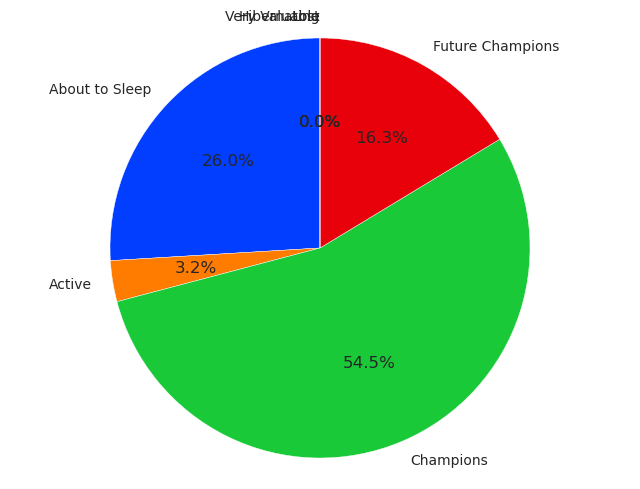

In [ ]:
amount = df_Segment['Monetary'].values.tolist()
amount = [x for x in amount if x >= 0]
groups = df_Segment['Segment'].values.tolist()

if len(amount) < len(groups):
    amount += [0] * (len(groups) - len(amount))
elif len(groups) < len(amount):
    groups += [' '] * (len(amount) - len(groups))

plt.figure(figsize=(8, 6))
sns.set_palette('bright')
sns.set_style('whitegrid')
plt.pie(amount, labels=groups, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.show()

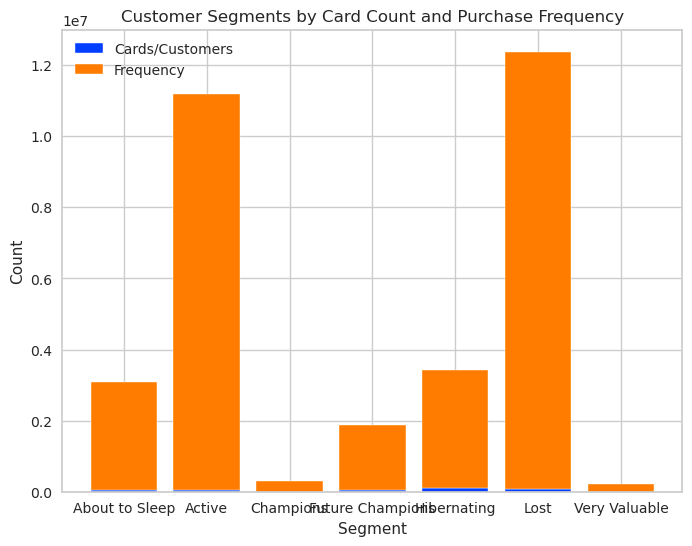

In [ ]:
# Set up the data
groups = df_Segment['Segment'].values.tolist()
no_company = df_Segment['No_Cards'].values.tolist()
distinct_frequency = df_Segment['Frequency'].values.tolist()

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Create the bars
ax.bar(groups, no_company, label='Cards/Customers')
ax.bar(groups, distinct_frequency, bottom=no_company, label='Frequency')

# Add labels and legend
ax.set_xlabel('Segment')
ax.set_ylabel('Count')
ax.set_title('Customer Segments by Card Count and Purchase Frequency')
ax.legend()

plt.show()

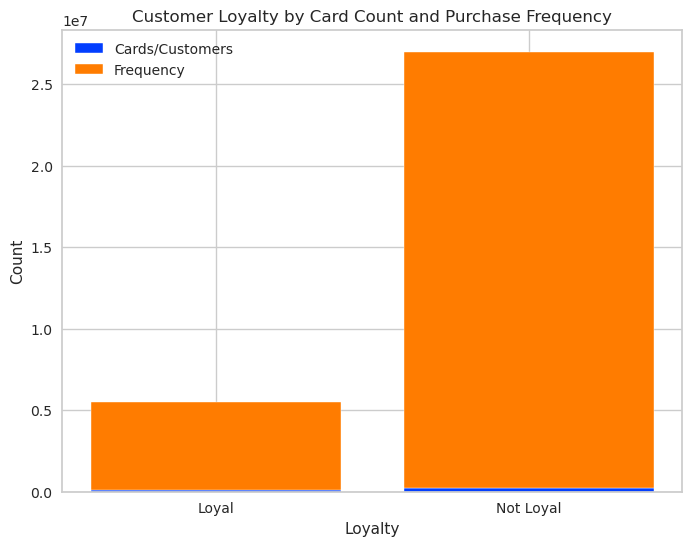

In [ ]:
# Set up the data
groups = df_Loyal['Loyality'].values.tolist()
no_company = df_Loyal['No_Cards'].values.tolist()
distinct_frequency = df_Loyal['Frequency'].values.tolist()

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Create the bars
ax.bar(groups, no_company, label='Cards/Customers')
ax.bar(groups, distinct_frequency, bottom=no_company, label='Frequency')

# Add labels and legend
ax.set_xlabel('Loyalty')
ax.set_ylabel('Count')
ax.set_title('Customer Loyalty by Card Count and Purchase Frequency')
ax.legend()

plt.show()

## 2. Clustering Algorithms Based Segmentation

In [ ]:
rank_df = df_rfm[['Recency','Frequency', 'Monetary']].rank(method='first')
rank_df.head(2)

,Recency,Frequency,Monetary
0,144103.00000,264815.00000,73446.00000
1,1.00000,263085.00000,64261.00000


In [ ]:
rank_df.describe()

,Recency,Frequency,Monetary
count,325540.00000,325540.00000,325540.00000
mean,162770.50000,162770.50000,162770.50000
std,93975.44765,93975.44765,93975.44765
min,1.00000,1.00000,1.00000
25%,81385.75000,81385.75000,81385.75000
50%,162770.50000,162770.50000,162770.50000
75%,244155.25000,244155.25000,244155.25000
max,325540.00000,325540.00000,325540.00000


In [ ]:
normalized_df = (rank_df - rank_df.mean()) / rank_df.std()
normalized_df.head(2)

,Recency,Frequency,Monetary
0,-0.19864,1.08586,-0.95051
1,-1.73204,1.06745,-1.04825


In [ ]:
#Perform aggregation process on this dataset [group by on user_card_id]
# Group by user_card_id and apply aggregations
agg_df = df.groupby("card_id").agg({"installments": ["sum", "mean"],
                                    "purchase_date": ["count", "max", "min"],
                                    "category_2_x": "mean",
                                    "category_1_x": "mean",
                                    "category_3": "mean"})

# Flatten the column names
agg_df.columns = [f"{col[0]}_{col[1].lower()}" for col in agg_df.columns]

# Reset the index
agg_df = agg_df.reset_index()

# Save the aggregated dataset
agg_df.to_csv("aggregated_dataset.csv", index=False)

In [ ]:
#display 'agg_df' data set
agg_df

,card_id,installments_sum,installments_mean,purchase_date_count,purchase_date_max,purchase_date_min,category_2_x_mean,category_1_x_mean,category_3_mean
0,C_ID_00007093c1,195.00000,1.28289,152,2018-04-09 16:23:59,2017-02-14 14:00:43,-181.59211,0.18421,1.15789
1,C_ID_0001238066,244.00000,1.63758,149,2018-04-30 19:57:30,2017-09-28 22:25:14,-65.49664,0.02685,1.29530
2,C_ID_0001506ef0,1.00000,0.01449,69,2018-03-22 09:14:30,2017-01-14 16:16:01,2.88406,0.00000,0.01449
3,C_ID_0001793786,5.00000,0.01976,253,2017-12-31 17:35:56,2017-01-21 10:15:21,-456.99209,0.00791,0.01976
4,C_ID_000183fdda,290.00000,1.81250,160,2018-04-30 14:59:53,2017-08-07 09:49:14,-22.19375,0.02500,1.31875
...,...,...,...,...,...,...,...,...,...
325535,C_ID_ffff1d9928,32.00000,2.00000,16,2018-04-20 10:28:14,2017-10-26 00:00:00,-121.75000,0.12500,1.31250
325536,C_ID_ffff579d3a,3.00000,0.02609,115,2018-03-21 08:55:34,2017-08-08 12:33:43,1.03478,0.00000,0.02609
325537,C_ID_ffff756266,80.00000,3.20000,25,2018-04-10 07:43:43,2017-01-24 20:00:38,-119.00000,0.12000,1.60000
325538,C_ID_ffff828181,241.00000,1.21106,199,2018-04-29 18:59:29,2017-01-05 15:27:33,-63.38693,0.05528,1.13568


In [ ]:
df_rfm

,card_id,Recency,Frequency,Monetary,threshold_R,threshold_F,threshold_M,IsLoyal,Segment
0,C_ID_00007093c1,21,152,-78.83031,0,1,0,Not Loyal,Lost
1,C_ID_0001238066,0,149,-87.27336,1,1,0,Not Loyal,Active
2,C_ID_0001506ef0,39,69,-36.76984,0,0,0,Not Loyal,Lost
3,C_ID_0001793786,120,253,-39.63830,0,1,0,Not Loyal,Lost
4,C_ID_000183fdda,0,160,-78.62380,1,1,0,Not Loyal,Active
...,...,...,...,...,...,...,...,...,...
325535,C_ID_ffff1d9928,10,16,-9.43793,1,0,1,Loyal,Future Champions
325536,C_ID_ffff579d3a,40,115,-80.95703,0,0,0,Not Loyal,Lost
325537,C_ID_ffff756266,20,25,-5.12784,0,0,1,Not Loyal,Hibernating
325538,C_ID_ffff828181,1,199,-125.77425,1,1,0,Not Loyal,Active


In [ ]:
# reset the index of the 'df_rfm' dataframe
agg_df = agg_df.reset_index()

In [ ]:
# reset the index of the 'df_rfm' dataframe and drop the 'index' column
df_rfm = df_rfm.reset_index(drop=True)

In [ ]:
df2 = pd.merge(df_rfm, agg_df, on="card_id")

In [ ]:
df2

,card_id,Recency,Frequency,Monetary,threshold_R,threshold_F,threshold_M,IsLoyal,Segment,index,installments_sum,installments_mean,purchase_date_count,purchase_date_max,purchase_date_min,category_2_x_mean,category_1_x_mean,category_3_mean
0,C_ID_00007093c1,21,152,-78.83031,0,1,0,Not Loyal,Lost,0,195.00000,1.28289,152,2018-04-09 16:23:59,2017-02-14 14:00:43,-181.59211,0.18421,1.15789
1,C_ID_0001238066,0,149,-87.27336,1,1,0,Not Loyal,Active,1,244.00000,1.63758,149,2018-04-30 19:57:30,2017-09-28 22:25:14,-65.49664,0.02685,1.29530
2,C_ID_0001506ef0,39,69,-36.76984,0,0,0,Not Loyal,Lost,2,1.00000,0.01449,69,2018-03-22 09:14:30,2017-01-14 16:16:01,2.88406,0.00000,0.01449
3,C_ID_0001793786,120,253,-39.63830,0,1,0,Not Loyal,Lost,3,5.00000,0.01976,253,2017-12-31 17:35:56,2017-01-21 10:15:21,-456.99209,0.00791,0.01976
4,C_ID_000183fdda,0,160,-78.62380,1,1,0,Not Loyal,Active,4,290.00000,1.81250,160,2018-04-30 14:59:53,2017-08-07 09:49:14,-22.19375,0.02500,1.31875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325535,C_ID_ffff1d9928,10,16,-9.43793,1,0,1,Loyal,Future Champions,325535,32.00000,2.00000,16,2018-04-20 10:28:14,2017-10-26 00:00:00,-121.75000,0.12500,1.31250
325536,C_ID_ffff579d3a,40,115,-80.95703,0,0,0,Not Loyal,Lost,325536,3.00000,0.02609,115,2018-03-21 08:55:34,2017-08-08 12:33:43,1.03478,0.00000,0.02609
325537,C_ID_ffff756266,20,25,-5.12784,0,0,1,Not Loyal,Hibernating,325537,80.00000,3.20000,25,2018-04-10 07:43:43,2017-01-24 20:00:38,-119.00000,0.12000,1.60000
325538,C_ID_ffff828181,1,199,-125.77425,1,1,0,Not Loyal,Active,325538,241.00000,1.21106,199,2018-04-29 18:59:29,2017-01-05 15:27:33,-63.38693,0.05528,1.13568


In [ ]:
usersc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201917 entries, 0 to 201916
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   card_id             201917 non-null  object 
 1   first_active_month  201917 non-null  object 
 2   feature_1           201917 non-null  int64  
 3   feature_2           201917 non-null  int64  
 4   feature_3           201917 non-null  int64  
 5   score               201917 non-null  float64
dtypes: float64(1), int64(3), object(2)
memory usage: 9.2+ MB


I will do some preprocessing on 'userscore' data set to avoid any error when merging it with 'agg_df'

In [ ]:
# Standardize the data
usersc_df = usersc_df.astype({'card_id': 'object',
                'first_active_month': 'category',
                'feature_1': 'int64',
                'feature_2': 'int64',
                'feature_3': 'int64',
                'score': 'float64'})

In [ ]:
#Select the categorical columns
cat_cols2 = usersc_df.select_dtypes(include=['category']).columns.tolist()

#Apply label encoding to each categorical column
le = LabelEncoder()
for col in cat_cols2:
    usersc_df[col] = le.fit_transform(usersc_df[col])

#Check the updated DataFrame
print(usersc_df.head())

           card_id  first_active_month  feature_1  feature_2  feature_3    score
0  C_ID_92a2005557                  43          5          2          1 -0.82028
1  C_ID_3d0044924f                  30          4          1          0  0.39291
2  C_ID_d639edf6cd                  10          2          2          0  0.68806
3  C_ID_186d6a6901                  74          4          3          0  0.14250
4  C_ID_cdbd2c0db2                  62          1          3          0 -0.15975


In [ ]:
New_df = pd.merge(df2, usersc_df, on="card_id")

In [ ]:
New_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201917 entries, 0 to 201916
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   card_id              201917 non-null  object        
 1   Recency              201917 non-null  int64         
 2   Frequency            201917 non-null  int64         
 3   Monetary             201917 non-null  float64       
 4   threshold_R          201917 non-null  int64         
 5   threshold_F          201917 non-null  int64         
 6   threshold_M          201917 non-null  int64         
 7   IsLoyal              201917 non-null  object        
 8   Segment              201917 non-null  object        
 9   index                201917 non-null  int64         
 10  installments_sum     201917 non-null  float64       
 11  installments_mean    201917 non-null  float64       
 12  purchase_date_count  201917 non-null  int64         
 13  purchase_date_

In [ ]:
New_df.to_csv("New_df.csv")

In [ ]:
New_df = pd.read_csv("New_df.csv")

In [ ]:
# take a random sample of 10 rows
sample_df = New_df.sample(n=50000, random_state=42)

# print the sample dataframe
print(sample_df)

        Unnamed: 0          card_id  Recency  Frequency   Monetary  threshold_R  threshold_F  threshold_M    IsLoyal           Segment   index  installments_sum  installments_mean  purchase_date_count    purchase_date_max    purchase_date_min  category_2_x_mean  category_1_x_mean  category_3_mean  first_active_month  feature_1  feature_2  feature_3    score
165789      165789  C_ID_d283f2abc9        6         39  -24.56689            1            0            1      Loyal  Future Champions  267563           0.00000            0.00000                   39  2018-04-24 16:03:25  2017-08-15 02:03:50            1.64103            0.00000          0.00000                  11          2          2          0 -0.81739
43663        43663  C_ID_371d96ed66      216        186 -134.04493            0            1            0  Not Loyal              Lost   70258           0.00000            0.00000                  186  2017-09-26 17:28:27  2017-01-03 15:05:18            1.00000            0.00000

In [ ]:
X=sample_df[['Recency','Frequency','Monetary','installments_sum','installments_mean','purchase_date_count',
        'category_2_x_mean','category_1_x_mean','category_3_mean',
        'first_active_month','feature_1','feature_2','feature_3','score']]

In [ ]:
X

,Recency,Frequency,Monetary,installments_sum,installments_mean,purchase_date_count,category_2_x_mean,category_1_x_mean,category_3_mean,first_active_month,feature_1,feature_2,feature_3,score
165789,6,39,-24.56689,0.00000,0.00000,39,1.64103,0.00000,0.00000,11,2,2,0,-0.81739
43663,216,186,-134.04493,0.00000,0.00000,186,1.00000,0.00000,0.00000,71,3,3,1,0.36938
201089,210,99,-29.44888,99.00000,1.00000,99,1.00000,0.00000,1.00000,61,4,1,0,1.50485
107580,68,222,-142.48586,3.00000,0.01351,222,2.92793,0.00000,0.01351,73,2,2,0,3.92317
163887,25,21,-14.51061,4.00000,0.19048,21,2.66667,0.00000,0.19048,62,3,1,1,1.38975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191018,5,198,-107.81537,217.00000,1.09596,198,-110.10101,0.09091,1.04545,68,4,1,0,0.08588
87408,189,45,-32.72181,0.00000,0.00000,45,2.64444,0.00000,0.00000,23,3,3,1,-0.07189
46450,0,96,-47.69585,115.00000,1.19792,96,-50.91667,0.03125,1.12500,62,1,1,0,-1.30931
176175,0,150,5441.49183,2.00000,0.01333,150,1.00000,0.00000,0.01333,68,3,2,1,-1.57749


In [ ]:
y=X['score']

In [ ]:
y

165789   -0.81739
43663     0.36938
201089    1.50485
107580    3.92317
163887    1.38975
           ...   
191018    0.08588
87408    -0.07189
46450    -1.30931
176175   -1.57749
118592    0.11084
Name: score, Length: 50000, dtype: float64

In [ ]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(X)

**K-Means Clustering**

**Using the elbow method to determine the optimal number of clusters for k-means clustering**

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: F

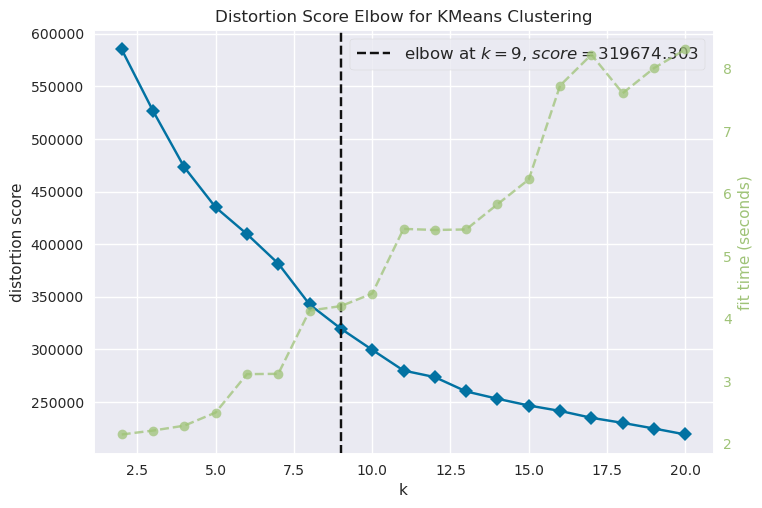

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Now, we can perform clustering on the above data
# Visualize performance of KMeans at various values k
# This approaches uses distortion score to evaluate KMeans
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 21))

visualizer.fit(df_scaled)
visualizer.show()

**Silhouette score**

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 2, Silhouette Score: 0.195, Change from Previous Cluster: 0.0


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 3, Silhouette Score: 0.2, Change from Previous Cluster: 0.005


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 4, Silhouette Score: 0.201, Change from Previous Cluster: 0.001


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 5, Silhouette Score: 0.203, Change from Previous Cluster: 0.002


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 6, Silhouette Score: 0.212, Change from Previous Cluster: 0.009


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 7, Silhouette Score: 0.204, Change from Previous Cluster: -0.008


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 8, Silhouette Score: 0.214, Change from Previous Cluster: 0.01


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 9, Silhouette Score: 0.221, Change from Previous Cluster: 0.007


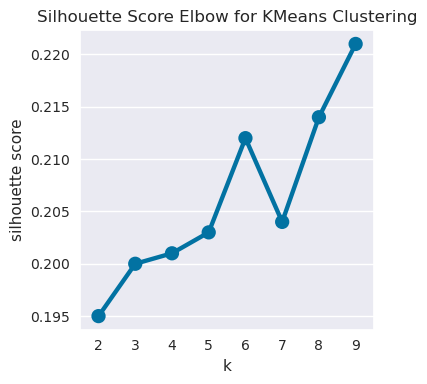

In [ ]:
# Evaluate KMeans at various values k, Silhouette score is open used
# Define a function to test KMeans at various k
# This approach uses silhouette score to evaluate KMeans
def optimal_kmeans(dataset, start=2, end=11):
    '''
    Calculate the optimal number of kmeans

    INPUT:
        dataset : dataframe. Dataset for k-means to fit
        start : int. Starting range of kmeans to test
        end : int. Ending range of kmeans to test
    OUTPUT:
        Values and line plot of Silhouette Score.
    '''

    # Create empty lists to store values for plotting graphs
    n_clu = []
    km_ss = []

    # Create a for loop to find optimal n_clusters
    for n_clusters in range(start, end):

        # Create cluster labels
        kmeans = KMeans(n_clusters=n_clusters)
        labels = kmeans.fit_predict(dataset)

        # Calcualte model performance
        silhouette_avg = round(silhouette_score(dataset, labels,
                                                random_state=1), 3)

        # Append score to lists
        km_ss.append(silhouette_avg)
        n_clu.append(n_clusters)

        print("No. Clusters: {}, Silhouette Score: {}, Change from Previous Cluster: {}".format(
            n_clusters,
            silhouette_avg,
            (km_ss[n_clusters - start] - km_ss[n_clusters - start - 1]).round(3)))

        # Plot graph at the end of loop
        if n_clusters == end - 1:
            plt.figure(figsize=(4,4))

            plt.title('Silhouette Score Elbow for KMeans Clustering')
            plt.xlabel('k')
            plt.ylabel('silhouette score')
            sns.pointplot(x=n_clu, y=km_ss)
            plt.savefig('silhouette_score.png', format='png', dpi=300,
                        pad_inches=2.0)
            plt.tight_layout()
            plt.show()

optimal_kmeans(df_scaled, 2, 10)

In [ ]:
k=10
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(df_scaled)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[6 3 2 ... 2 3 3]
[[ 0.8705254  -0.06646633 -0.00388718  0.2784274   0.27682328 -0.06646633
  -0.37898812  0.44673184  0.28016535 -0.18416217  0.08259372 -0.00571527
   0.06357814 -8.68955563]
 [-0.0428686  -0.3070362   0.00006123  0.25318     0.65755161 -0.3070362
   0.05351643 -0.04074042  0.95305121  0.09548689 -0.31218068  1.60931249
  -0.13883925  0.09492608]
 [-0.17008751 -0.2695951  -0.00040412  0.26245968  0.57004476 -0.2695951
   0.02380031  0.00404532  0.87557326  0.0352468  -0.69017517 -0.83221231
  -1.13795717  0.10546854]
 [ 0.10588469 -0.20904397 -0.00470989 -0.58511119 -0.78621911 -0.20904397
   0.36939942 -0.44013871 -1.0168468   0.0051356   0.25274952  0.1999901
   0.87876769  0.08895302]
 [-0.00456934 -0.25378172  0.0027209   0.35937804  0.74046529 -0.25378172
   0.0360133   0.00044425  0.95322304  0.02352496  1.32675778 -0.95590545
   0.87876769  0.08603839]
 [ 0.20016516 -0.47617082  0.0068971   0.19400693  1.20907356 -0.47617082
  -2.77530161  3.04908288  0.9899863

In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

299568.58160112315


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({6: 5546,
         3: 15354,
         2: 8837,
         1: 5672,
         4: 6056,
         5: 3406,
         8: 2588,
         9: 2011,
         0: 522,
         7: 8})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(df_scaled)

# Print the labels
print(labels1)


[6 3 2 ... 2 3 3]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(df_scaled)

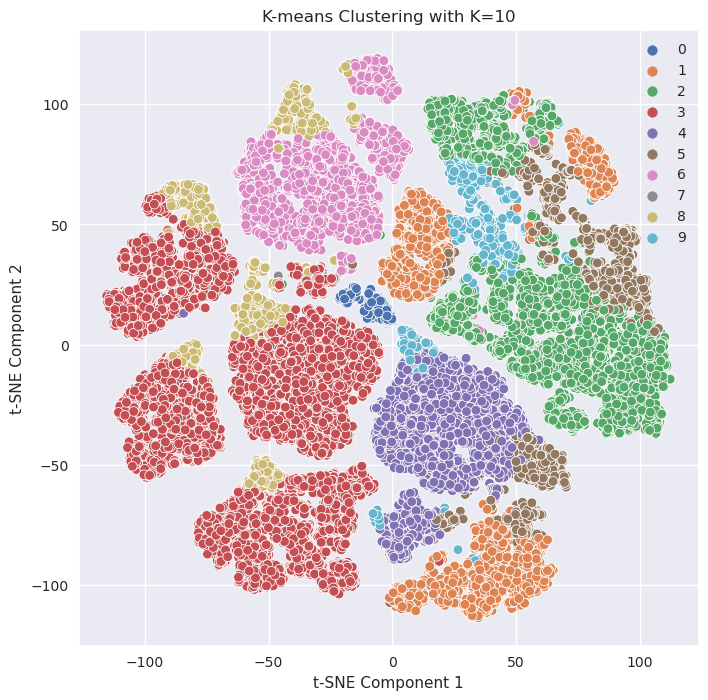

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=10')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                    Frequency                        Monetary                         installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                     score                  
             mean    median      std      mean    median       std        mean      median         std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std      mean    median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                      
0       124.45019 109.50000 76.36943  91.12835  66.50000  85.08598   -33.11100   -37.19295   397.49740         95.15517  62.00000 128.74320           1.16628 1.15385 1.09854            91.12835  66.50000  85.08598        -202.78310  -64.08013 277.91598           0.18791 0.06071 0.26047         0.84960 1.07785 0.59426           36.52874 36.00000 20.53984   3.20498 3.00000 1.17644   1.74330 2.00000 0.81446   0.59579 1.00000 0.49121 -33.21928 -33.21928 0.00000
1        54.63946  30.00000 71.13205  64.76798  50.00000  47.98103   -28.25750   -27.51061   491.81485         92.37606  76.00000  63.09012           1.57432 1.38095 0.63181            64.76798  50.00000  47.98103        -104.94005  -51.18500 146.43034           0.09020 0.04545 0.11241         1.27843 1.21667 0.23087           42.83516 43.00000 23.67632   2.73590 3.00000 0.81841   2.95963 3.00000 0.19685   0.49542 0.00000 0.50002  -0.02808  -0.00473 1.48698
2        44.85244  18.00000 64.46518  68.89827  55.00000  49.52693   -28.84170   -27.93002   195.95827         93.42718  77.00000  62.67693           1.48059 1.29091 0.57908            68.89827  55.00000  49.52693        -111.63910  -61.50000 138.72582           0.09915 0.05479 0.11476         1.22908 1.17308 0.20554           41.48206 43.00000 22.73100   2.28675 2.00000 0.98077   1.12074 1.00000 0.32585   0.00000 0.00000 0.00000   0.01159   0.02275 1.53630
3        65.95018  33.00000 81.40754  75.56448  61.00000  53.70144   -34.15214   -38.74911   402.48604          1.70503   0.00000   4.47990           0.02680 0.00000 0.07859            75.56448  61.00000  53.70144         -33.42849    1.00000 134.38169           0.01009 0.00000 0.03511         0.02294 0.00000 0.05419           40.80188 42.00000 22.52309   3.40732 3.00000 0.80546   1.89820 2.00000 0.67077   1.00000 1.00000 0.00000  -0.05097  -0.05822 1.93104
4        57.52196  26.50000 77.07192  70.59808  55.00000  52.58996   -24.98820   -21.66969   112.51372        103.89036  85.00000  71.38827           1.66337 1.40363 0.77928            70.59808  55.00000  52.58996        -108.89271  -58.47619 139.36399           0.09844 0.05000 0.11941         1.27862 1.21739 0.24649           41.21813 42.00000 22.36770   4.68329 5.00000 0.73021   1.02741 1.00000 0.16329   1.00000 1.00000 0.00000  -0.06174  -0.01504 1.62011
5        73.17352  59.00000 77.70743  46.29096  31.00000  45.20868   -19.89237   -12.36157    36.46118         86.01938  63.00000  82.94207           2.16557 1.63564 1.84450            46.29096  31.00000  45.20868        -745.02710 -734.75232 191.51994           0.70968 0.69231 0.21893         1.30200 1.24390 0.2

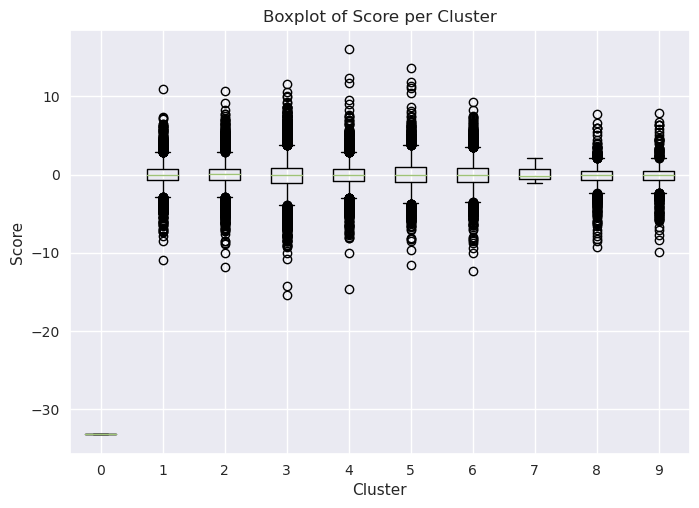

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
cluster_df

,Recency,Frequency,Monetary,installments_sum,installments_mean,purchase_date_count,category_2_x_mean,category_1_x_mean,category_3_mean,first_active_month,feature_1,feature_2,feature_3,score,cluster
165789,6,39,-24.56689,0.00000,0.00000,39,1.64103,0.00000,0.00000,11,2,2,0,-0.81739,6
43663,216,186,-134.04493,0.00000,0.00000,186,1.00000,0.00000,0.00000,71,3,3,1,0.36938,3
201089,210,99,-29.44888,99.00000,1.00000,99,1.00000,0.00000,1.00000,61,4,1,0,1.50485,2
107580,68,222,-142.48586,3.00000,0.01351,222,2.92793,0.00000,0.01351,73,2,2,0,3.92317,6
163887,25,21,-14.51061,4.00000,0.19048,21,2.66667,0.00000,0.19048,62,3,1,1,1.38975,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191018,5,198,-107.81537,217.00000,1.09596,198,-110.10101,0.09091,1.04545,68,4,1,0,0.08588,2
87408,189,45,-32.72181,0.00000,0.00000,45,2.64444,0.00000,0.00000,23,3,3,1,-0.07189,3
46450,0,96,-47.69585,115.00000,1.19792,96,-50.91667,0.03125,1.12500,62,1,1,0,-1.30931,2
176175,0,150,5441.49183,2.00000,0.01333,150,1.00000,0.00000,0.01333,68,3,2,1,-1.57749,3


In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [ 0.8705254  -0.06646633 -0.00388718  0.2784274   0.27682328 -0.06646633
 -0.37898812  0.44673184  0.28016535 -0.18416217  0.08259372 -0.00571527
  0.06357814 -8.68955563]
Centroid of cluster 1: [-0.0428686  -0.3070362   0.00006123  0.25318     0.65755161 -0.3070362
  0.05351643 -0.04074042  0.95305121  0.09548689 -0.31218068  1.60931249
 -0.13883925  0.09492608]
Centroid of cluster 2: [-0.17008751 -0.2695951  -0.00040412  0.26245968  0.57004476 -0.2695951
  0.02380031  0.00404532  0.87557326  0.0352468  -0.69017517 -0.83221231
 -1.13795717  0.10546854]
Centroid of cluster 3: [ 0.10588469 -0.20904397 -0.00470989 -0.58511119 -0.78621911 -0.20904397
  0.36939942 -0.44013871 -1.0168468   0.0051356   0.25274952  0.1999901
  0.87876769  0.08895302]
Centroid of cluster 4: [-0.00456934 -0.25378172  0.0027209   0.35937804  0.74046529 -0.25378172
  0.0360133   0.00044425  0.95322304  0.02352496  1.32675778 -0.95590545
  0.87876769  0.08603839]
Centroid of cluster 5: [ 0.2

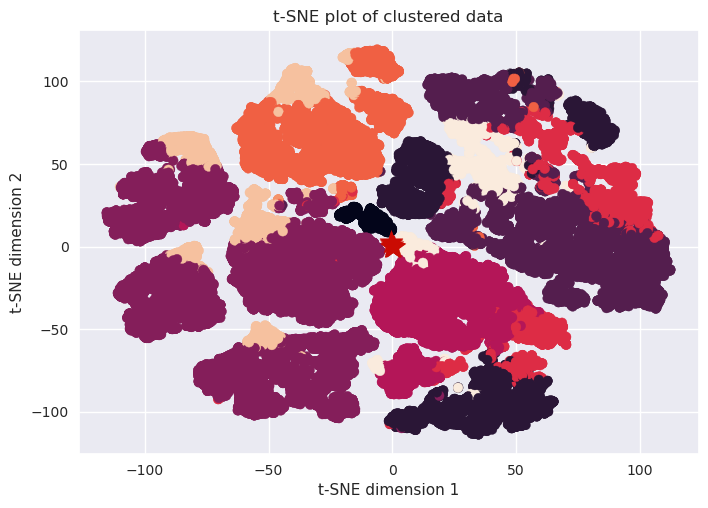

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=8
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(df_scaled)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 5 5 ... 2 1 1]
[[-0.43722862  2.85652626 -0.1422529   1.68319061 -0.17130171  2.85652626
   0.21367456 -0.20832229 -0.10650878 -0.15051895 -0.04628491 -0.07165159
  -0.25745081  0.0488694 ]
 [-0.2884982  -0.05742859 -0.00929002 -0.58360022 -0.78814793 -0.05742859
   0.38087755 -0.44965338 -1.01895693  0.0075698  -0.00372258  0.22759663
   0.37517692  0.08990513]
 [-0.28730561 -0.23669786  0.00026073  0.3288883   0.60736799 -0.23669786
   0.05206867 -0.0238528   0.90129051  0.07752283 -0.67242876 -0.25063233
  -1.13795717  0.10163922]
 [-0.21975922 -0.26700528 -0.00072231  0.33231286  0.7096772  -0.26700528
   0.05337572 -0.01339413  0.95714506  0.04638742  0.90343653 -0.19195169
   0.87876769  0.09641631]
 [ 0.15892685 -0.44902302  0.00536754  0.24140481  1.20870406 -0.44902302
  -2.68844371  2.90052321  0.9924106   0.02931453 -0.01045676 -0.19171583
  -0.37417627  0.11662642]
 [ 2.46751596 -0.34963018  0.01432646 -0.42724585 -0.43742667 -0.34963018
   0.33072468 -0.37631833 -0.5224

In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

342075.2378033823


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 18787, 5: 4370, 2: 11256, 3: 8096, 4: 3760, 0: 3201, 7: 522, 6: 8})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(df_scaled)

# Print the labels
print(labels1)


[1 5 5 ... 2 1 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(df_scaled)

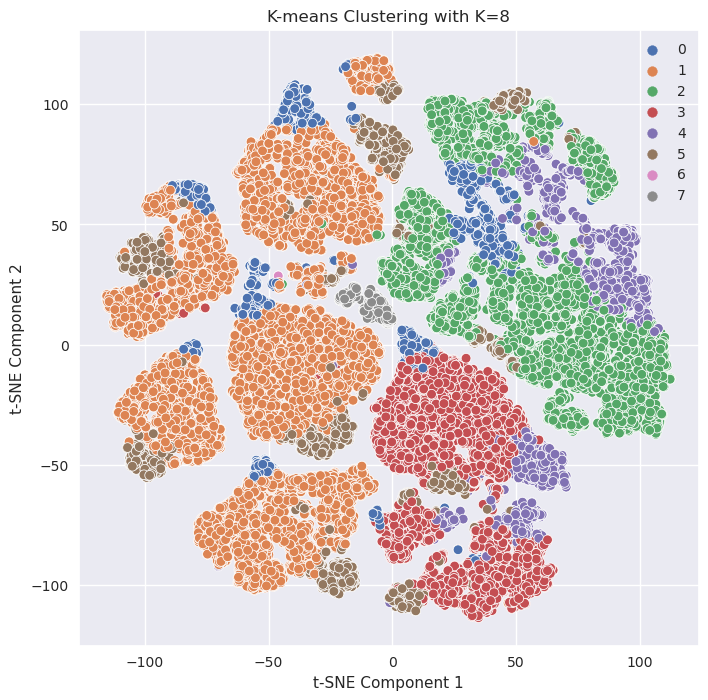

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=8')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                    Frequency                        Monetary                         installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                     score                  
             mean    median      std      mean    median       std        mean      median         std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std      mean    median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                      
0        24.42424   7.00000 41.89276 411.05186 368.00000 159.46066  -202.71188  -227.05456   525.02545        247.25055 283.00000 261.21984           0.68614 1.01269 0.69752           411.05186 368.00000 159.46066         -68.64919  -10.99029 140.89210           0.05658 0.00815 0.11071         0.60333 1.00733 0.54418           37.28491 37.00000 21.06778   3.05155 3.00000 1.42088   1.69353 2.00000 0.70097   0.43674 0.00000 0.49606  -0.20244  -0.08449 1.26487
1        35.79347  23.00000 36.52712  92.12828  71.00000  71.04967   -39.74181   -44.57718   518.57318          1.86874   0.00000   4.23596           0.02474 0.00000 0.06552            92.12828  71.00000  71.04967         -30.84496    1.00000 129.44452           0.00818 0.00000 0.03017         0.02160 0.00000 0.04936           40.85761 42.00000 22.65188   3.10246 3.00000 0.91685   1.91904 2.00000 0.58029   0.75025 1.00000 0.43288  -0.04719  -0.04545 1.81185
2        35.88628  17.00000 44.87811  72.49849  57.00000  53.40210   -28.02677   -28.48522   389.31704        100.61594  82.00000  70.61451           1.52060 1.32527 0.61853            72.49849  57.00000  53.40210        -105.24246  -59.16667 130.85389           0.09356 0.05263 0.10732         1.24547 1.18750 0.21850           42.43648 43.00000 23.14308   2.30784 2.00000 1.00926   1.55881 1.00000 0.84061   0.00000 0.00000 0.00000  -0.00288   0.01310 1.52631
3        41.05299  23.00000 47.54496  69.18169  54.00000  51.50278   -29.23172   -24.61144    94.08736        100.98654  82.00000  73.06068           1.63026 1.38577 0.76311            69.18169  54.00000  51.50278        -104.94670  -56.28400 132.52156           0.09565 0.04982 0.11438         1.28107 1.22222 0.24549           41.73357 43.00000 22.64298   4.18034 5.00000 0.98367   1.60301 1.00000 0.90035   1.00000 1.00000 0.00000  -0.02261   0.00000 1.54574
4        70.01915  55.00000 74.44464  49.26197  32.00000  49.70644   -21.76719   -13.15022    38.65462         91.14867  65.00000  96.17929           2.16517 1.63158 1.93737            49.26197  32.00000  49.70644        -725.37267 -709.97724 200.63355           0.67990 0.65625 0.23408         1.30355 1.25000 0.28138           41.34814 43.00000 22.75250   3.09441 3.00000 1.32782   1.60319 1.00000 0.78628   0.37872 0.00000 0.48513   0.05375   0.00000 1.97583
5       246.60595 244.00000 64.21357  60.13936  44.00000  52.01558   -10.78597   -26.67317   690.10992         18.78879   1.00000  36.29382           0.40068 0.01408 0.63430            60.13936  44.00000  52.01558         -42.18746    1.00000 140.10730           0.02289 0.00000 0.06321         0.33805 0.01408 0.5

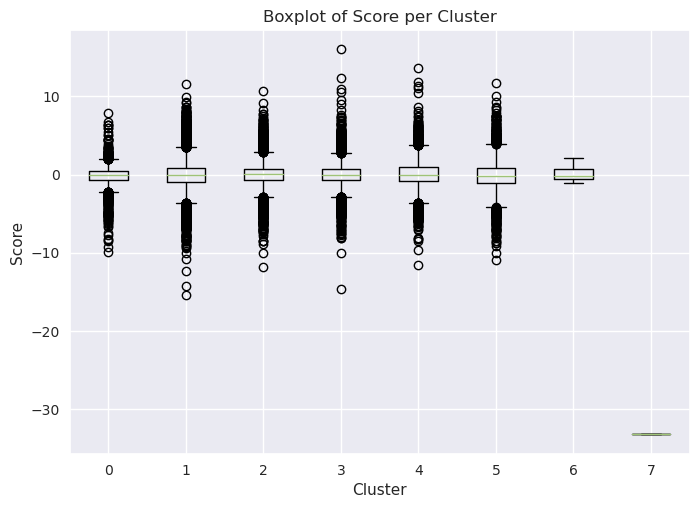

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
cluster_df

,Recency,Frequency,Monetary,installments_sum,installments_mean,purchase_date_count,category_2_x_mean,category_1_x_mean,category_3_mean,first_active_month,feature_1,feature_2,feature_3,score,cluster
165789,6,39,-24.56689,0.00000,0.00000,39,1.64103,0.00000,0.00000,11,2,2,0,-0.81739,1
43663,216,186,-134.04493,0.00000,0.00000,186,1.00000,0.00000,0.00000,71,3,3,1,0.36938,5
201089,210,99,-29.44888,99.00000,1.00000,99,1.00000,0.00000,1.00000,61,4,1,0,1.50485,5
107580,68,222,-142.48586,3.00000,0.01351,222,2.92793,0.00000,0.01351,73,2,2,0,3.92317,1
163887,25,21,-14.51061,4.00000,0.19048,21,2.66667,0.00000,0.19048,62,3,1,1,1.38975,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191018,5,198,-107.81537,217.00000,1.09596,198,-110.10101,0.09091,1.04545,68,4,1,0,0.08588,2
87408,189,45,-32.72181,0.00000,0.00000,45,2.64444,0.00000,0.00000,23,3,3,1,-0.07189,5
46450,0,96,-47.69585,115.00000,1.19792,96,-50.91667,0.03125,1.12500,62,1,1,0,-1.30931,2
176175,0,150,5441.49183,2.00000,0.01333,150,1.00000,0.00000,0.01333,68,3,2,1,-1.57749,1


In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-0.43722862  2.85652626 -0.1422529   1.68319061 -0.17130171  2.85652626
  0.21367456 -0.20832229 -0.10650878 -0.15051895 -0.04628491 -0.07165159
 -0.25745081  0.0488694 ]
Centroid of cluster 1: [-0.2884982  -0.05742859 -0.00929002 -0.58360022 -0.78814793 -0.05742859
  0.38087755 -0.44965338 -1.01895693  0.0075698  -0.00372258  0.22759663
  0.37517692  0.08990513]
Centroid of cluster 2: [-0.28730561 -0.23669786  0.00026073  0.3288883   0.60736799 -0.23669786
  0.05206867 -0.0238528   0.90129051  0.07752283 -0.67242876 -0.25063233
 -1.13795717  0.10163922]
Centroid of cluster 3: [-0.21975922 -0.26700528 -0.00072231  0.33231286  0.7096772  -0.26700528
  0.05337572 -0.01339413  0.95714506  0.04638742  0.90343653 -0.19195169
  0.87876769  0.09641631]
Centroid of cluster 4: [ 0.15892685 -0.44902302  0.00536754  0.24140481  1.20870406 -0.44902302
 -2.68844371  2.90052321  0.9924106   0.02931453 -0.01045676 -0.19171583
 -0.37417627  0.11662642]
Centroid of cluster 5: [ 

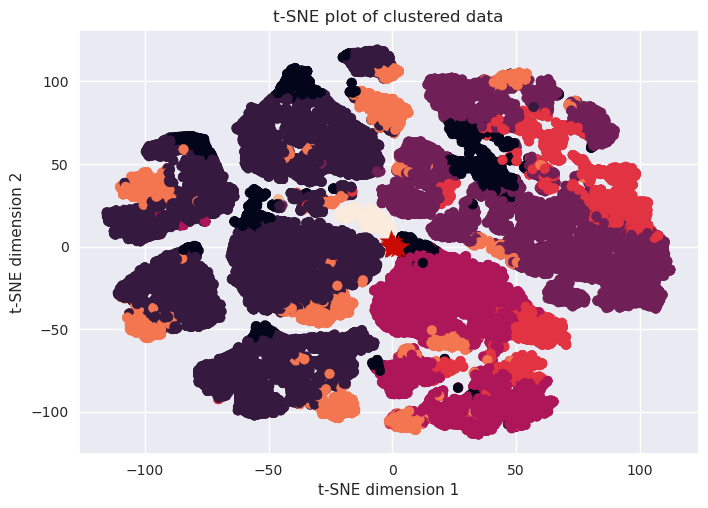

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=6
kmeans = KMeans(n_clusters=6,max_iter=1000).fit(df_scaled)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 1 2 ... 2 1 1]
[[-0.36484163  2.3073703  -0.06950699 -0.55813536 -0.79845912  2.3073703
   0.43448038 -0.47578285 -1.03294642 -0.13201116  0.1117696   0.28303032
   0.25565791  0.04578048]
 [ 0.13684362 -0.22703282  0.01557558 -0.58306089 -0.77953439 -0.22703282
   0.37797086 -0.44806726 -1.00612698 -0.01576567 -0.00244799  0.24381667
   0.36779799  0.09281769]
 [-0.07733711 -0.3154238   0.00844332  0.23150422  0.63338102 -0.3154238
   0.12282713 -0.0752635   0.91970649  0.05780766  0.00375844 -0.19561427
  -0.28260096  0.09753626]
 [ 0.8705254  -0.06646633 -0.00388718  0.2784274   0.27682328 -0.06646633
  -0.37898812  0.44673184  0.28016535 -0.18416217  0.08259372 -0.00571527
   0.06357814 -8.68955563]
 [-0.45126767  1.92836641 -0.1025342   3.01544093  0.44626168  1.92836641
  -0.02558482  0.06670156  0.70323502 -0.1301638  -0.178845   -0.41571946
  -0.57437316  0.06300166]
 [ 0.13748644 -0.45470687  0.0059557   0.2162598   1.16559894 -0.45470687
  -2.52643401  2.64362079  0.999720

In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

411433.3212714851


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 20354, 2: 18819, 0: 3184, 5: 4405, 4: 2716, 3: 522})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(df_scaled)

# Print the labels
print(labels1)


[1 1 2 ... 2 1 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(df_scaled)

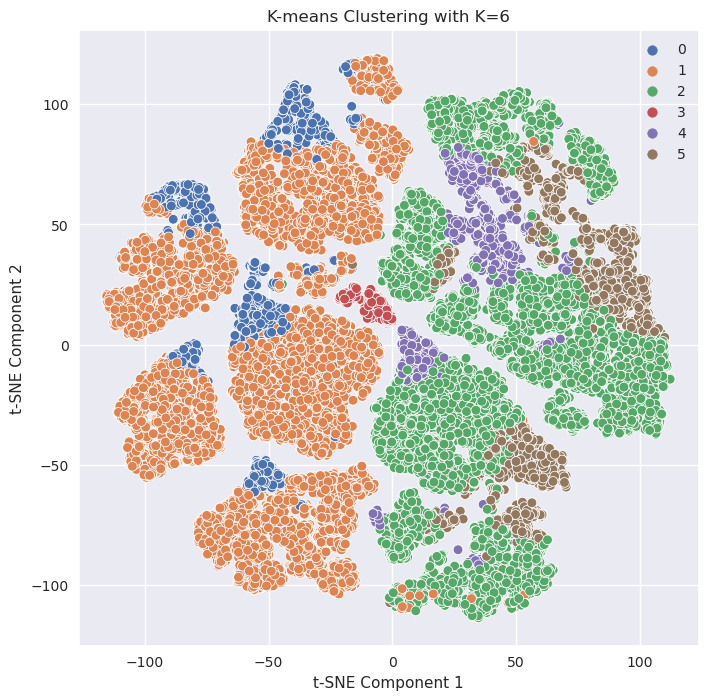

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=6')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                    Frequency                       Monetary                       installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                     score                  
             mean    median      std      mean    median       std       mean     median        std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std      mean    median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
0        29.98241  10.00000 49.18610 351.09893 304.00000 152.61164 -113.66251 -195.89224 2109.85952          4.62657   3.00000   6.51085           0.01368 0.00872 0.01955           351.09893 304.00000 152.61164         -18.73486    1.00000 107.80650           0.00295 0.00000 0.00901         0.01268 0.00872 0.01525           37.69786 37.00000 21.70937   3.23869 3.00000 1.11096   1.96074 2.00000 0.45746   0.69064 1.00000 0.46230  -0.21359  -0.09794 1.29542
1        68.31822  33.00000 84.50821  73.58229  60.00000  51.02932   -9.25672  -37.92923 1414.86483          1.92699   0.00000   5.45212           0.03396 0.00000 0.11435            73.58229  60.00000  51.02932         -31.48997    1.00000 132.25154           0.00850 0.00000 0.03180         0.02978 0.00000 0.09860           40.33119 42.00000 22.50713   3.10411 3.00000 0.91940   1.93127 2.00000 0.58741   0.74668 1.00000 0.43492  -0.03630  -0.05039 1.89374
2        51.94601  23.00000 71.47156  63.88379  52.00000  43.71172  -17.99624  -25.55159 1029.11002         90.07673  76.00000  57.51442           1.54850 1.34091 0.64033            63.88379  52.00000  43.71172         -89.18425  -50.44118 106.81467           0.08320 0.04545 0.09709         1.25720 1.19643 0.22729           41.98863 43.00000 22.88292   3.11132 3.00000 1.33627   1.60035 1.00000 0.87286   0.42415 0.00000 0.49423  -0.01828   0.00000 1.55604
3       124.45019 109.50000 76.36943  91.12835  66.50000  85.08598  -33.11100  -37.19295  397.49740         95.15517  62.00000 128.74320           1.16628 1.15385 1.09854            91.12835  66.50000  85.08598        -202.78310  -64.08013 277.91598           0.18791 0.06071 0.26047         0.84960 1.07785 0.59426           36.52874 36.00000 20.53984   3.20498 3.00000 1.17644   1.74330 2.00000 0.81446   0.59579 1.00000 0.49121 -33.21928 -33.21928 0.00000
4        23.34462   8.00000 38.17905 309.43962 269.00000 139.66230 -154.02573 -149.08258  205.83889        391.34867 340.00000 180.78439           1.34791 1.18598 1.12242           309.43962 269.00000 139.66230        -122.81409  -61.81906 160.91286           0.11171 0.05707 0.14090         1.11924 1.08931 0.11613           37.74779 37.00000 21.00410   2.89433 3.00000 1.58964   1.43446 1.00000 0.78272   0.27946 0.00000 0.44881  -0.14886  -0.07298 1.30977
5        68.37230  50.00000 75.30317  48.64631  33.00000  44.82181  -21.04790  -13.60134   35.54928         88.43087  66.00000  80.62516           2.11848 1.63333 1.69546            48.64631  33.00000  44.82181        -688.50439 -664.80952 215.83350           0.62822 0.60000 0.25373         1.30824 1.25806 0.28307           41.22838 43.

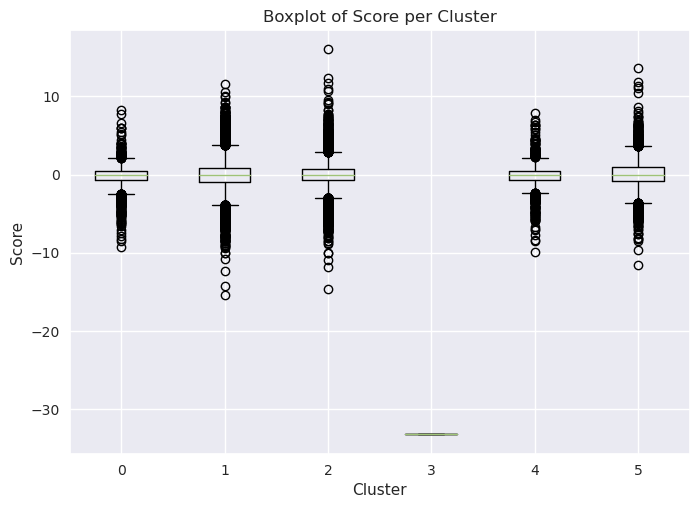

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
cluster_df

,Recency,Frequency,Monetary,installments_sum,installments_mean,purchase_date_count,category_2_x_mean,category_1_x_mean,category_3_mean,first_active_month,feature_1,feature_2,feature_3,score,cluster
165789,6,39,-24.56689,0.00000,0.00000,39,1.64103,0.00000,0.00000,11,2,2,0,-0.81739,1
43663,216,186,-134.04493,0.00000,0.00000,186,1.00000,0.00000,0.00000,71,3,3,1,0.36938,1
201089,210,99,-29.44888,99.00000,1.00000,99,1.00000,0.00000,1.00000,61,4,1,0,1.50485,2
107580,68,222,-142.48586,3.00000,0.01351,222,2.92793,0.00000,0.01351,73,2,2,0,3.92317,0
163887,25,21,-14.51061,4.00000,0.19048,21,2.66667,0.00000,0.19048,62,3,1,1,1.38975,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191018,5,198,-107.81537,217.00000,1.09596,198,-110.10101,0.09091,1.04545,68,4,1,0,0.08588,4
87408,189,45,-32.72181,0.00000,0.00000,45,2.64444,0.00000,0.00000,23,3,3,1,-0.07189,1
46450,0,96,-47.69585,115.00000,1.19792,96,-50.91667,0.03125,1.12500,62,1,1,0,-1.30931,2
176175,0,150,5441.49183,2.00000,0.01333,150,1.00000,0.00000,0.01333,68,3,2,1,-1.57749,1


In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-0.36484163  2.3073703  -0.06950699 -0.55813536 -0.79845912  2.3073703
  0.43448038 -0.47578285 -1.03294642 -0.13201116  0.1117696   0.28303032
  0.25565791  0.04578048]
Centroid of cluster 1: [ 0.13684362 -0.22703282  0.01557558 -0.58306089 -0.77953439 -0.22703282
  0.37797086 -0.44806726 -1.00612698 -0.01576567 -0.00244799  0.24381667
  0.36779799  0.09281769]
Centroid of cluster 2: [-0.07733711 -0.3154238   0.00844332  0.23150422  0.63338102 -0.3154238
  0.12282713 -0.0752635   0.91970649  0.05780766  0.00375844 -0.19561427
 -0.28260096  0.09753626]
Centroid of cluster 3: [ 0.8705254  -0.06646633 -0.00388718  0.2784274   0.27682328 -0.06646633
 -0.37898812  0.44673184  0.28016535 -0.18416217  0.08259372 -0.00571527
  0.06357814 -8.68955563]
Centroid of cluster 4: [-0.45126767  1.92836641 -0.1025342   3.01544093  0.44626168  1.92836641
 -0.02558482  0.06670156  0.70323502 -0.1301638  -0.178845   -0.41571946
 -0.57437316  0.06300166]
Centroid of cluster 5: [ 0.

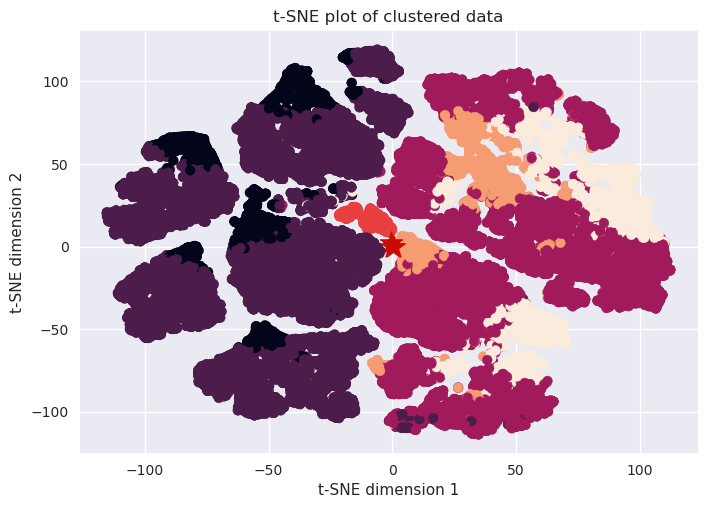

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=4
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(df_scaled)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[3 3 0 ... 0 3 3]
[[-0.07125657 -0.28524712  0.00689278  0.27576609  0.63010562 -0.28524712
   0.12001386 -0.07195521  0.91504792  0.05095999 -0.00058878 -0.19998469
  -0.28874474 -0.00382877]
 [-0.42983046  2.63742267 -0.10293181  1.63088471 -0.13933597  2.63742267
   0.21086184 -0.2019868  -0.05641225 -0.14934693 -0.05872852 -0.10240984
  -0.24863382 -0.00404183]
 [ 0.15119023 -0.42367569  0.00433289  0.27879402  1.18162691 -0.42367569
  -2.50766339  2.61758567  0.99664255  0.01686649  0.01885884 -0.24320471
  -0.3258532  -0.10631928]
 [ 0.10521045 -0.11014681  0.01061726 -0.58260483 -0.78278712 -0.11014681
   0.38282118 -0.45001588 -1.01105919 -0.0231537   0.00663597  0.24595207
   0.3670846   0.02636752]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

473109.8121136804


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({3: 22045, 0: 19570, 2: 4608, 1: 3777})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(df_scaled)

# Print the labels
print(labels1)


[3 3 0 ... 0 3 3]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(df_scaled)

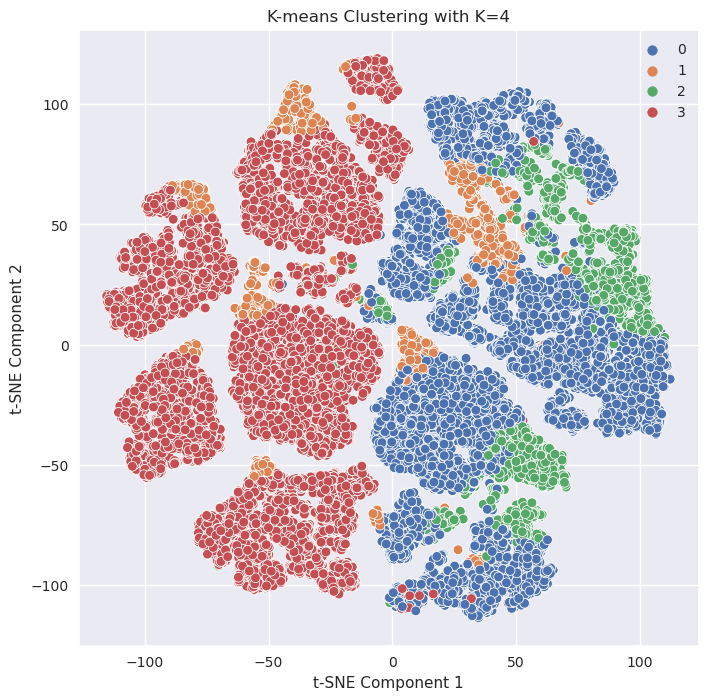

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=4')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                       Monetary                       installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                 
            mean   median      std      mean    median       std       mean     median        std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                               
0       52.41104 24.00000 71.79052  67.18993  54.00000  47.68815  -19.91045  -26.33018 1009.46829         94.86903  79.00000  65.00564           1.54487 1.33898 0.63742            67.18993  54.00000  47.68815         -90.05087  -51.63158 107.08048           0.08406 0.04688 0.09729         1.25421 1.19355 0.22590           41.83873 43.00000 22.85707   3.10583 3.00000 1.34003   1.59693 1.00000 0.87137   0.42100 0.00000 0.49373 -0.40141 -0.00614 3.86138
1       24.98967  8.00000 42.32769 387.06089 346.00000 158.76590 -154.49707 -212.63180 1823.52153        241.57824 266.00000 247.12684           0.72039 1.02691 0.68866           387.06089 346.00000 158.76590         -69.32718  -13.12397 137.31645           0.05786 0.01000 0.10858         0.63525 1.01449 0.54277           37.31003 37.00000 21.11825   3.03707 3.00000 1.44779   1.67064 2.00000 0.70603   0.44083 0.00000 0.49655 -0.40233 -0.09296 2.90384
2       69.47266 51.00000 75.61320  51.98025  34.00000  50.53537  -22.98861  -14.20395   38.49587         95.18772  68.00000  98.47494           2.13798 1.63060 1.83678            51.98025  34.00000  50.53537        -685.10653 -656.89859 216.50139           0.62381 0.59427 0.25414         1.30649 1.25658 0.28262           41.05707 43.00000 22.77793   3.13064 3.00000 1.35314   1.56445 1.00000 0.78111   0.40299 0.00000 0.49055 -0.78941  0.00000 5.48370
3       65.90755 32.00000 83.00324  86.35768  66.00000  67.51467  -15.34151  -41.46159 1389.34806          1.97623   0.00000   5.17755           0.03048 0.00000 0.10007            86.35768  66.00000  67.51467         -30.39781    1.00000 130.13589           0.00811 0.00000 0.03064         0.02663 0.00000 0.08420           40.16430 42.00000 22.44934   3.11472 3.00000 0.93041   1.93282 2.00000 0.58093   0.74629 1.00000 0.43514 -0.28726 -0.06470 3.37220

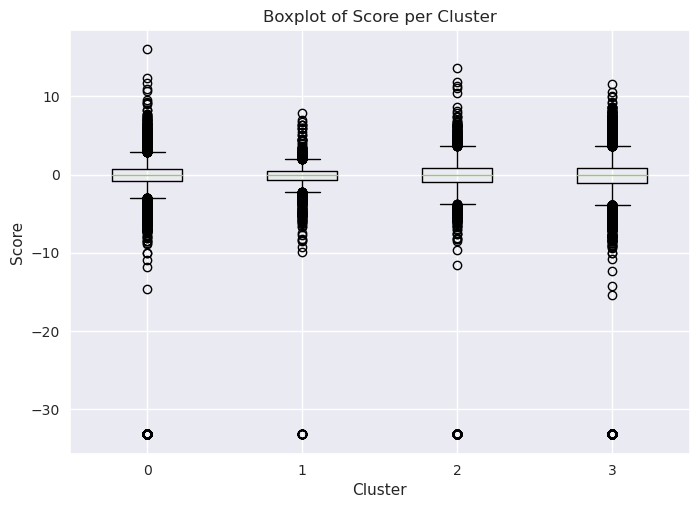

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
cluster_df

,Recency,Frequency,Monetary,installments_sum,installments_mean,purchase_date_count,category_2_x_mean,category_1_x_mean,category_3_mean,first_active_month,feature_1,feature_2,feature_3,score,cluster
165789,6,39,-24.56689,0.00000,0.00000,39,1.64103,0.00000,0.00000,11,2,2,0,-0.81739,3
43663,216,186,-134.04493,0.00000,0.00000,186,1.00000,0.00000,0.00000,71,3,3,1,0.36938,3
201089,210,99,-29.44888,99.00000,1.00000,99,1.00000,0.00000,1.00000,61,4,1,0,1.50485,0
107580,68,222,-142.48586,3.00000,0.01351,222,2.92793,0.00000,0.01351,73,2,2,0,3.92317,3
163887,25,21,-14.51061,4.00000,0.19048,21,2.66667,0.00000,0.19048,62,3,1,1,1.38975,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191018,5,198,-107.81537,217.00000,1.09596,198,-110.10101,0.09091,1.04545,68,4,1,0,0.08588,0
87408,189,45,-32.72181,0.00000,0.00000,45,2.64444,0.00000,0.00000,23,3,3,1,-0.07189,3
46450,0,96,-47.69585,115.00000,1.19792,96,-50.91667,0.03125,1.12500,62,1,1,0,-1.30931,0
176175,0,150,5441.49183,2.00000,0.01333,150,1.00000,0.00000,0.01333,68,3,2,1,-1.57749,3


In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-0.07125657 -0.28524712  0.00689278  0.27576609  0.63010562 -0.28524712
  0.12001386 -0.07195521  0.91504792  0.05095999 -0.00058878 -0.19998469
 -0.28874474 -0.00382877]
Centroid of cluster 1: [-0.42983046  2.63742267 -0.10293181  1.63088471 -0.13933597  2.63742267
  0.21086184 -0.2019868  -0.05641225 -0.14934693 -0.05872852 -0.10240984
 -0.24863382 -0.00404183]
Centroid of cluster 2: [ 0.15119023 -0.42367569  0.00433289  0.27879402  1.18162691 -0.42367569
 -2.50766339  2.61758567  0.99664255  0.01686649  0.01885884 -0.24320471
 -0.3258532  -0.10631928]
Centroid of cluster 3: [ 0.10521045 -0.11014681  0.01061726 -0.58260483 -0.78278712 -0.11014681
  0.38282118 -0.45001588 -1.01105919 -0.0231537   0.00663597  0.24595207
  0.3670846   0.02636752]


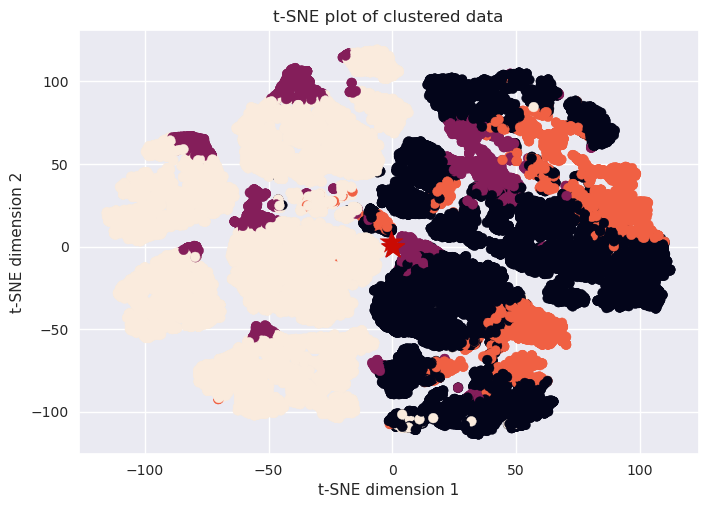

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=2
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(df_scaled)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[0 0 1 ... 1 0 0]
[[ 0.08016045  0.10134383  0.00399432 -0.56534837 -0.7556072   0.10134383
   0.38705239 -0.45155729 -0.96607209 -0.03263511  0.01527452  0.28035426
   0.36642981  0.02611347]
 [-0.0761221  -0.09623831 -0.00379309  0.53686712  0.71754105 -0.09623831
  -0.36755338  0.42880863  0.91740309  0.03099101 -0.01450501 -0.26623051
  -0.34796973 -0.02479792]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

585123.964162865


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({0: 24337, 1: 25663})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(df_scaled)

# Print the labels
print(labels1)


[0 0 1 ... 1 0 0]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(df_scaled)

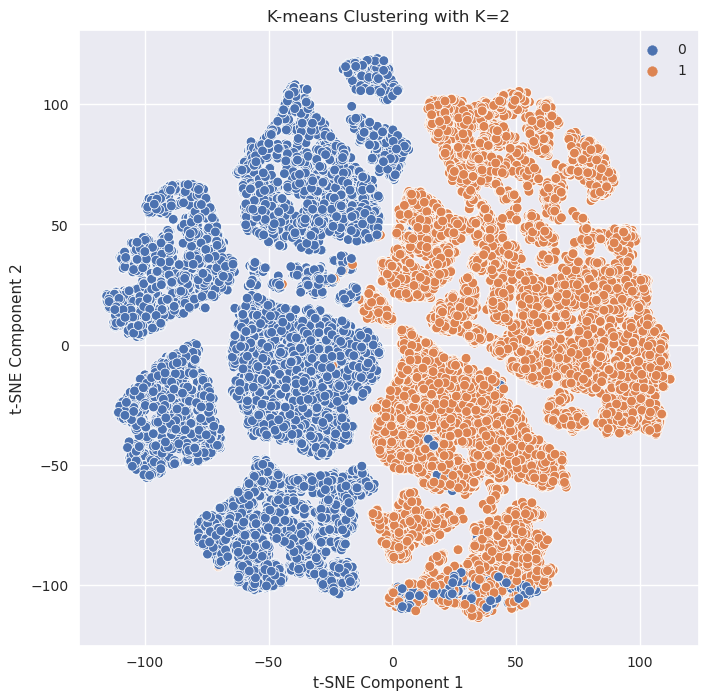

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=2')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                     Monetary                      installments_sum                    installments_mean                 purchase_date_count                    category_2_x_mean                     category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                 
            mean   median      std      mean   median       std      mean    median        std             mean   median       std              mean  median     std                mean   median       std              mean    median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                         
0       63.99527 30.00000 82.23333 109.53482 71.00000 118.72515 -23.44882 -44.48144 1503.71564          3.80696  0.00000  12.49625           0.05885 0.00000 0.20045           109.53482 71.00000 118.72515         -29.44672   1.00000 128.66119           0.00779 0.00000 0.02902         0.05458 0.00000 0.19010           39.95106 41.00000 22.41469   3.12471 3.00000 0.94173   1.95834 2.00000 0.58771   0.74582 1.00000 0.43541 -0.28876 -0.06533 3.30159
1       52.04688 25.00000 70.12526  87.84503 56.00000  98.68781 -32.99084 -26.75763  884.84562        123.07871 85.00000 125.48049           1.63837 1.35714 0.99306            87.84503 56.00000  98.68781        -200.07754 -86.48772 264.37765           0.18421 0.07792 0.24976         1.25563 1.19118 0.23461           41.38363 43.00000 22.70637   3.08990 3.00000 1.38179   1.54775 1.00000 0.83418   0.39208 0.00000 0.48822 -0.47999  0.00000 4.17858

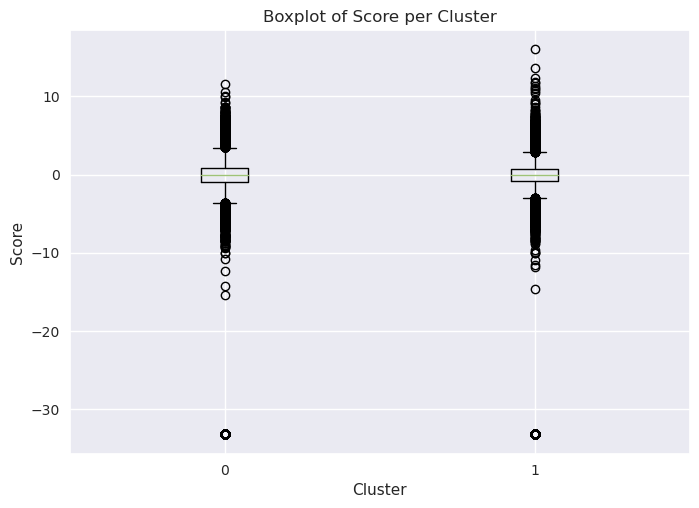

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [ 0.08016045  0.10134383  0.00399432 -0.56534837 -0.7556072   0.10134383
  0.38705239 -0.45155729 -0.96607209 -0.03263511  0.01527452  0.28035426
  0.36642981  0.02611347]
Centroid of cluster 1: [-0.0761221  -0.09623831 -0.00379309  0.53686712  0.71754105 -0.09623831
 -0.36755338  0.42880863  0.91740309  0.03099101 -0.01450501 -0.26623051
 -0.34796973 -0.02479792]


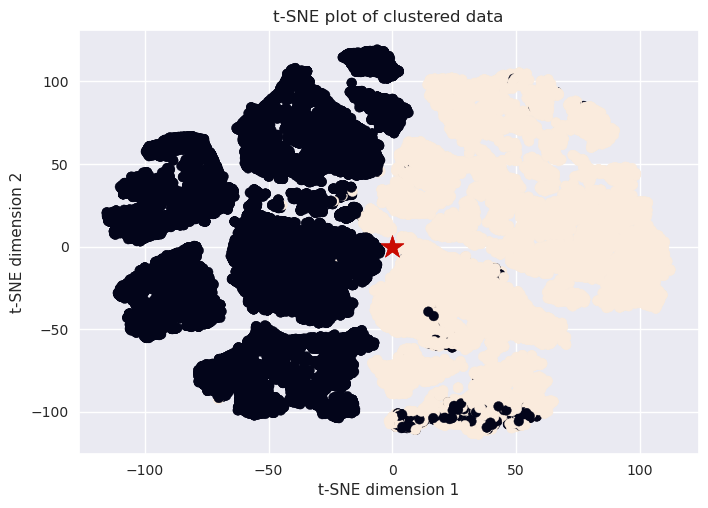

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

**The result of the clustering analysis, it appears that k=6 is the best choice for the number of clusters. However, there seems to be some overlap between the clusters, which may be improved by applying PCA to the data.**

# **PCA**

In [ ]:
'''# create a PCA object to capture 85% of variance
pca = PCA(n_components=0.85)

# fit and transform the input data
X_pca = pca.fit_transform(df_scaled)

# print the transformed data
print(X_pca)'''

'# create a PCA object to capture 85% of variance\npca = PCA(n_components=0.85)\n\n# fit and transform the input data\nX_pca = pca.fit_transform(df_scaled)\n\n# print the transformed data\nprint(X_pca)'

In [ ]:
# create a PCA object with 2 principal components
pca = PCA(n_components=2)

# fit and transform the input data
X_pca = pca.fit_transform(df_scaled)

# print the percentage of variance explained by each principal component
print("Explained variance ratio:", pca.explained_variance_ratio_)

Explained variance ratio: [0.22138336 0.17070538]


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: F

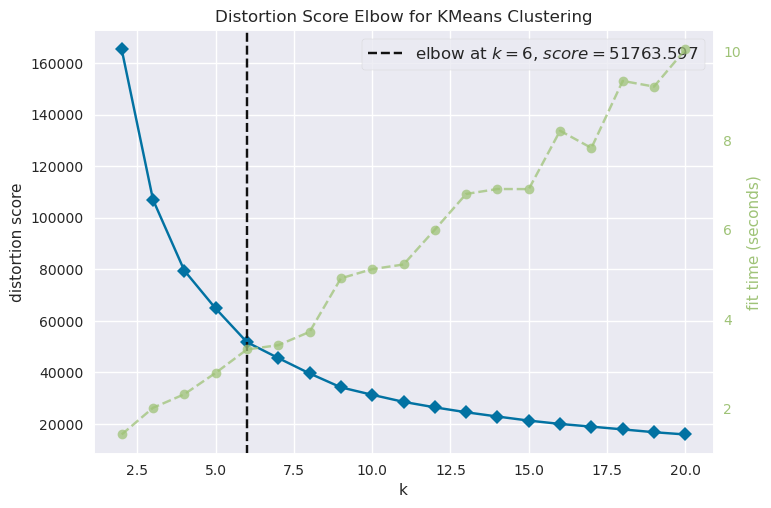

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Now, we can perform clustering on the above data
# Visualize performance of KMeans at various values k
# This approaches uses distortion score to evaluate KMeans
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 21))

visualizer.fit(X_pca)
visualizer.show()

**Silhouette score**

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 2, Silhouette Score: 0.442, Change from Previous Cluster: 0.0


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 3, Silhouette Score: 0.483, Change from Previous Cluster: 0.041


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 4, Silhouette Score: 0.476, Change from Previous Cluster: -0.007


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 5, Silhouette Score: 0.475, Change from Previous Cluster: -0.001


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 6, Silhouette Score: 0.486, Change from Previous Cluster: 0.011


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 7, Silhouette Score: 0.454, Change from Previous Cluster: -0.032


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 8, Silhouette Score: 0.43, Change from Previous Cluster: -0.024


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


No. Clusters: 9, Silhouette Score: 0.436, Change from Previous Cluster: 0.006


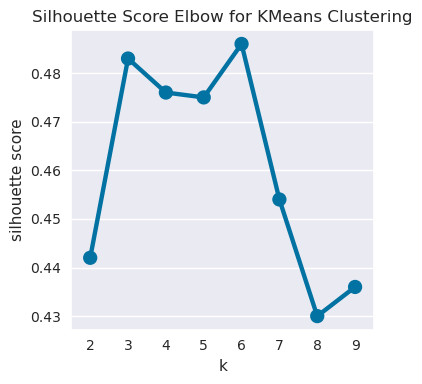

In [ ]:
# Evaluate KMeans at various values k, Silhouette score is open used
# Define a function to test KMeans at various k
# This approach uses silhouette score to evaluate KMeans
def optimal_kmeans(dataset, start=2, end=11):
    '''
    Calculate the optimal number of kmeans

    INPUT:
        dataset : dataframe. Dataset for k-means to fit
        start : int. Starting range of kmeans to test
        end : int. Ending range of kmeans to test
    OUTPUT:
        Values and line plot of Silhouette Score.
    '''

    # Create empty lists to store values for plotting graphs
    n_clu = []
    km_ss = []

    # Create a for loop to find optimal n_clusters
    for n_clusters in range(start, end):

        # Create cluster labels
        kmeans = KMeans(n_clusters=n_clusters)
        labels = kmeans.fit_predict(dataset)

        # Calcualte model performance
        silhouette_avg = round(silhouette_score(dataset, labels,
                                                random_state=1), 3)

        # Append score to lists
        km_ss.append(silhouette_avg)
        n_clu.append(n_clusters)

        print("No. Clusters: {}, Silhouette Score: {}, Change from Previous Cluster: {}".format(
            n_clusters,
            silhouette_avg,
            (km_ss[n_clusters - start] - km_ss[n_clusters - start - 1]).round(3)))

        # Plot graph at the end of loop
        if n_clusters == end - 1:
            plt.figure(figsize=(4,4))

            plt.title('Silhouette Score Elbow for KMeans Clustering')
            plt.xlabel('k')
            plt.ylabel('silhouette score')
            sns.pointplot(x=n_clu, y=km_ss)
            plt.savefig('silhouette_score.png', format='png', dpi=300,
                        pad_inches=2.0)
            plt.tight_layout()
            plt.show()

optimal_kmeans(X_pca, 2, 10)

In [ ]:
k=10
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(X_pca)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 4 6 ... 0 4 1]
[[ 0.84769614  1.04862103]
 [-1.40791668 -1.04859619]
 [ 2.11742633 -0.429482  ]
 [ 1.09649035  3.70004897]
 [-1.57564767  0.09732627]
 [ 4.3565016  -0.72941394]
 [ 0.52874408 -0.56400158]
 [ 0.79431369  9.15143562]
 [-1.96844738  1.84503297]
 [-2.60194044  4.79930331]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

31333.510528955823


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 13030,
         4: 6997,
         6: 10791,
         8: 2478,
         2: 5800,
         0: 5551,
         5: 2519,
         7: 325,
         3: 1850,
         9: 659})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(X_pca)

# Print the labels
print(labels1)


[1 4 6 ... 0 4 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(X_pca)

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=10')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                     Monetary                      installments_sum                    installments_mean                 purchase_date_count                    category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                  Cluster                
            mean   median      std      mean   median       std      mean    median        std             mean   median       std              mean  median     std                mean   median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std    mean  median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
0       65.19565 30.00000 83.40602 105.55822 68.00000 115.70875 -23.49706 -42.35729 1452.87882          8.01515  1.00000  22.14100           0.13930 0.00552 0.35076           105.55822 68.00000 115.70875         -23.29873    1.00000 105.71506           0.00789 0.00000 0.02724         0.13200 0.00562 0.33425           40.09474 41.00000 22.45891   3.18948 3.00000 0.97889   1.95137 2.00000 0.62206   0.75790 1.00000 0.42836 -0.28208 -0.05548 3.29482 0.00000 0.00000 0.00000
1       49.87258 24.00000 67.26238  90.60523 57.00000 101.60172 -33.63016 -27.15965  916.25844        127.14176 89.00000 128.60109           1.66524 1.38403 1.02602            90.60523 57.00000 101.60172        -219.14871 -104.26316 273.53455           0.19689 0.09091 0.25411         1.25837 1.20000 0.25601           41.33095 43.00000 22.68581   3.01680 3.00000 1.37506   1.52558 1.00000 0.81821   0.35327 0.00000 0.47800 -0.50113 -0.00361 4.24017 1.00000 1.00000 0.00000

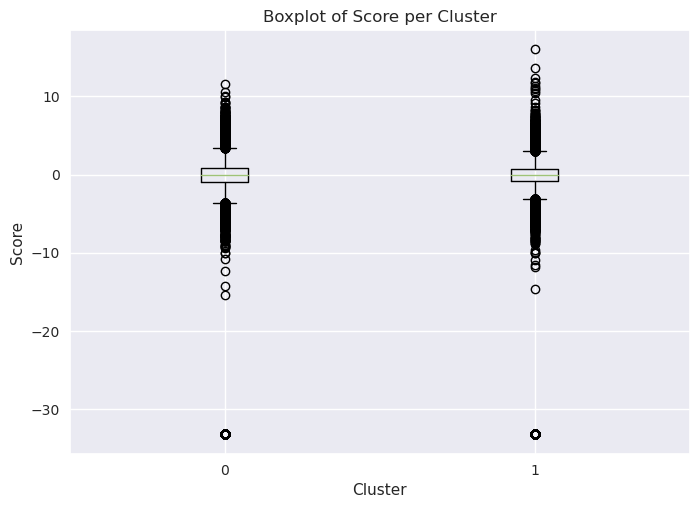

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-1.38801929 -0.26564826]
Centroid of cluster 1: [1.51724547 0.29038042]


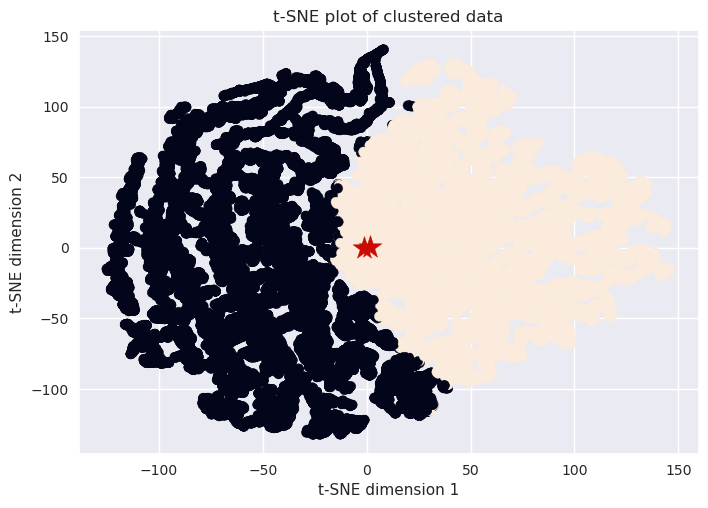

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=8
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(X_pca)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 7 6 ... 6 7 1]
[[ 0.98130472  2.16106039]
 [-1.40966461 -0.94946977]
 [ 2.03473268 -0.36102158]
 [-2.2749841   3.31536182]
 [ 0.65732446  7.32516909]
 [ 4.30067171 -0.728282  ]
 [ 0.54318893 -0.34749578]
 [-1.67403601  0.55955165]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

39632.438113658754


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 15360,
         7: 6316,
         6: 12809,
         2: 6311,
         5: 2647,
         0: 4260,
         4: 706,
         3: 1591})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(X_pca)

# Print the labels
print(labels1)


[1 7 6 ... 6 7 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(X_pca)

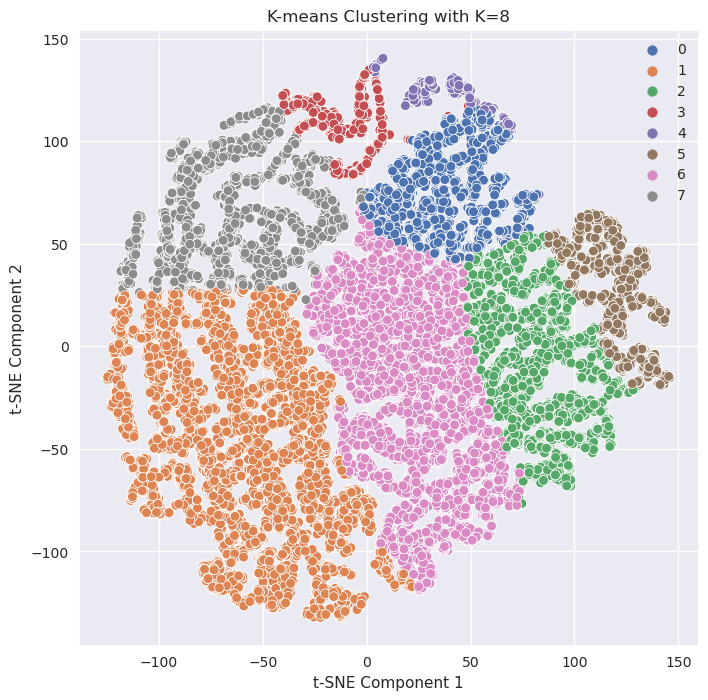

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=8')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                       Monetary                       installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                  Cluster                
            mean   median      std      mean    median       std       mean     median        std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std    mean  median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
0       27.33380 10.00000 42.23180 202.35493 188.00000  65.11775 -100.17331 -103.56545  140.23211        256.55775 238.00000  87.24676           1.30028 1.21071 0.34758           202.35493 188.00000  65.11775        -120.62720  -61.58503 164.35760           0.10715 0.05610 0.13962         1.13275 1.10774 0.14484           38.50986 37.00000 21.62954   2.93592 3.00000 1.50740   1.45094 1.00000 0.79248   0.29178 0.00000 0.45464 -0.58073 -0.09127 3.95939 0.99343 1.00000 0.08082
1       79.57591 45.00000 90.27778  50.45794  46.00000  29.10810   11.17620  -28.22690 1614.25458          1.78470   0.00000   5.59759           0.04483 0.00000 0.15614            50.45794  46.00000  29.10810         -14.43351    1.00000  60.66889           0.00742 0.00000 0.02617         0.04112 0.00000 0.14737           40.94753 42.00000 22.54049   3.15267 3.00000 0.90786   1.94219 2.00000 0.61624   0.78073 1.00000 0.41377 -0.26067 -0.02615 3.60239 0.00000 0.00000 0.00000
2       51.91475 28.00000 67.06335  48.15719  39.00000  32.58686    3.65785  -15.53728 1699.16267         85.70670  73.00000  54.54810           1.96624 1.80488 0.77607            48.15719  39.00000  32.58686        -298.29420 -264.82278 209.93277           0.25689 0.24000 0.17450         1.38583 1.35088 0.25829           41.85961 43.00000 22.95252   3.00666 2.00000 1.31333   1.46411 1.00000 0.79116   0.34527 0.00000 0.47549 -0.54643  0.00000 4.58869 1.00000 1.00000 0.00000
3       25.94909  9.00000 44.29381 418.98617 388.00000 109.81525 -108.54994 -249.74004 2797.94866          7.10937   4.00000  27.48359           0.01786 0.00877 0.07364           418.98617 388.00000 109.81525         -11.41308    1.00000  78.58390           0.00225 0.00000 0.00639         0.01682 0.00877 0.07189           36.41483 36.00000 21.45673   3.20113 3.00000 1.14366   1.96983 2.00000 0.43477   0.64928 1.00000 0.47735 -0.28420 -0.10046 1.88263 0.00503 0.00000 0.07075
4       19.76771  5.00000 34.86179 556.93343 482.00000 210.76767 -299.70431 -282.83954  241.09571        554.08357 539.00000 280.87764           1.13576 1.11967 0.73124           556.93343 482.00000 210.76767        -110.39608  -47.19028 170.20514           0.10018 0.04302 0.15181         0.96602 1.05612 0.35079           36.50425 36.00000 20.51246   2.72663 3.00000 1.64521   1.46884 1.00000 0.73977   0.23938 0.00000 0.42701 -0.45367 -0.07280 3.25642 0.88952 1.00000 0.31371
5       77.19418 62.00000 76.54214  36.71250  26.00000  34.19031  -10.79276   -8.32772   30.86295         92.20740  62.00000 108.72149           2.70460 2.22727 2.31463         

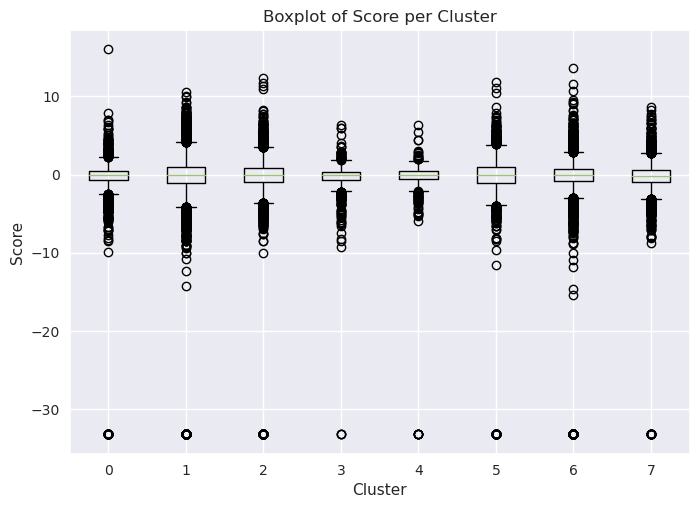

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [0.98130472 2.16106039]
Centroid of cluster 1: [-1.40966461 -0.94946977]
Centroid of cluster 2: [ 2.03473268 -0.36102158]
Centroid of cluster 3: [-2.2749841   3.31536182]
Centroid of cluster 4: [0.65732446 7.32516909]
Centroid of cluster 5: [ 4.30067171 -0.728282  ]
Centroid of cluster 6: [ 0.54318893 -0.34749578]
Centroid of cluster 7: [-1.67403601  0.55955165]


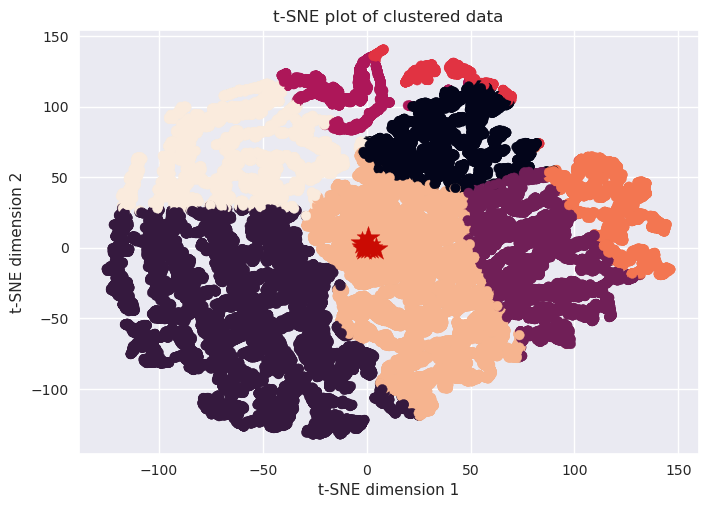

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=6
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(X_pca)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[0 0 1 ... 1 0 0]
[[-1.41950583 -0.79297681]
 [ 0.82929542 -0.36518851]
 [ 1.02529247  2.00231145]
 [-0.20277504  6.67463786]
 [ 3.54323891 -0.60754821]
 [-1.88524698  1.50295205]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

51764.29397973762


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({0: 18459, 1: 16200, 5: 4780, 2: 4669, 4: 4857, 3: 1035})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(X_pca)

# Print the labels
print(labels1)


[0 0 1 ... 1 0 0]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(X_pca)

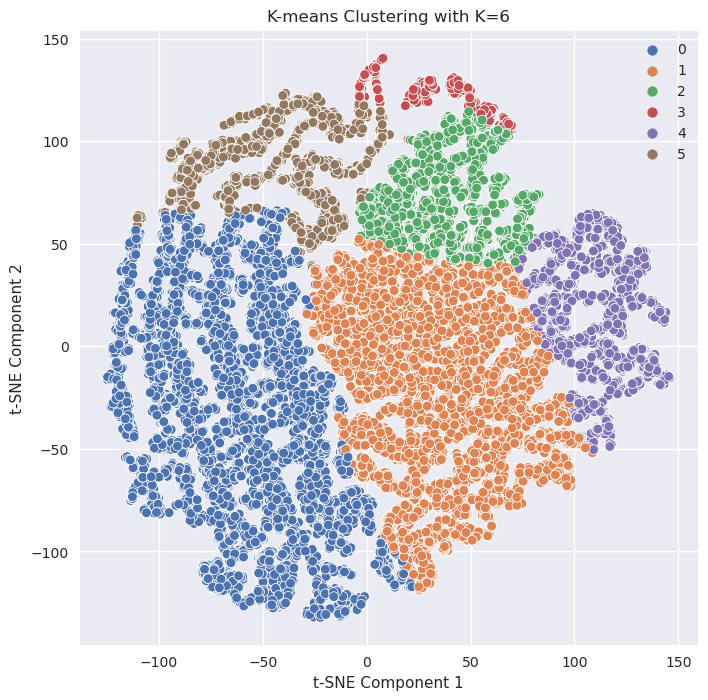

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=6')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                       Monetary                       installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                  Cluster                
            mean   median      std      mean    median       std       mean     median        std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std    mean  median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
0       73.04464 38.00000 86.94142  62.38875  54.00000  39.58929   -0.19222  -33.62983 1480.33207          2.46915   0.00000   8.25139           0.05257 0.00000 0.18061            62.38875  54.00000  39.58929         -15.10652    1.00000  65.51533           0.00730 0.00000 0.02580         0.04878 0.00000 0.17279           40.60447 42.00000 22.52061   3.13224 3.00000 0.91247   1.94599 2.00000 0.61155   0.76776 1.00000 0.42228 -0.27579 -0.04808 3.48606 0.00000 0.00000 0.00000
1       56.83265 27.00000 75.42372  53.80790  48.00000  31.78715  -11.60039  -23.67017 1109.82908         72.79975  66.00000  42.85309           1.44516 1.32500 0.54112            53.80790  48.00000  31.78715        -114.32740  -54.55556 173.87770           0.08467 0.04348 0.10638         1.21363 1.19118 0.29074           42.24673 43.00000 22.98025   3.14284 3.00000 1.30704   1.63154 1.00000 0.87116   0.45704 0.00000 0.49817 -0.39104  0.00000 3.90127 0.84772 1.00000 0.35931
2       28.00664 10.00000 42.83044 191.78989 177.00000  63.60484  -93.69682  -97.76363  146.66502        246.71621 227.00000  89.77280           1.32569 1.21678 0.42110           191.78989 177.00000  63.60484        -128.92539  -65.58385 171.47249           0.11317 0.05923 0.14357         1.13985 1.11236 0.15196           38.51746 37.00000 21.71585   2.95245 3.00000 1.49431   1.44935 1.00000 0.79297   0.29749 0.00000 0.45720 -0.62128 -0.09032 4.15309 0.99208 1.00000 0.08868
3       19.54010  5.00000 35.74378 557.39614 525.00000 187.37885 -281.90591 -305.16851  515.46510        407.90338 457.00000 325.36158           0.84464 1.05959 0.68735           557.39614 525.00000 187.37885         -78.77873  -22.67647 149.81207           0.07014 0.02058 0.13077         0.74134 1.03100 0.50524           36.61836 36.00000 20.71466   2.86570 3.00000 1.58399   1.58841 1.00000 0.70276   0.33043 0.00000 0.47060 -0.40716 -0.08045 2.77839 0.68213 1.00000 0.46588
4       66.50587 48.00000 72.86030  40.13609  29.00000  33.58711  -13.63357   -9.93966   29.33443         88.64464  67.00000  87.82105           2.45765 2.08696 1.83778            40.13609  29.00000  33.58711        -614.07956 -603.33803 272.37669           0.57509 0.56250 0.28525         1.40286 1.37662 0.29025           41.60861 43.00000 22.69116   3.09883 3.00000 1.37138   1.50113 1.00000 0.75120   0.35660 0.00000 0.47904 -0.60962  0.00000 5.02013 1.00000 1.00000 0.00000
5       31.40293 12.00000 49.15462 257.21360 230.00000  92.51307  -90.03809 -149.07291 1724.69200          4.52720   2.00000  12.84331           0.01993 0.00877 0.07411         

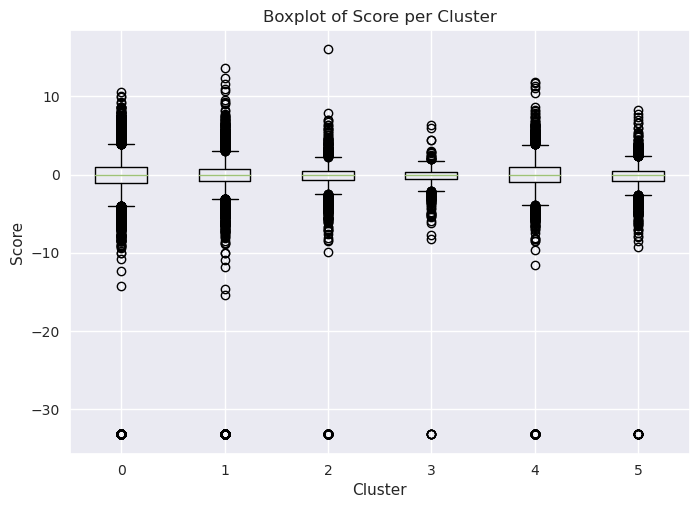

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-1.41950583 -0.79297681]
Centroid of cluster 1: [ 0.82929542 -0.36518851]
Centroid of cluster 2: [1.02529247 2.00231145]
Centroid of cluster 3: [-0.20277504  6.67463786]
Centroid of cluster 4: [ 3.54323891 -0.60754821]
Centroid of cluster 5: [-1.88524698  1.50295205]


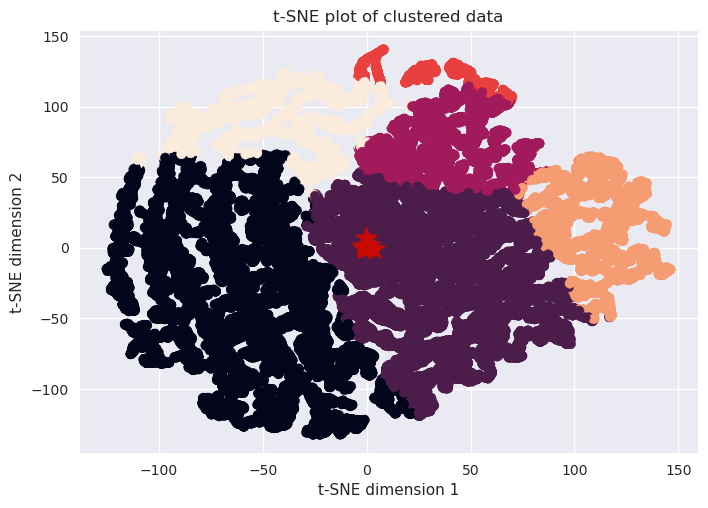

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=4
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(X_pca)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 1 3 ... 3 1 1]
[[-0.36483803  3.93407763]
 [-1.47567685 -0.51266749]
 [ 3.47016923 -0.51526512]
 [ 0.83726235 -0.10577107]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

79530.96730195094


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 21977, 3: 18718, 2: 5256, 0: 4049})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(X_pca)

# Print the labels
print(labels1)


[1 1 3 ... 3 1 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(X_pca)

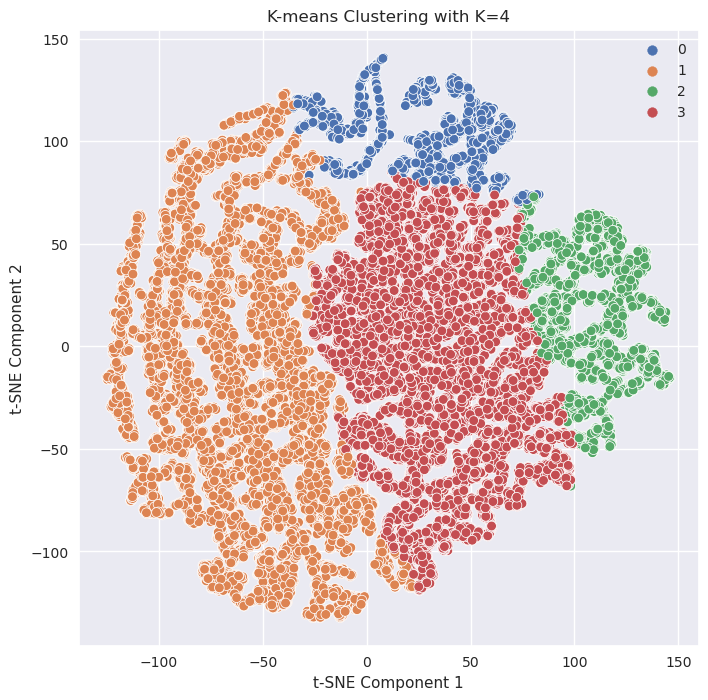

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=4')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

Recency                   Frequency                       Monetary                       installments_sum                     installments_mean                 purchase_date_count                     category_2_x_mean                      category_1_x_mean                 category_3_mean                 first_active_month                   feature_1                 feature_2                 feature_3                    score                  Cluster                
            mean   median      std      mean    median       std       mean     median        std             mean    median       std              mean  median     std                mean    median       std              mean     median       std              mean  median     std            mean  median     std               mean   median      std      mean  median     std      mean  median     std      mean  median     std     mean   median     std    mean  median     std
cluster                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
0       23.28155  7.00000 39.78983 374.49247 336.00000 160.24361 -150.54912 -201.97049 1761.84827        241.03137 259.00000 238.79595           0.74943 1.04059 0.66923           374.49247 336.00000 160.24361         -68.73202  -14.73333 137.05833           0.05827 0.01134 0.11161         0.66350 1.02252 0.54024           37.34749 37.00000 21.21657   2.97110 3.00000 1.44357   1.65374 2.00000 0.70895   0.40627 0.00000 0.49120 -0.42517 -0.08929 3.05106 0.59768 1.00000 0.49043
1       66.78032 32.00000 83.57029  85.72398  65.00000  67.51384  -15.01112  -40.92815 1390.63018          2.72899   0.00000   8.52819           0.04931 0.00000 0.17436            85.72398  65.00000  67.51384         -14.29372    1.00000  64.38836           0.00677 0.00000 0.02426         0.04581 0.00000 0.16697           40.20458 42.00000 22.46593   3.12745 3.00000 0.93022   1.94781 2.00000 0.59626   0.75502 1.00000 0.43009 -0.28755 -0.06138 3.37767 0.00000 0.00000 0.00000
2       65.18132 46.00000 72.13214  45.09247  30.00000  43.50305    9.59542  -10.50248 1859.30235         95.68208  69.00000  99.16343           2.41779 2.02778 1.79247            45.09247  30.00000  43.50305        -600.41598 -584.64308 273.30037           0.55995 0.54202 0.28527         1.39608 1.36868 0.28769           41.42751 43.00000 22.67238   3.08923 3.00000 1.36973   1.49791 1.00000 0.75481   0.35445 0.00000 0.47839 -0.63309  0.00000 5.07429 1.00000 1.00000 0.00000
3       52.81766 24.00000 72.34704  68.53478  56.00000  46.78774  -28.22303  -28.05850  311.70790         91.48429  77.00000  62.31756           1.42386 1.30769 0.51109            68.53478  56.00000  46.78774        -112.35278  -55.50373 168.36766           0.08490 0.04545 0.10463         1.20315 1.17778 0.27618           41.76611 43.00000 22.87413   3.11695 3.00000 1.33178   1.60295 1.00000 0.86149   0.43338 0.00000 0.49556 -0.42616 -0.00910 3.93302 0.86826 1.00000 0.33822

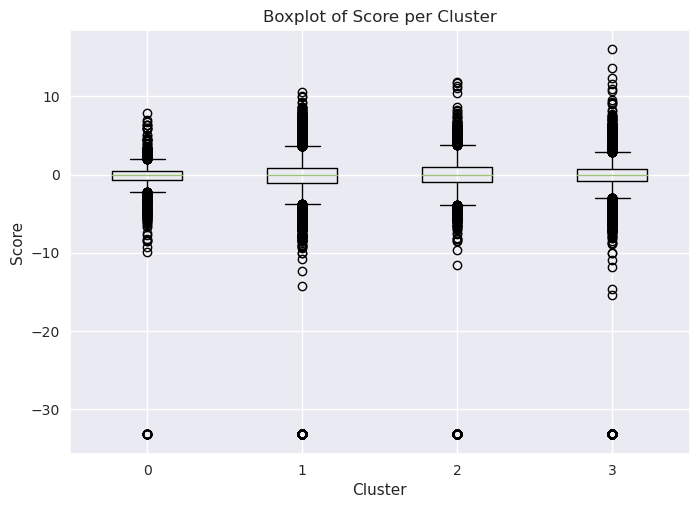

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

Centroid of cluster 0: [-0.36483803  3.93407763]
Centroid of cluster 1: [-1.47567685 -0.51266749]
Centroid of cluster 2: [ 3.47016923 -0.51526512]
Centroid of cluster 3: [ 0.83726235 -0.10577107]


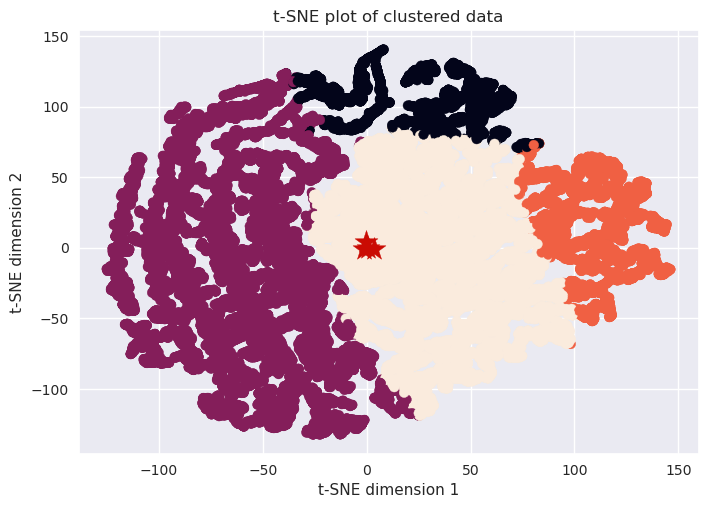

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
k=2
kmeans = KMeans(n_clusters=k,max_iter=1000).fit(X_pca)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 1 0 ... 0 1 1]
[[ 1.51198801  0.28765119]
 [-1.39344629 -0.26509899]]


In [ ]:
#The within-cluster sum of squares (WCSS) is a metric commonly used to evaluate the quality of clustering.
print(kmeans.inertia_)

165305.5937001438


In [ ]:
z = kmeans.labels_
Counter(z)

Counter({1: 26021, 0: 23979})

In [ ]:
# Predict the cluster of each row
labels1 = kmeans.predict(X_pca)

# Print the labels
print(labels1)


[1 1 0 ... 0 1 1]


In [ ]:
tsne= TSNE(n_components=2, random_state=42)
df_tsne= tsne.fit_transform(X_pca)

In [ ]:
# Visualize the resulting clusters using a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels1, palette='deep')
plt.title('K-means Clustering with K=2')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
cluster_df = pd.DataFrame(X, columns=X.columns)
cluster_df['cluster'] = labels1
cluster_stats = cluster_df.groupby('cluster').agg(['mean', 'median','std'])
cluster_stats

In [ ]:
# group the score by cluster
scores_by_cluster = cluster_df.groupby('cluster')['score']

# create a list of scores for each cluster
score_lists = [scores_by_cluster.get_group(cluster).tolist()
               for cluster in scores_by_cluster.groups.keys()]

# plot a boxplot of the scores for each cluster
plt.boxplot(score_lists)

# set the title and axis labels
plt.title('Boxplot of Score per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Score')

# set the x-axis tick labels to show the cluster numbers
plt.xticks(range(1, len(score_lists) + 1), scores_by_cluster.groups.keys())

# show the plot
plt.show()

In [ ]:
# Calculate the centroid of each cluster
centroids = kmeans.cluster_centers_

# Print the centroid of each cluster
for i in range(k):
    print(f'Centroid of cluster {i}: {centroids[i]}')

In [ ]:
# Visualize clusters
plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels1)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=300, c='r')
plt.title('t-SNE plot of clustered data')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()

In [ ]:
X['Cluster'] = kmeans.labels_
X.head()

In [ ]:
# Set up the data
data = df_kmeans_rfm[['Cluster', 'Monetary', 'Recency', 'Frequency']]

# Set up the plot
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Create the pie charts
for i, ax in enumerate(axs):
    ax.pie(data.iloc[:, i + 1], labels=data['Cluster'], autopct='%1.1f%%', startangle=90)
    ax.set_title(data.columns[i + 1])

plt.show()

In [ ]:
fig = px.scatter_3d(data , x='Monetary', y='Recency', z='Frequency',
              color='Cluster' ,
              symbol='Cluster', opacity=0.1)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0), width=820, height=500)


**After applying PCA to the data, it appears that the overlap between the clusters has been reduced, and the best choice for the number of clusters is still k=6.**

# **Frequent Pattern Mining**

In [ ]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

In [ ]:
# Read in the dataframes
usersc_df = pd.read_csv("userscore.csv")
merch_df = pd.read_csv('merchants.csv')
hist_trans_df = pd.read_csv('historical_transactions.csv')
new_trans_df = pd.read_csv('new_merchant_transactions.csv')

In [ ]:
hist_trans_df.info()

In [ ]:
category_cols = hist_trans_df.select_dtypes(include=['object']).columns.tolist()
print(category_cols)

In [ ]:
hist_trans_df[['category_1', 'category_3']]

In [ ]:
# use get_dummies to one-hot encode the categorical variable
one_hot_df = pd.get_dummies(hist_trans_df[['category_1', 'category_3']])

In [ ]:
one_hot_df.shape

In [ ]:
one_hot_df

In [ ]:
# use the Apriori algorithm to find frequent itemsets
frequent_itemsets = apriori(one_hot_df, min_support=0.01, use_colnames=True)

# generate association rules from the frequent itemsets
rules = association_rules(frequent_itemsets, metric="lift")

# sort the rules by lift in descending order
rules = rules.sort_values('lift', ascending=False)

# print the top 10 rules by lift
rules.head(10)

- the itemset {category_1_N, category_3_A} appears in 52.93% of all transactions in the dataset. The confidence value for the association rule is 0.57014, which means that more than half of the transactions that contain category_1_N also contain category_3_A.

- the itemset {category_3_A, category_1_N} appears in 52.93% of all transactions in the dataset. The confidence value for the association rule is 0.99988, which means that almost all transactions that contain category_3_A also contain category_1_N.

- {category_1_Y, category_3_C}. The support for this pattern is 0.01527, which means that this pattern appears in 1.53% of all transactions in the dataset. The confidence value for the association rule is 0.21332, which means that 21.33% of the transactions that contain category_1_Y also contain

- (category_3_C) is {category_1_N, category_3_C}. The support for this pattern is 0.04810, which means that this pattern appears in 4.81% of all transactions in the dataset. The confidence value for the association rule is 0.05181, which means that 5.18% of the transactions that contain category_1_N also contain category_3_C.

In [ ]:
merged_df=hist_trans_df[['category_1', 'category_3','card_id']]

In [ ]:
# perform left join with usersc_df
final_df = pd.merge(usersc_df, merged_df, on='card_id')

In [ ]:
final_df.head()

In [ ]:
final_df.info()

In [ ]:
freq_df=final_df[['category_1', 'category_3','score']]
freq_df

In [ ]:
# use get_dummies to one-hot encode the categorical variable
freq_df = pd.get_dummies(freq_df)
freq_df

In [ ]:
# calculate the median loyalty score
score_median = freq_df['score'].median()

In [ ]:
# split the users into two groups based on their loyalty scores
high_loyalty_users = freq_df[freq_df['score'] >= score_median]
low_loyalty_users = freq_df[freq_df['score'] < score_median]

In [ ]:
high_loyalty=high_loyalty_users.drop('score', axis=1)
low_loyalty=low_loyalty_users.drop('score', axis=1)

In [ ]:
# apply Apriori algorithm to high_loyalty_users
high_loyalty_frequent_itemsets = apriori(high_loyalty, min_support=0.01, use_colnames=True)
high_loyalty_rules = association_rules(high_loyalty_frequent_itemsets, metric='lift').sort_values('lift', ascending=False)

# apply Apriori algorithm to low_loyalty_users
low_loyalty_frequent_itemsets = apriori(low_loyalty, min_support=0.01, use_colnames=True)
low_loyalty_rules = association_rules(low_loyalty_frequent_itemsets, metric='lift').sort_values('lift', ascending=False)

# compare the top 10 rules by lift for high_loyalty_users and low_loyalty_users
print("Top 10 association rules for high-loyalty users:")
high_loyalty_rules.head(10)

In [ ]:
print("\nTop 10 association rules for low-loyalty users:")
low_loyalty_rules.head(10)

For high-loyalty users, the top 2 association rules involve the items category_1_Y and category_3_C. These rules have a lift value of over 3, indicating a strong positive relationship between the antecedent and consequent items. The support and confidence values are relatively low, but this is expected given the high threshold for the minimum support and the fact that we are only considering the top 10 rules.

For low-loyalty users, the top 2 association rules also involve the items category_1_Y and category_3_C. These rules have similar lift values to the high-loyalty rules, but the support and confidence values are slightly lower. Overall, the patterns for low-loyalty users are similar to those for high-loyalty users, but with slightly weaker relationships between the items.

These results suggest that there a differences in the behavior of users with high and low loyalty scores.